In [ ]:
### This script carries out NH on events data from three clusters.
# Changed made to functions to add cluster information and weights.
!pip install arrow

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import os
import random
import arrow
import matplotlib.pyplot as plt
import argparse
import seaborn as sns
import scipy.stats
from scipy.stats import gaussian_kde

In [ ]:
def generate_event_mark(data, value=0):
    mask = data > 0
    data = np.stack((data, np.ones_like(data) * value * mask), axis=-1)
    print(data.shape)

    return data

def Exponential_Hawkes(ts, seqs, mu, alpha, beta):
    lams = []

    for t in ts:
        mask = (seqs > 0) * (seqs < t)                                          # [ batch_size, seq_len ]
        lams.append(mu + alpha * (np.exp(-beta * np.clip(t - seqs, a_min=-1., a_max=None)) * mask).sum(1))

    lams = np.stack(lams, axis=1)

    return np.array(lams)          # [ batch_size, len_grid ]

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def push_all_zeros_back(a):
    a_flipped = torch.zeros_like(a)
    valid_mask = a[:, :, 0] > 0
    flipped_mask = valid_mask.sum(1,keepdims=True) > torch.arange(a.shape[1]-1,-1,-1, device = a.device)
    flipped_mask = torch.flip(flipped_mask, dims=(1, ))
    a_flipped[flipped_mask] = a[valid_mask]
    return a_flipped

def config_generate(T0,
                    T1,
                    tau_max,
                    train_buffer=True,
                    int_res='100',
                    nsample='50',
                    n_class='2',
                    n_cluster = '1',
                    hid_dim='1',
                    event_dim='1',
                    lr='0.01',
                    epoch='10',
                    batch_size='64',
                    opt="Adam",
                    momentum='0.0',
                    train_type="event"):
    parser = argparse.ArgumentParser()
    parser.add_argument("-T0", type=float)
    parser.add_argument("-T1", type=float)
    parser.add_argument("-tau_max", type=float)
    parser.add_argument("-int_res", type=int)
    parser.add_argument("-nsample", type=int)
    parser.add_argument("-n_class",
                        help="Number of types in the dataset, default is 2", type=int, default=2)
    parser.add_argument("-n_cluster", type=int, default=1)
    parser.add_argument("-hid_dim", type=int, default=1)
    parser.add_argument("-event_dim", type=int, default=1)
    parser.add_argument("-n_layers", type=int, default=1)
    parser.add_argument("-lr", type=float, default=0.01)
    parser.add_argument("-momentum", type=float, default=0.0)
    parser.add_argument("-epoch", type=int, default=30)
    parser.add_argument("-batch_size", type=int, default=64)
    parser.add_argument("-opt", type=str, default='Adam')
    parser.add_argument("-train_type", type=str, default='event')
    parser.add_argument("-train_buffer", action='store_true')
    parser.add_argument("-no-train_buffer", dest='train_buffer', action='store_false')
    parser.set_defaults(train_buffer=True)

    arg_list = ['-T0', T0,
                '-T1', T1,
                '-tau_max', tau_max,
                '-int_res', int_res,
                '-nsample', nsample,
                '-n_class', n_class,
                '-n_cluster', n_cluster,
                '-hid_dim', hid_dim,
                '-event_dim', event_dim,
                '-lr', lr,
                '-epoch', epoch,
                '-batch_size', batch_size,
                '-opt', opt,
                '-momentum', momentum,
                '-train_type', train_type
                ]

    if not train_buffer:
        print("Do not train_buffer!")
        arg_list.append("-no-train_buffer")

    config = parser.parse_args(arg_list)

    return config

def IPTW_train_1d(h_smp, mask_smp, cluster_smp, n_elements, n_cluster):
    """
    Train the counting tensor for each sampled h_i|h_i-1 transition.
    - h_smp:                                                                    [ batch_size, seq_len+seq_len_buff, self.hid_dim ]
    - mask_smp:                                                                 [ batch_size, seq_len+seq_len_buff ]
    - cluster_smp:                                                              [ batch_size, ]
    - n_elements:                                                                 int
    - n_cluster:                                                                  int
    - H_map:                                                                    [ n_elements, n_elements, n_cluster]
    """
    # no. of different clusters
    m = n_cluster
    N_1, N_2, _ = h_smp.shape

    H_map = np.zeros((n_elements, n_elements, m))
    b_uni = 1.0/n_elements

    mask_full = np.zeros((N_1,N_2))
    _, len_mask = mask_smp.shape
    mask_full[:,0:len_mask] = mask_smp

    print(h_smp.shape)
    print(mask_full.shape)
    # if np.max(h_smp) > 0:
    #   adjust = 0.0
    # else:
    #   adjust = 1.0
    adjust = 1.0

    for i in range(N_1):
      c_var = int(cluster_smp[i]) - 1
      for j in range(N_2 - 1):
        h_prev = float(h_smp[i,j,])
        h_next = float(h_smp[i,j+1,])

        if ~np.isnan(h_prev) and ~np.isnan(h_next) and mask_full[i,j+1]:
          h_prev_idx = int((h_prev + adjust) // b_uni)
          h_next_idx = int((h_next + adjust) // b_uni)
          H_map[h_prev_idx, h_next_idx, c_var] += 1

    np.save('H_map.npy',H_map)
    print('histogram trained and saved')
    return H_map


def transition_plots(H_map):
    """
    Obtain transition probability matrix heatmap plots for each cluster.
    H-map:                                                                      [ n_elements, n_elements, n_cluster]
    """
    h_map_dim, _, n_cluster = H_map.shape

    for i in range(n_cluster):
      H_map_curr = H_map[:,:,i]
      if H_map[:,:,i].sum()>0.9:
        for j in range(h_map_dim):
          if H_map_curr[j,:].sum() != 0:
            H_map_curr[j,:] = H_map_curr[j,:] / H_map_curr[j,:].sum()

      fig = plt.figure(figsize = (4,4))
      ax = sns.heatmap( H_map_curr , linewidth = 1 , cmap = 'YlOrRd', vmin=0, vmax=1.0)
      ax.set(xlabel='h_i', ylabel='h_(i-1)')
      title = "Cluster " + str(i)
      plt.title( title )
      plt.show()



def model_train(train_data,
                test_data,
                buffer_train_data,
                buffer_test_data,
                train_cluster_data,
                model,
                config,
                device,
                mae_eval=False,
                ts=None,
                true_lams=None):
    """Training process"""
    train_llks = []
    test_llks = []
    test_maes = []
    test_mres = []
    wall_time = []
    n_events_train = (train_data[:, :, 0] > 0).sum()
    n_events_test = (test_data[:, :, 0] > 0).sum()
    n_events_buffer_train = (buffer_train_data[:, :, 0] > 0).sum()
    n_events_buffer_test = (buffer_test_data[:, :, 0] > 0).sum()
    n_batches = int(train_data.shape[0] / config.batch_size) # number of batches
    print("[%s] #Training sequences: %d" % (arrow.now(), train_data.shape[0]))
    print("[%s] #Testing sequences: %d" % (arrow.now(), test_data.shape[0]))
    print("[%s] #Training events: %d" % (arrow.now(), n_events_train))
    print("[%s] #Testing events: %d" % (arrow.now(), n_events_test))
    batch_idx = np.arange(train_data.shape[0])
    random.shuffle(batch_idx)
    train_data = train_data[batch_idx]
    buffer_train_data = buffer_train_data[batch_idx]
    train_cluster_data = train_cluster_data[batch_idx]

    train_data = torch.tensor(train_data, dtype=torch.float32)
    test_data = torch.tensor(test_data, dtype=torch.float32)
    buffer_train_data = torch.tensor(buffer_train_data, dtype=torch.float32)
    buffer_test_data = torch.tensor(buffer_test_data, dtype=torch.float32)
    train_cluster_data = torch.tensor(train_cluster_data, dtype=torch.float32)

    ### dimensions need for h
    hid_dim = config.hid_dim
    num_cluster = config.n_cluster
    n_elements = 10

    train_lld_batches = np.zeros((n_batches, config.epoch))
    ###

    model.to(device)

    epc = 0
    t0 = arrow.now()
    while epc < config.epoch:
        try:
            train_loss = 0
            ###
            N_user, N_train_seq,_ = train_data.shape
            _,N_train_seq_buffer,_ = buffer_train_data.shape
            h_smp_collect = np.zeros((N_user, N_train_seq + N_train_seq_buffer, hid_dim))

            whole_seq = torch.concat([buffer_train_data, train_data], dim=1)
            whole_seq = push_all_zeros_back(whole_seq)
            whole_seq = whole_seq[:, whole_seq[:, :, 0].sum(0) != 0, :]

            time = whole_seq[:, :, 0]
            mask_collect = time > 0

            # initialize H_map
            H_map = np.ones((n_elements, n_elements, num_cluster))*1.0 / n_elements

            ###
            for b in range(n_batches):
                idx  = np.arange(config.batch_size * b, config.batch_size * (b + 1))
                # call h_map in model.train
                loss, h_smp, train_lld_batches[b, epc] = model.train(train_data[idx], buffer_train_data[idx], train_cluster_data[idx], H_map, device)
                ### add h samples here
                # print(h_smp_collect.shape)
                # print(h_smp.shape)
                _,smp_len,_ = h_smp.shape
                h_smp_collect[idx,0:smp_len,:] = h_smp

                if isinstance(loss, tuple):
                    loss = loss[0]
                train_loss += loss
                # model.apply(clipper1)

            # step to obtain H_map
            H_map = IPTW_train_1d(h_smp_collect, mask_collect, train_cluster_data, n_elements, num_cluster)
            # plot the transition matrices
            transition_plots(H_map)

            if np.isnan(train_loss):
                print("Epochs %d: NaN loss! Re-initialize model!" % epc)
                b = model.baserate_mu.item()
                model = NH_new(config, device)

                for name, parameter in model.named_parameters():
                    if name == "baserate_mu":
                        parameter.data.fill_(b)
                    else:
                        parameter.data.fill_(random.gauss(0, 0.01))

                model.to(device)
                epc = 0

                train_llks = []
                test_llks = []
                test_maes = []
                test_mres = []
                wall_time = []
                t0 = arrow.now()
                continue


            train_data_loss = model.test(train_data, buffer_train_data, device)
            test_data_loss = model.test(test_data, buffer_test_data, device)
            if isinstance(train_data_loss, tuple):
                train_data_loss = train_data_loss[0]
            if isinstance(test_data_loss, tuple):
                test_data_loss = test_data_loss[0]

            train_llks.append(-train_data_loss/(n_events_train+n_events_buffer_train))
            test_llks.append(-test_data_loss/n_events_test)

            if mae_eval:
                lams,_ = model.sample_intensity(ts, test_data, buffer_test_data, device=device)
                mae = np.mean(np.abs(lams - true_lams))
                mre = np.mean(np.abs(lams - true_lams) / true_lams)
                test_maes.append(mae)
                test_mres.append(mre)


            if (epc+1) % 1 == 0:
                print("[%s] Epochs %d, total loss: %.5e" % (
                    arrow.now(), epc, train_loss
                ))
                print("[%s] Training llk: %.5e" % (arrow.now(), train_llks[-1]))
                plt.figure()
                plt.plot(train_llks)
                plt.title('Log-likelihood Convergence Plot')
                plt.xlabel('Epoch')
                plt.ylabel('lld')
                plt.show()
                print("[%s] Testing llk: %.5e" % (arrow.now(), test_llks[-1]))
                if mae_eval:
                    print("[%s] MAE:%.5f, MRE:%.5f" % (arrow.now(), mae, mre))
                print("saving model")

                if device == "cpu":
                    torch.save(model, "model.pt")
                else:
                    model.to("cpu")
                    torch.save(model, "model.pt")
                    model.to(device)

            epc += 1

            t_e = arrow.now()
            wall_time.append((t_e - t0).total_seconds())

        except KeyboardInterrupt:
                break
    np.save('lld-iter.npy',train_llks)
    print("training done!")

    return model.to("cpu"), train_llks, test_llks, test_maes, test_mres, wall_time, train_lld_batches

In [ ]:
class NH_new(nn.Module):
    """
    Pytorch Implementation of Neural Hawkes (Mei, et.al 2017)
    """
    def __init__(self, config, device):
        super(NH_new, self).__init__()

        self.T0 = config.T0
        self.T1 = config.T1
        self.hid_dim = config.hid_dim
        self.n_class = config.n_class
        self.n_cluster = config.n_cluster
        self.config = config

        # no. of points in discretization



        # Parameters
        # recurrent cells
        self.rec = nn.Linear(2*self.hid_dim, 7*self.hid_dim)
        # output mapping from hidden vectors to unnormalized intensity
        self.wa = nn.Linear(self.hid_dim, self.n_class)
        # embedding layer for valid events, including BOS
        self.emb = nn.Embedding(self.n_class+1, self.hid_dim)

        # Other parameters
        self.baserate_mu = nn.Parameter(torch.tensor([0.1]*self.n_class), requires_grad=False)

        # optimizer
        self.optimizer = self.set_optimizer(config.opt, config.lr, config.momentum)

    def set_optimizer(self, opt, lr, momentum):
        if opt == 'SGD':
            return torch.optim.SGD(self.parameters(), lr=lr, momentum=momentum)
        elif opt == 'Adam':
            return torch.optim.Adam(self.parameters(), lr=lr)
        elif opt == 'Adadelta':
            return torch.optim.Adadelta(self.parameters(), lr=lr)
        else:
            ValueError("No such optimizer!")

    def init_states(self, batch_size, device):
        """
        Initialize hidden state and cell state.
        """
        # h_d = torch.zeros(batch_size, self.hid_dim, dtype=torch.float)
        # c_d = torch.zeros(batch_size, self.hid_dim, dtype=torch.float)
        # c_bar = torch.zeros(batch_size, self.hid_dim, dtype=torch.float)
        # c = torch.zeros(batch_size, self.hid_dim, dtype=torch.float)
        # o = torch.zeros(batch_size, self.hid_dim, dtype=torch.float)
        # delta = torch.zeros(batch_size, self.hid_dim, dtype=torch.float)

        A = torch.zeros(batch_size, 4*self.hid_dim, dtype=torch.float32, device=device)

        return torch.chunk(A, 4, dim=-1)

    def state_update(self, emb_event_t, h_d_tm1, c_tm1, c_bar_tm1):
        """
        State update in CTLSTM when a new event happens.
        """
        feed = torch.cat((emb_event_t, h_d_tm1), dim=1)                         # [ batch_size, 2 * self.hid_dim ]
        (gate_i,
        gate_f,
        gate_z,
        gate_o,
        gate_i_bar,
        gate_f_bar,
        gate_delta) = torch.chunk(torch.sigmoid(self.rec(feed)), 7, -1)         # [ batch_size, self.hid_dim ]

        gate_z = 2 * gate_z - 1
        gate_delta = nn.functional.softplus(torch.log(gate_delta / (1 - gate_delta)))

        c_t = gate_f * c_tm1 + gate_i * gate_z
        c_bar_t = gate_f_bar * c_bar_tm1 + gate_i_bar * gate_z

        # h_t = gate_o * torch.tanh(c_t)

        return c_t, c_bar_t, gate_o, gate_delta

    def decay(self, c_t, c_bar_t, o_t, delta_t, duration_t):
        """
        Compute cell and hidden states after decaying over duration_t.
        """
        c_d_t = c_bar_t + (c_t - c_bar_t) * \
            torch.exp(-delta_t * duration_t.unsqueeze(-1))

        h_d_t = o_t * torch.tanh(c_d_t)

        return c_d_t, h_d_t

    def scan(self, X, device):
        """
        Compute states at all event times for conditional intensity function calculation.

        - X: input sequence including BOS.          [ batch_size, seq_len, data_dim = 2 ]
        """

        batch_size, seq_len, _ = X.shape
        X = X.to(device)
        # h_list, c_list, c_bar_list, o_list, delta_list = [], [], [], [], []
        output_state_list = []                                                  # c_list, c_bar_list, o_list, delta_list, containing
                                                                                # the information of i-th event
        h_list = []                                                             # the hidden state to compute intensity at i-th event time
        time = X[:, :, 0]
        event = X[:, :, 1].long()
        time_duration = torch.diff(time, dim=-1, prepend=time[:, [0]])
        time_duration[time_duration < 0] = 0

        c_t, c_bar_t, o_t, delta_t = self.init_states(batch_size, device)

        for i in range(seq_len):
            c_d, h_d = self.decay(c_t, c_bar_t, o_t, delta_t, time_duration[:, i])
            h_list.append(h_d)
            c_t, c_bar_t, o_t, delta_t = self.state_update(self.emb(event[:, i]), h_d, c_d, c_bar_t)
            output_state_list.append(torch.stack([c_t, c_bar_t, o_t, delta_t]))

        h_seq = torch.stack(h_list, dim=1)                                      # [ batch_size, seq_len, self.hid_dim ]
        output_seq = torch.stack(output_state_list, dim=-2)                     # [ 4, batch_size, seq_len, self.hid_dim ]

        return h_seq, output_seq

##################################################################
    # def IPTW_train_1d(self, h_smp, mask_smp, cluster_smp, n_elements):
    #   """
    #   Train the counting tensor for each sampled h_i|h_i-1 transition.
    #   - h_smp:                                                                  [ batch_size, seq_len+seq_len_buff, self.hid_dim ]
    #   - mask_smp:                                                               [ batch_size, seq_len+seq_len_buff ]
    #   - cluster_smp:                                                            [ batch_size, ]
    #   - n_elements:                                                               int
    #   - H_map:                                                                  [ n_elements, n_elements, self.n_cluster]
    #   """
    #   # no. of different clusters
    #   m = self.n_cluster
    #   N_1, N_2, _ = h_smp.shape

    #   H_map = np.zeros((n_elements, n_elements, m))
    #   b_uni = 1.0/n_elements

    #   if np.max(h_smp) > 0:
    #     adjust = 0.0
    #   else:
    #     adjust = 1.0

    #   for i in range(N_1):
    #     c_var = int(cluster_smp[i]) - 1
    #     for j in range(N_2 - 1):
    #       h_prev = float(h_smp[i,j,])
    #       h_next = float(h_smp[i,j+1,])
    #       if ~np.isnan(h_prev) and ~np.isnan(h_next) and mask_smp[i,j+1]:
    #         h_prev_idx = int((h_prev + adjust) // b_uni)
    #         h_next_idx = int((h_next + adjust) // b_uni)
    #         H_map[h_prev_idx, h_next_idx, c_var] += 1
    #   print('histogram trained')
    #   return H_map

    def IPTW_weight_1d(self, h_smp, mask_smp, cluster_smp, H_map, n_elements):
      """
      Calculate the IPTW weights for sampled h_i|h_i-1 transition.
      - h_smp:                                                                  [ batch_size, seq_len+seq_len_buff, self.hid_dim ]
      - mask_smp:                                                               [ batch_size, seq_len+seq_len_buff ]
      - cluster_map:                                                            [ batch_size, ]
      - H_map:                                                                  [ n_elements, n_elements, self.n_cluster]
      - n_elements:                                                               int
      - h_weights:                                                              [ batch_size, seq_len+seq_len_buff ]
      """
      m = self.n_cluster
      N_1, N_2, _ = h_smp.shape
      b_uni = 2.0/n_elements

      # if np.max(h_smp) > 0:
      #   adjust = 0.0
      # else:
      #   adjust = 1.0
      adjust = 1.0

      #print(h_smp.shape)
      #print(mask_smp.shape)

      mask_full = np.zeros((N_1,N_2))
      _, len_mask = mask_smp.shape
      mask_full[:,0:len_mask] = mask_smp

      h_weights = np.ones((N_1, N_2))
      for i in range(N_1):
        c_var = int(cluster_smp[i]) - 1
        for j in range(1, N_2):
          h_prev = float(h_smp[i,j-1,])
          h_next = float(h_smp[i,j,])
          if mask_full[i,j]==0 or np.isnan(h_prev) or np.isnan(h_next):
            w_temp = 0
          else:
            h_prev_idx = int((h_prev + adjust) // b_uni)
            h_next_idx = int((h_next + adjust) // b_uni)
            w_numer = H_map[h_prev_idx, h_next_idx,:].sum()*1.0 / H_map[h_prev_idx,:,:].sum()
            w_denom = H_map[h_prev_idx, h_next_idx, c_var] * 1.0 / H_map[h_prev_idx,:,c_var].sum()
            if w_numer == 0 or w_denom == 0 or np.isinf(w_numer) or np.isinf(w_denom) or np.isnan(w_denom) or np.isnan(w_numer):
              w_temp = 1e-8
            else:
              w_temp = w_numer/w_denom
          h_weights[i,j] = h_weights[i, j-1] * w_temp
        h_weights[i,0] = 1e-8
      print('weights calculated')
      return h_weights


##################################################################

    def train(self, X, buffer, clusters, H_map, device):
        """
        Calculate log likelihood for batch X.

        - X: input sequence.                                                    [ batch_size, seq_len, 2 ]
        - buffer: buffering sequences to reduce model mismatch, events earlier
                  than first event in each training sequence, including BOS     [ batch_size, seq_len_buff, 2 ]
        - clusters: sequence of cluster index for each user                     [ batch_size, ]
        - H_map: transition counts tensor                                       [ n_elements, n_elements, n_cluster]
        - device: cpu or cuda.
        """

        assert X.shape[0] == buffer.shape[0], "invalid buffer!"

        X = X.to(device)
        buffer = buffer.to(device)
        clusters = clusters.to(device)

        whole_seq = torch.concat([buffer, X], dim=1)
        whole_seq = push_all_zeros_back(whole_seq)                              # [ batch_size, seq_len+seq_len_buff, 2 ]
        whole_seq = whole_seq[:, whole_seq[:, :, 0].sum(0) != 0, :]

        batch_size, seq_len, _ = whole_seq.shape

        time = whole_seq[:, :, 0]
        event = whole_seq[:, :, 1].long()
        mask = time > 0
        mask_b = buffer[:, :, 0] > 0
        idx_mat = torch.arange(whole_seq.shape[1], device=device).unsqueeze(0).repeat(whole_seq.shape[0], 1)
                                                                                # [ batch_size, seq_len+seq_len_buff ]
        m = (idx_mat >= mask_b.sum(1, keepdim=True)) * (idx_mat < mask.sum(1, keepdim=True))
                                                                                # [ batch_size, seq_len+seq_len_buff ]

        h, output = self.scan(whole_seq, device=device)                         # [ batch_size, seq_len+seq_len_buff, self.hid_dim ],  [ 4, batch_size, seq_len+seq_len_buff, self.hid_dim ]
        ########################################################################
        ### obtain the model for weights from all the hidden variable h
        h_smp = h.cpu().detach().numpy()                                        # [ batch_size, seq_len+seq_len_buff, self.hid_dim ]
        #print(np.min(h_smp))
        #print(np.max(h_smp))

        cluster_smp = clusters.cpu().detach().numpy()                           # [ batch_size, ]
        mask_smp = mask.cpu().detach().numpy()                                  # [ batch_size, seq_len+seq_len_buff ]

        #print(h_smp.shape)
        #print(mask_smp.shape)
        # define the discretization setting
        # n_elements = 10
        # H_map = self.IPTW_train_1d(h_smp, mask_smp, cluster_smp, n_elements)

        # plot the the heatmaps for transitions across three clusters
        # if np.max(h_smp) > 0:
        #   axis_labels = [0.05, 0.15, 0.25, 0.35, 0.45, 0.55, 0.65, 0.75, 0.85, 0.95]
        # else:
        #   axis_labels = [-0.95,-0.85,-0.75,-0.65,-0.55,-0.45,-0.35,-0.25,-0.15,-0.05] # labels


        # H_map_1 = H_map[:,:,0]
        # if H_map[:,:,0].sum()>0.9:
        #   H_map_1 = H_map_1 / (H_map[:,:,0].sum())

        # # print(H_map[:,:,0])
        # # print(H_map[:,:,0].sum())


        # fig = plt.figure(figsize = (4,4))
        # ax = sns.heatmap( H_map_1 , linewidth = 1 , cmap = 'YlOrRd', vmin=0, vmax=0.5, xticklabels=axis_labels, yticklabels=axis_labels)
        # ax.set(xlabel='h_i', ylabel='h_(i-1)')
        # plt.title( "Cluster 1" )
        # plt.show()

        # H_map_2 = H_map[:,:,1]
        # if H_map[:,:,1].sum()>0.9:
        #   H_map_2 = H_map_2 / (H_map[:,:,1].sum())

        # # print(H_map[:,:,1])
        # # print(H_map[:,:,1].sum())

        # fig = plt.figure(figsize = (4,4))
        # ax = sns.heatmap( H_map_2 , linewidth = 1 , cmap = 'YlOrRd', vmin=0, vmax=0.5, xticklabels=axis_labels, yticklabels=axis_labels )
        # ax.set(xlabel='h_i', ylabel='h_(i-1)')
        # plt.title( "Cluster 2" )
        # plt.show()

        # H_map_3 = H_map[:,:,2]
        # if H_map[:,:,2].sum()>0.9:
        #   H_map_3 = H_map_3 / (H_map[:,:,2].sum())

        # fig = plt.figure(figsize = (4,4))
        # ax = sns.heatmap( H_map_3 , linewidth = 1 , cmap = 'YlOrRd', vmin=0, vmax=0.5, xticklabels=axis_labels, yticklabels=axis_labels )
        # ax.set(xlabel='h_i', ylabel='h_(i-1)')
        # plt.title( "Cluster 3" )
        # plt.show()

        n_elements = H_map.shape[0]

        h_weights = self.IPTW_weight_1d(h_smp, mask_smp, cluster_smp, H_map, n_elements)  # [ batch_size, seq_len+seq_len_buff ]
        h_weights_ = h_weights
        # h_weights = self.IPTW_train_1d(h_smp, cluster_smp)                      # [ batch_size, seq_len+seq_len_buff ]
        h_weights = torch.tensor(h_weights, dtype=torch.float32)
        h_weights = h_weights.to(device)
        h_weights = torch.unsqueeze(h_weights, -1)                              # [ batch_size, seq_len+seq_len_buff, 1 ]
        ########################################################################

        c, c_bar, o, delta = torch.chunk(output, 4, 0)
        # [ batch_size, seq_len+seq_len_buff, self.hid_dim ]
        c = torch.squeeze(c, 0)
        c_bar = torch.squeeze(c_bar, 0)
        o = torch.squeeze(o, 0)
        delta = torch.squeeze(delta, 0)

        # Calculate the sum of log intensities of each event in the sequence
        lambda_k = nn.functional.softplus(self.wa(h)) + self.baserate_mu        # [ batch_size, seq_len+seq_len_buff, self.n_class ]
        # print(torch.isnan(torch.sum(lambda_k)))
        # print(lambda_k)
        ########################################################################
        ### add the IPTW weights to each of the lambda_k
        lambda_k = torch.mul(lambda_k, h_weights)
        # print(lambda_k)

        ########################################################################

        if self.config.train_buffer:
            event_log = lambda_k[mask]
            event_log = torch.sum(torch.log(event_log[torch.arange(event_log.shape[0]), 0]))
        else:
            event_log = lambda_k[m]
            print(event[m])
            raise RuntimeError
            event_log = torch.sum(torch.log(event_log[torch.arange(event_log.shape[0]), event[m]]))


        # Calculate simulated loss from MCMC method
        if self.config.train_buffer:
            startT = time[0, 0]
            endT = self.T1
        else:
            startT = self.T0
            endT = self.T1
        ts_int = torch.linspace(startT, endT, self.config.int_res+1, device=device)
        unit_len = (endT - startT) / self.config.int_res
        ts_int = (ts_int + unit_len / 2)[:-1]                                   # [ self.config.int_res ]

        time_expand = time.unsqueeze(-1).repeat(1, 1, self.config.int_res)
        prev_t_idx = ((time_expand < ts_int) * (time_expand > 0)).sum(-2).long() - 1
                                                                                # [ batch_size, int_res ]
        batch_idx = torch.arange(batch_size).unsqueeze(-1).repeat(1, self.config.int_res)
        prev_t = time[batch_idx, prev_t_idx]                                    # [ batch_size, int_res ]
        time_lapse = ts_int - prev_t                                            # [ batch_size, int_res ]

        _, h_d_seq = self.decay(c[batch_idx, prev_t_idx],
                                c_bar[batch_idx, prev_t_idx],
                                o[batch_idx, prev_t_idx],
                                delta[batch_idx, prev_t_idx],
                                time_lapse)                                     # [ batch_size, int_res, self.hid_dim ]

        sim_lambda_k = (nn.functional.softplus(self.wa(h_d_seq)) + self.baserate_mu).transpose(1, 2)
                                                                                # [ batch_size, self.n_class, int_res ]
        ########################################################################
        # #print(h_weights_.shape)
        # #print(prev_t_idx.shape)
        # #print(prev_t_idx)

        # m1_prev, m2_prev = prev_t_idx.shape
        # h_n = np.zeros((m1_prev, m2_prev))
        # for i in range(m1_prev):
        #   for j in range(m2_prev):
        #     h_n[i,j] = h_weights_[i,prev_t_idx[i,j]]

        # h_n = torch.tensor(h_n, dtype=torch.float32)
        # h_n = h_n.to(device)
        # h_n = torch.unsqueeze(h_n, -1)

        # sim_lambda_k = torch.mul(sim_lambda_k, h_n)

        # obtain the training lld for each batch
        lld_batch = self.test(X, buffer, device)/(mask.sum()+mask_b.sum())
        ########################################################################

        int_lam = sim_lambda_k.sum() * unit_len

        # Calculate total log-likelihood
        loglikelihood = event_log - int_lam

        loss = -loglikelihood

        loss.backward()
        self.optimizer.step()
        self.optimizer.zero_grad()

        return loss.item(), h_smp, lld_batch

    def test(self, X, buffer, device):
        """
        Calculate log likelihood for batch X.

        - X: input sequence.                                                    [ batch_size, seq_len, 2 ]
        - buffer: buffering sequences to reduce model mismatch, events earlier
                  than first event in each training sequence, including BOS     [ batch_size, seq_len_buff, 2 ]
        - device: cpu or cuda.
        """

        assert X.shape[0] == buffer.shape[0], "invalid buffer!"

        X = X.to(device)
        buffer = buffer.to(device)

        whole_seq = torch.concat([buffer, X], dim=1)
        whole_seq = push_all_zeros_back(whole_seq)                              # [ batch_size, seq_len+seq_len_buff, 2 ]
        whole_seq = whole_seq[:, whole_seq[:, :, 0].sum(0) != 0, :]
        batch_size, seq_len, _ = whole_seq.shape

        time = whole_seq[:, :, 0]
        event = whole_seq[:, :, 1].long()
        mask = time > 0
        mask_b = buffer[:, :, 0] > 0
        idx_mat = torch.arange(whole_seq.shape[1], device=device).unsqueeze(0).repeat(whole_seq.shape[0], 1)
                                                                                # [ batch_size, seq_len+seq_len_buff ]
        m = (idx_mat >= mask_b.sum(1, keepdim=True)) * (idx_mat < mask.sum(1, keepdim=True))
                                                                                # [ batch_size, seq_len+seq_len_buff ]

        with torch.no_grad():
#             print("inside no grad")
            h, output = self.scan(whole_seq, device=device)
            c, c_bar, o, delta = torch.chunk(output, 4, 0)
            # [ batch_size, seq_len+seq_len_buff, self.hid_dim ]
            c = torch.squeeze(c, 0)
            c_bar = torch.squeeze(c_bar, 0)
            o = torch.squeeze(o, 0)
            delta = torch.squeeze(delta, 0)


            # Calculate the sum of log intensities of each event in the sequence
            lambda_k = nn.functional.softplus(self.wa(h)) + self.baserate_mu        # [ batch_size, seq_len+seq_len_buff, self.n_class ]
            event_log = lambda_k[m]
            event_log = torch.sum(torch.log(event_log[torch.arange(event_log.shape[0]), event[m]]))
            # Calculate simulated loss from MCMC method
            ts_int = torch.linspace(self.T0, self.T1, self.config.int_res+1, device=device)
            unit_len = (self.T1 - self.T0) / self.config.int_res
            ts_int = (ts_int + unit_len / 2)[:-1]                                   # [ self.config.int_res ]

            time_expand = time.unsqueeze(-1).repeat(1, 1, self.config.int_res)
            prev_t_idx = ((time_expand < ts_int) * (time_expand > 0)).sum(-2).long() - 1
                                                                                    # [ batch_size, int_res ]
            batch_idx = torch.arange(batch_size).unsqueeze(-1).repeat(1, self.config.int_res)
            prev_t = time[batch_idx, prev_t_idx]                                    # [ batch_size, int_res ]
            time_lapse = ts_int - prev_t                                            # [ batch_size, int_res ]

            _, h_d_seq = self.decay(c[batch_idx, prev_t_idx],
                                    c_bar[batch_idx, prev_t_idx],
                                    o[batch_idx, prev_t_idx],
                                    delta[batch_idx, prev_t_idx],
                                    time_lapse)                                     # [ batch_size, int_res, self.hid_dim ]

            sim_lambda_k = (nn.functional.softplus(self.wa(h_d_seq)) + self.baserate_mu).transpose(1, 2)
                                                                                    # [ batch_size, self.n_class, int_res ]
            int_lam = sim_lambda_k.sum() * unit_len

            # Calculate total log-likelihood
            loglikelihood = event_log - int_lam

        return -loglikelihood.item()

    def sample_intensity(self, ts, X, buffer, device):
        """
        Calculate intensity on discretized grids ts.

        - ts: discretized grids, 1d list-like object, should be in time range self.T
        - X: testing sequences.                                                 [ batch_size, seq_len, 2 ]
        """

        assert X.shape[0] == buffer.shape[0], "invalid buffer!"

        X = X.to(device)
        buffer = buffer.to(device)

        whole_seq = torch.concat([buffer, X], dim=1)
        whole_seq = push_all_zeros_back(whole_seq)                              # [ batch_size, seq_len+seq_len_buff, 2 ]
        whole_seq = whole_seq[:, whole_seq[:, :, 0].sum(0) != 0, :]
        batch_size, seq_len, _ = whole_seq.shape

        ts = torch.tensor(ts, dtype=torch.float32).to(device)
        time = whole_seq[:, :, 0]
        event = whole_seq[:, :, 1].long()
        mask = time > 0
        mask_np = mask.cpu().detach().numpy()
        mask_flat = mask_np.flatten()


        with torch.no_grad():
            h, output = self.scan(whole_seq, device=device)
            c, c_bar, o, delta = torch.chunk(output, 4, 0)
            # [ batch_size, seq_len, self.hid_dim ]
            c = torch.squeeze(c, 0)
            c_bar = torch.squeeze(c_bar, 0)
            o = torch.squeeze(o, 0)
            delta = torch.squeeze(delta, 0)

            # ------------------------------------------ #
            # print('reached beginning of plotting')
            h_draw = h.cpu().detach().numpy()

            # print(h_draw.shape)
            h_temp = h_draw.flatten()
            h_temp_new = h_temp[mask_flat == 1]
            # h_temp = h_draw
            # print(h_temp.shape)
            # xdata = h_temp[:,:,0].flatten()
            # ydata = h_temp[:,:,1].flatten()

#             fig = plt.figure()
#             plt.scatter(xdata, ydata, s = 10)
#             plt.show()
            # # Create a heatmap using Seaborn
            # sns.histplot(x=xdata, y=ydata, bins=200, cmap='viridis')
            # # Show the plot
            # plt.show()
            # h_plot = h_temp[ np.abs(h_temp) > 0.01 ]
            h_plot = h_temp_new
            plt.hist(h_plot, bins=100, color='blue', alpha=0.7)
            plt.show()
            # print('reached end of plotting')
            # ------------------------------------------ #

            grid_len = len(ts)
            time_expand = time.unsqueeze(-1).repeat(1, 1, grid_len)

            prev_t_idx = ((time_expand < ts) * (time_expand > 0)).sum(-2).long() - 1
                                                                                    # [ batch_size, grid_len ]
            batch_idx = torch.arange(batch_size).unsqueeze(-1).repeat(1, grid_len)
            prev_t = time[batch_idx, prev_t_idx]                                    # [ batch_size, grid_len ]
            time_lapse = ts - prev_t                                                # [ batch_size, grid_len ]

            _, h_d_seq = self.decay(c[batch_idx, prev_t_idx],
                                    c_bar[batch_idx, prev_t_idx],
                                    o[batch_idx, prev_t_idx],
                                    delta[batch_idx, prev_t_idx],
                                    time_lapse)                                     # [ batch_size, grid_len, self.hid_dim ]

            lambda_k = nn.functional.softplus(self.wa(h_d_seq)) + self.baserate_mu  # [ batch_size, grid_len, self.n_class ]

        return lambda_k.sum(-1).cpu().numpy(), h_temp_new

In [ ]:
true_mu = 0.1
true_alpha = 1.0
# now we don't have a true beta anymore but we use the beta in the testing set
true_beta = 0.5

raw_train_data_1 = np.load('sample_data/training_1_0911.npy')
raw_test_data_1 = np.load('sample_data/testing_1_0911.npy')
raw_train_data_2 = np.load('sample_data/training_2_0911.npy')
raw_test_data_2 = np.load('sample_data/testing_2_0911.npy')
raw_train_data_3 = np.load('sample_data/training_3_0911.npy')
raw_test_data_3 = np.load('sample_data/testing_3_0911.npy')

# print(raw_train_data_1.shape)
# print(raw_train_data_2.shape)
# print(raw_train_data_3.shape)

# print(raw_test_data_1.shape)
# print(raw_test_data_2.shape)
# print(raw_test_data_3.shape)

# combine the training set
n_1, seq_1 = raw_train_data_1.shape
n_2, seq_2 = raw_train_data_2.shape
n_3, seq_3 = raw_train_data_3.shape

n = n_1 + n_2 + n_3
seq = max(seq_1, seq_2, seq_3)

raw_train_data = np.zeros((n, seq))
raw_train_data[:n_1,:seq_1] = raw_train_data_1
raw_train_data[n_1:(n_1+n_2), :seq_2] = raw_train_data_2
raw_train_data[(n_1+n_2):, :seq_3] = raw_train_data_3

raw_test_data = raw_test_data_1

print(raw_train_data.shape)
print(raw_test_data.shape)
print(raw_train_data.min(), raw_train_data.max())

train_cluster_data = np.array([1] * n_1 + [2] * n_2 + [3] * n_3)
print(train_cluster_data.shape)

test_cluster_data = np.array([1] * raw_test_data.shape[0])
print(test_cluster_data.shape)



(600, 196)
(100, 206)
0.0 99.99934926654497
(600,)
(100,)


(100, 171, 2)
(600, 93, 2)
(100, 62, 2)
(100, 171, 2) (600, 93, 2) (100, 62, 2)
CUDA is not Available. You are using CPU only.
Number of cores:  2
100.0
(600, 152, 2)
#parameters: 25
[2024-03-01T10:06:45.841174+00:00] #Training sequences: 600
[2024-03-01T10:06:45.842032+00:00] #Testing sequences: 100
[2024-03-01T10:06:45.842501+00:00] #Training events: 16884
[2024-03-01T10:06:45.842629+00:00] #Testing events: 5199
weights calculated


<ipython-input-20-6f3aaec3c311>:188: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  h_prev = float(h_smp[i,j-1,])
<ipython-input-20-6f3aaec3c311>:189: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  h_next = float(h_smp[i,j,])


weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)


<ipython-input-19-deefd026df1c>:125: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  h_prev = float(h_smp[i,j,])
<ipython-input-19-deefd026df1c>:126: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  h_next = float(h_smp[i,j+1,])


histogram trained and saved


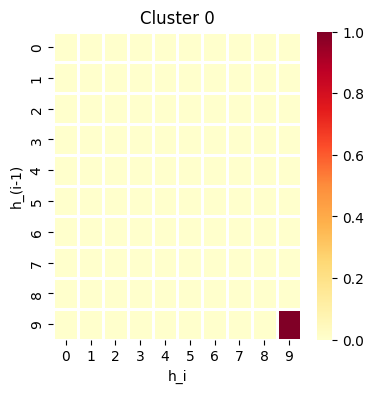

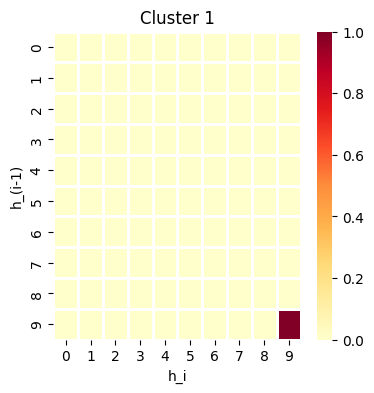

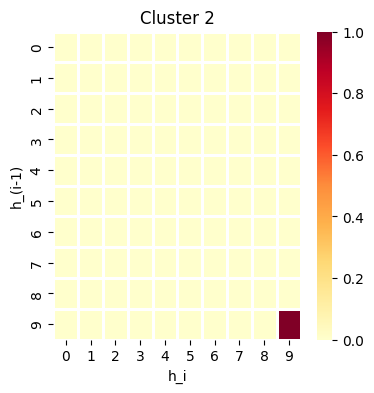

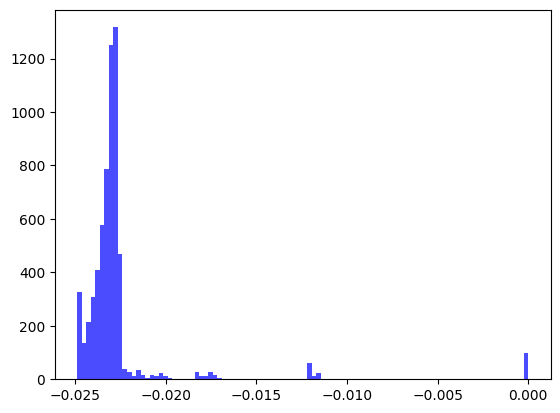

[2024-03-01T10:06:58.636177+00:00] Epochs 0, total loss: 5.57391e+04
[2024-03-01T10:06:58.647486+00:00] Training llk: -1.73871e+00


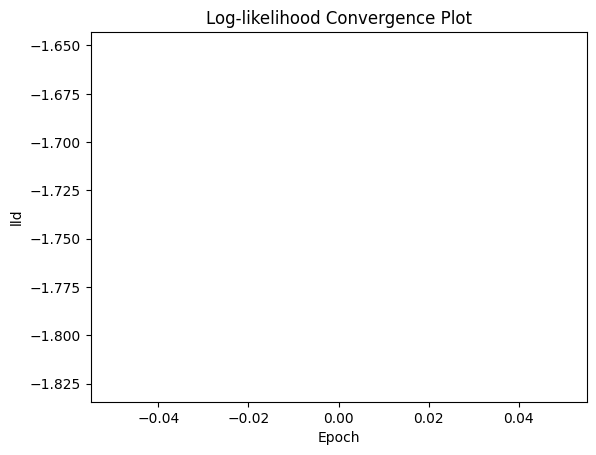

[2024-03-01T10:06:59.384969+00:00] Testing llk: -1.29745e+00
[2024-03-01T10:06:59.388487+00:00] MAE:1.44985, MRE:2.66653
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


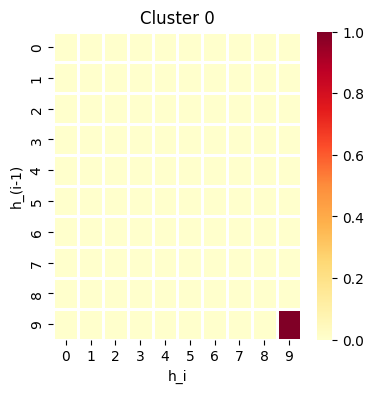

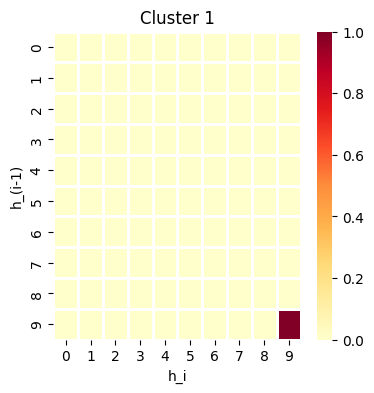

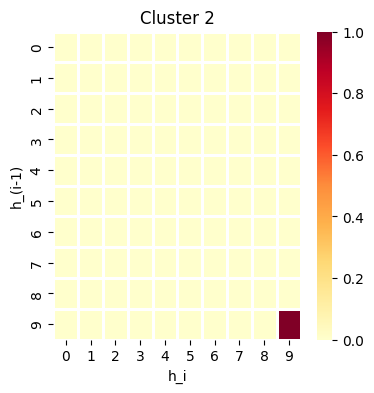

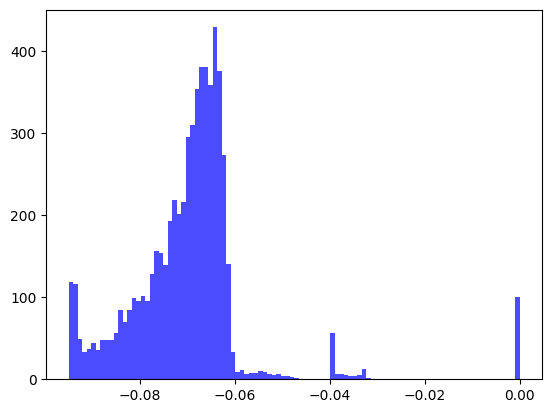

[2024-03-01T10:07:14.979008+00:00] Epochs 1, total loss: 5.44140e+04
[2024-03-01T10:07:14.979487+00:00] Training llk: -1.68600e+00


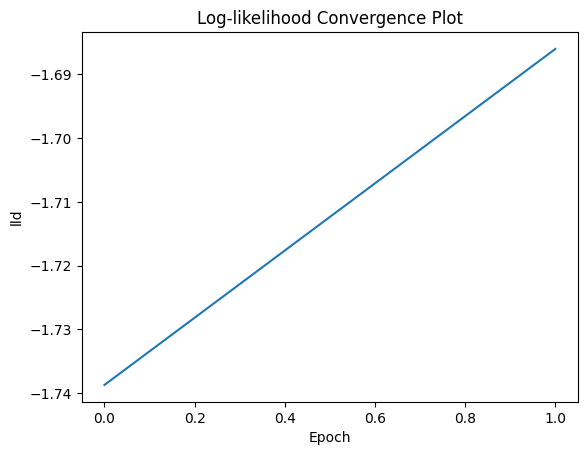

[2024-03-01T10:07:15.455269+00:00] Testing llk: -1.29982e+00
[2024-03-01T10:07:15.455545+00:00] MAE:1.44068, MRE:2.44003
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


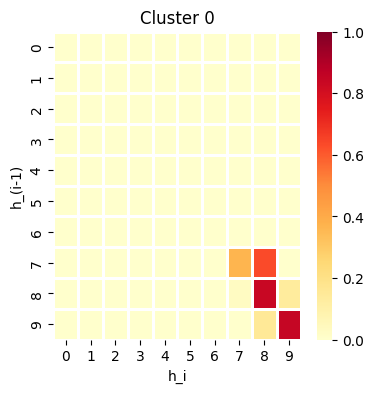

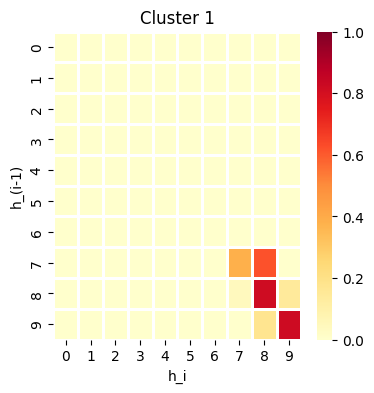

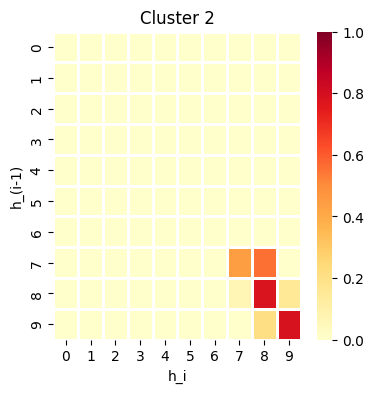

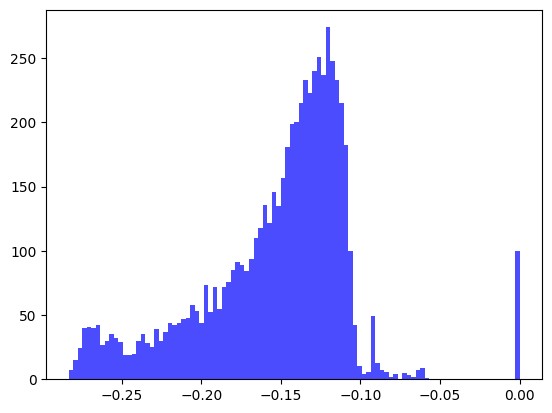

[2024-03-01T10:07:28.363605+00:00] Epochs 2, total loss: 5.30559e+04
[2024-03-01T10:07:28.364691+00:00] Training llk: -1.62155e+00


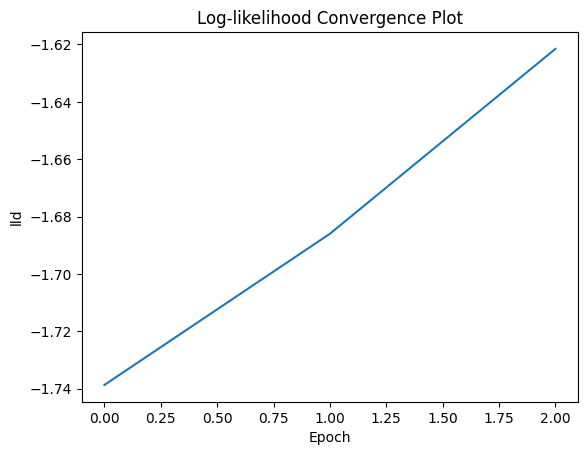

[2024-03-01T10:07:28.656774+00:00] Testing llk: -1.30163e+00
[2024-03-01T10:07:28.657522+00:00] MAE:1.42813, MRE:2.15881
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


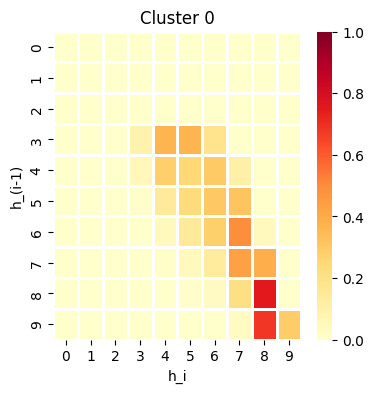

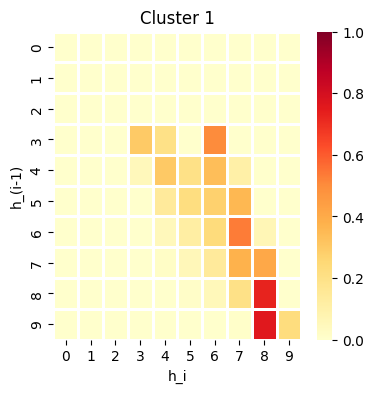

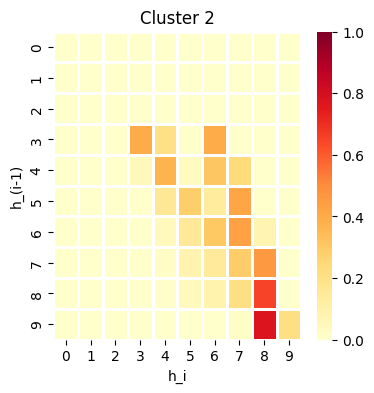

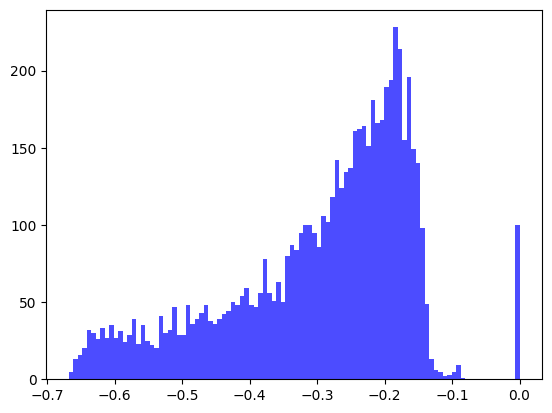

[2024-03-01T10:07:35.535444+00:00] Epochs 3, total loss: 5.12188e+04
[2024-03-01T10:07:35.539140+00:00] Training llk: -1.52732e+00


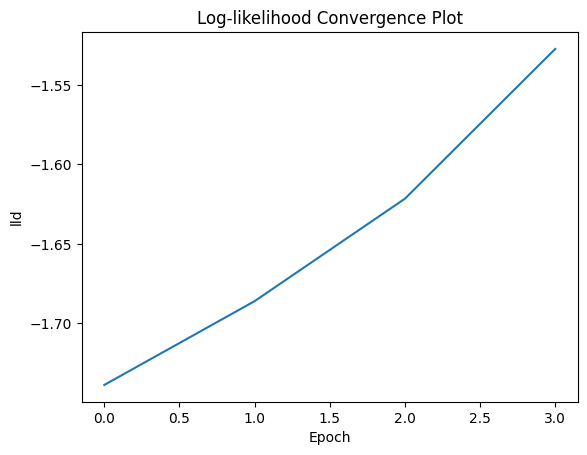

[2024-03-01T10:07:35.905039+00:00] Testing llk: -1.29952e+00
[2024-03-01T10:07:35.911507+00:00] MAE:1.40968, MRE:1.75227
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


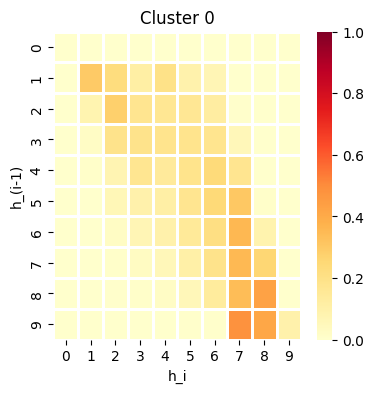

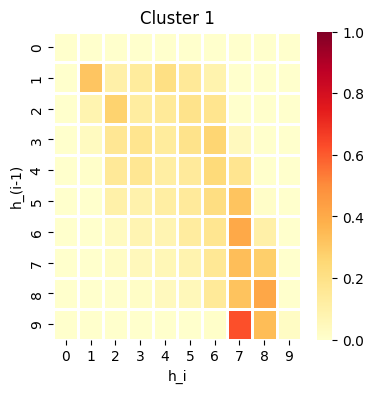

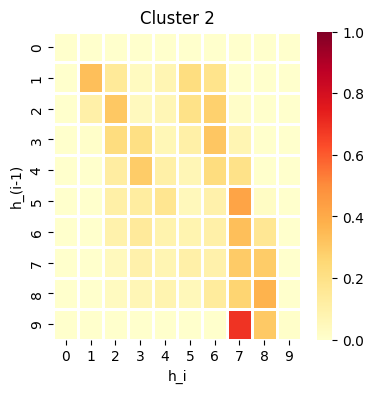

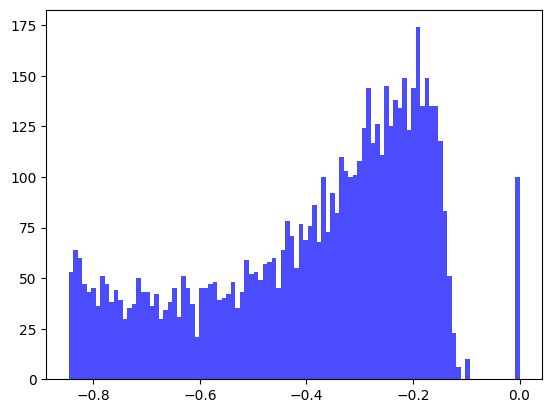

[2024-03-01T10:07:42.426220+00:00] Epochs 4, total loss: 4.91654e+04
[2024-03-01T10:07:42.427254+00:00] Training llk: -1.45771e+00


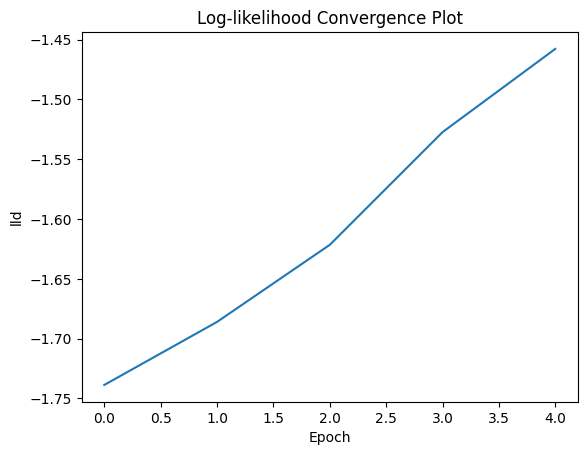

[2024-03-01T10:07:42.756139+00:00] Testing llk: -1.31302e+00
[2024-03-01T10:07:42.756314+00:00] MAE:1.40095, MRE:1.43021
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


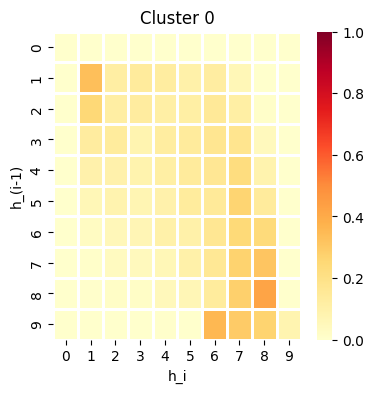

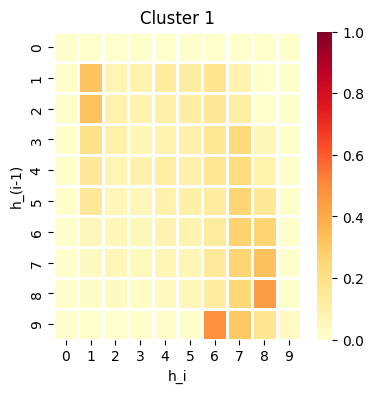

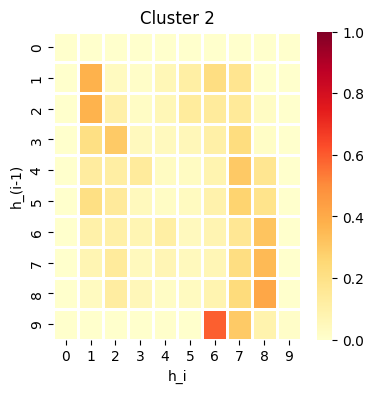

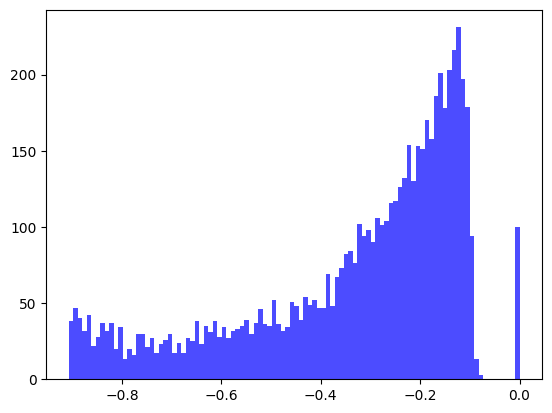

[2024-03-01T10:07:50.725873+00:00] Epochs 5, total loss: 4.76967e+04
[2024-03-01T10:07:50.727000+00:00] Training llk: -1.40263e+00


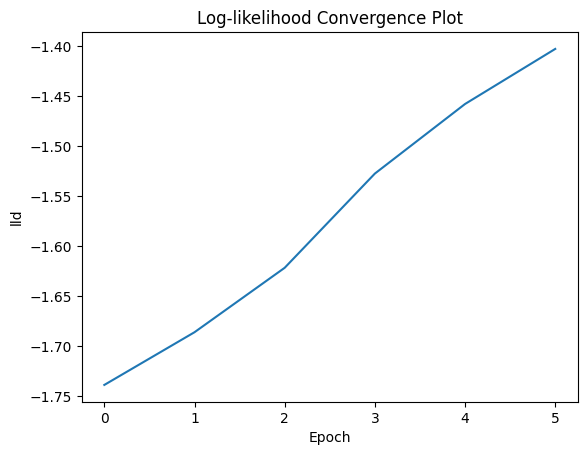

[2024-03-01T10:07:51.044551+00:00] Testing llk: -1.29358e+00
[2024-03-01T10:07:51.045184+00:00] MAE:1.38612, MRE:1.24711
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


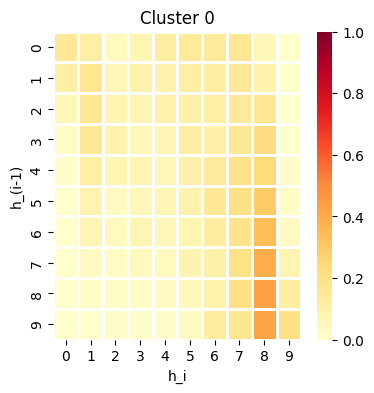

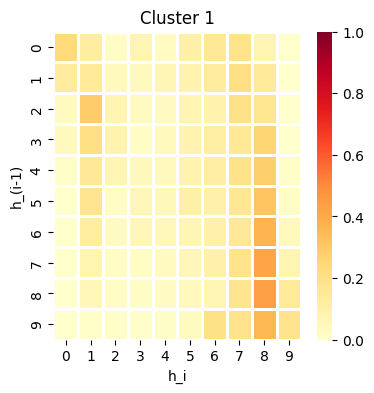

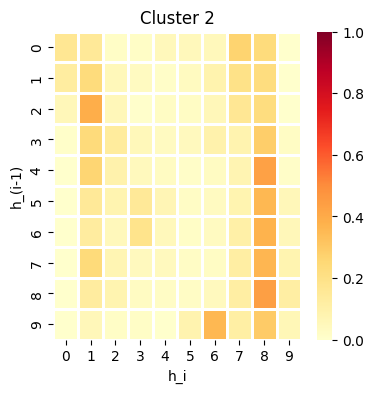

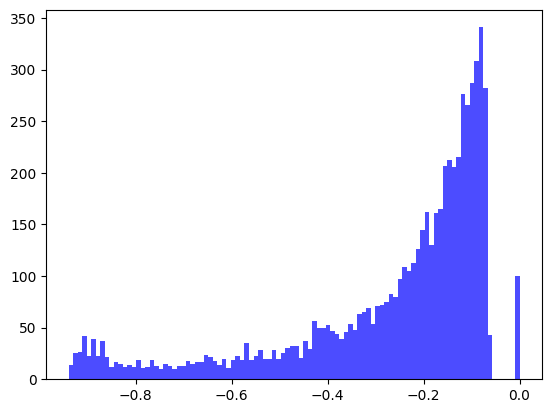

[2024-03-01T10:07:57.239974+00:00] Epochs 6, total loss: 4.64428e+04
[2024-03-01T10:07:57.241838+00:00] Training llk: -1.35672e+00


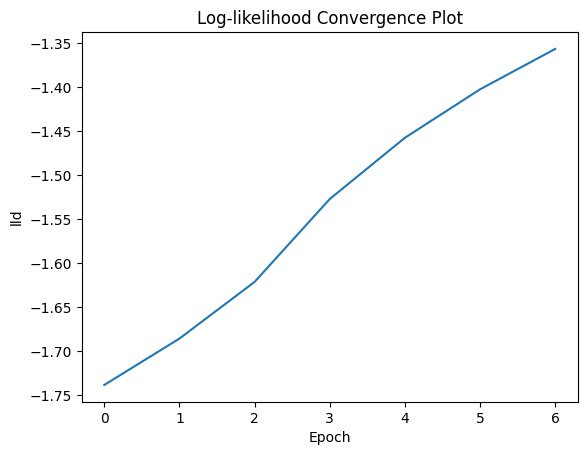

[2024-03-01T10:07:57.525759+00:00] Testing llk: -1.26227e+00
[2024-03-01T10:07:57.526805+00:00] MAE:1.36838, MRE:1.12140
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


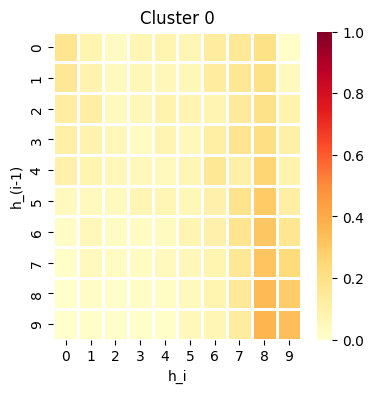

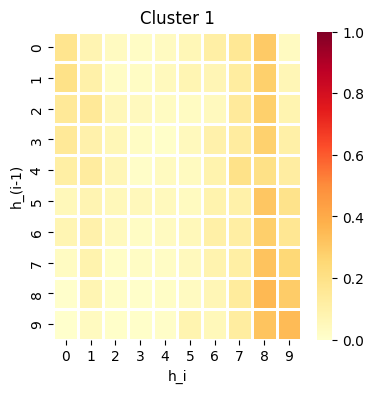

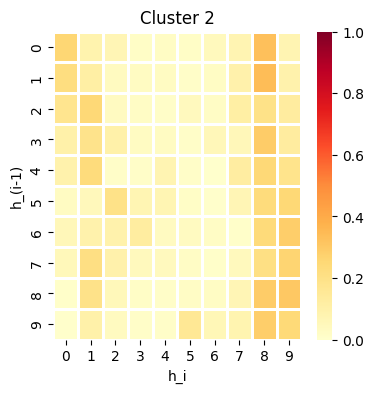

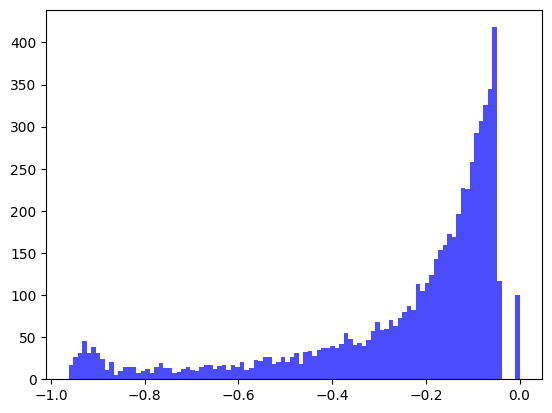

[2024-03-01T10:08:05.388457+00:00] Epochs 7, total loss: 4.54397e+04
[2024-03-01T10:08:05.388782+00:00] Training llk: -1.31902e+00


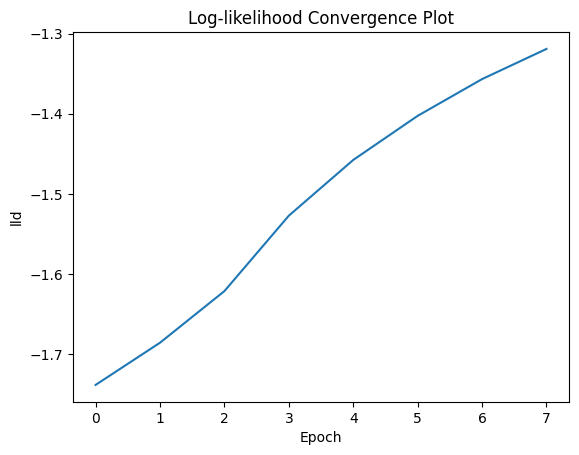

[2024-03-01T10:08:05.684705+00:00] Testing llk: -1.23865e+00
[2024-03-01T10:08:05.685302+00:00] MAE:1.35679, MRE:1.02120
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


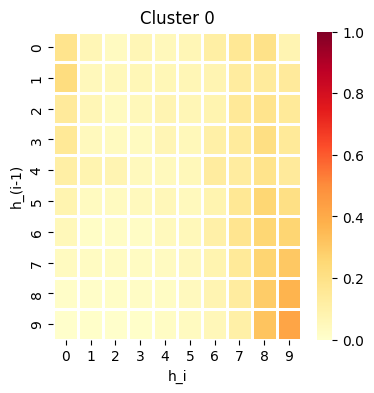

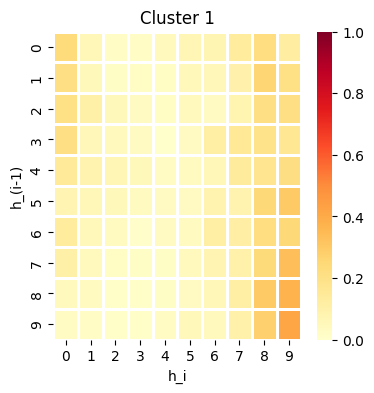

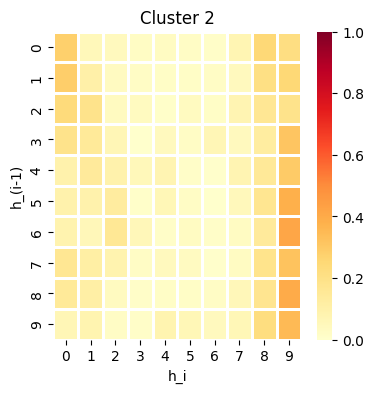

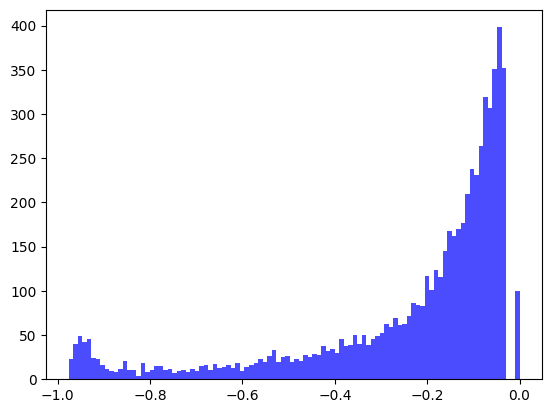

[2024-03-01T10:08:11.842498+00:00] Epochs 8, total loss: 4.45763e+04
[2024-03-01T10:08:11.844892+00:00] Training llk: -1.28624e+00


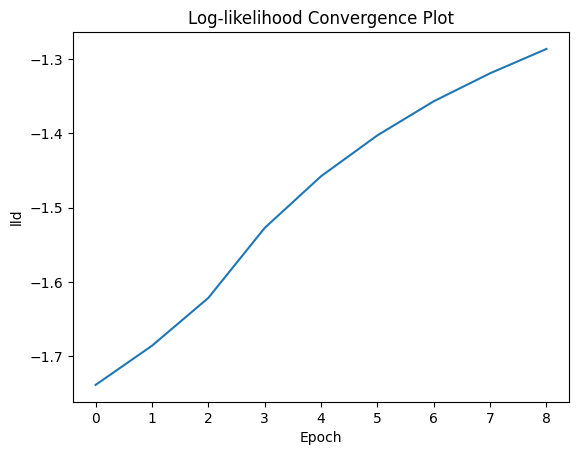

[2024-03-01T10:08:12.111791+00:00] Testing llk: -1.21595e+00
[2024-03-01T10:08:12.111968+00:00] MAE:1.34868, MRE:0.94890
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


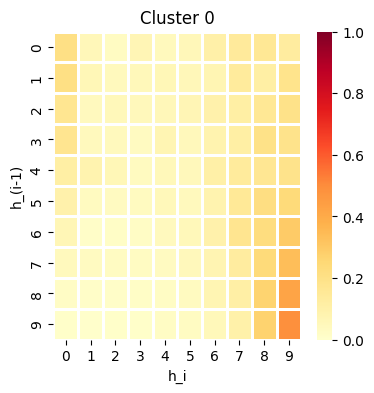

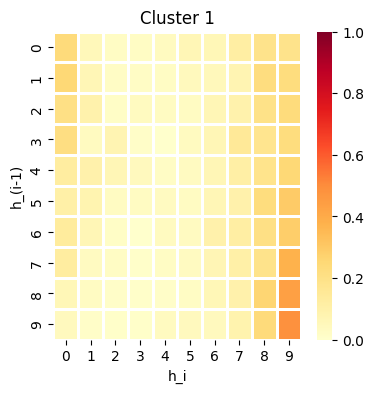

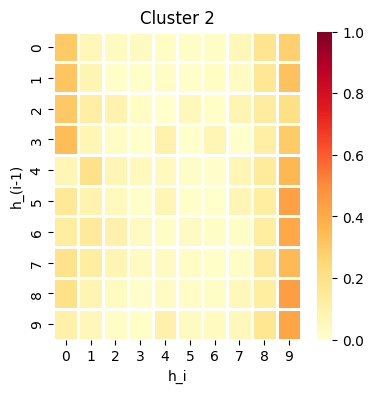

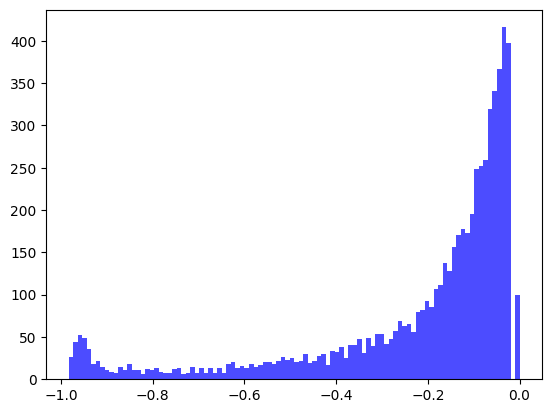

[2024-03-01T10:08:19.485589+00:00] Epochs 9, total loss: 4.38064e+04
[2024-03-01T10:08:19.485987+00:00] Training llk: -1.25641e+00


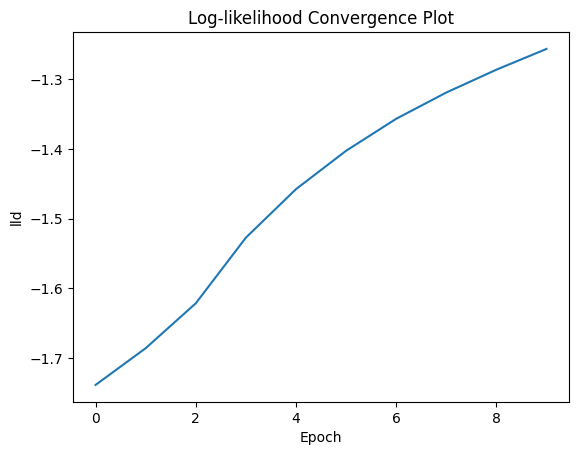

[2024-03-01T10:08:19.755581+00:00] Testing llk: -1.18819e+00
[2024-03-01T10:08:19.755810+00:00] MAE:1.33933, MRE:0.89955
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


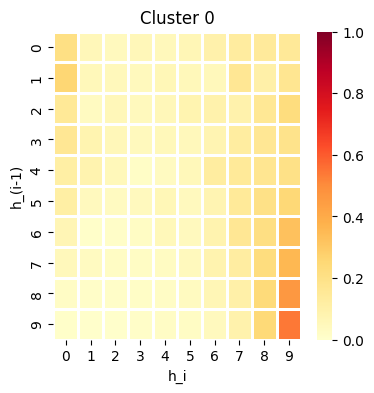

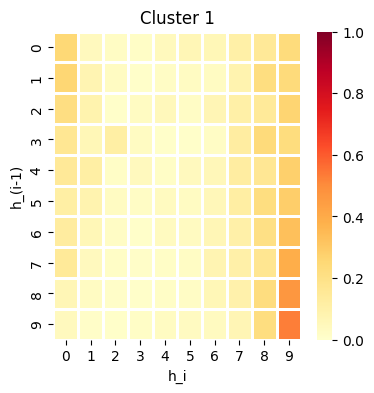

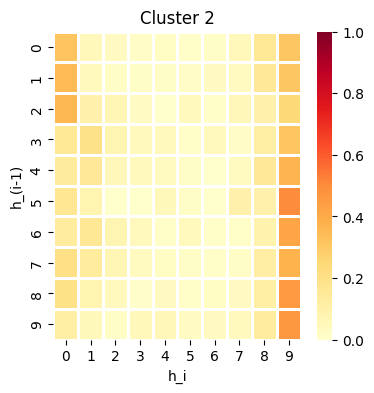

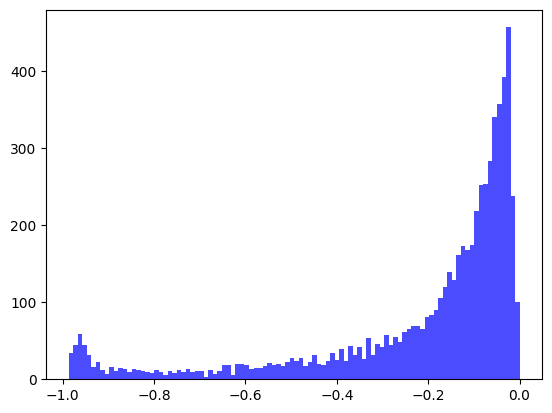

[2024-03-01T10:08:26.843413+00:00] Epochs 10, total loss: 4.31040e+04
[2024-03-01T10:08:26.846665+00:00] Training llk: -1.22910e+00


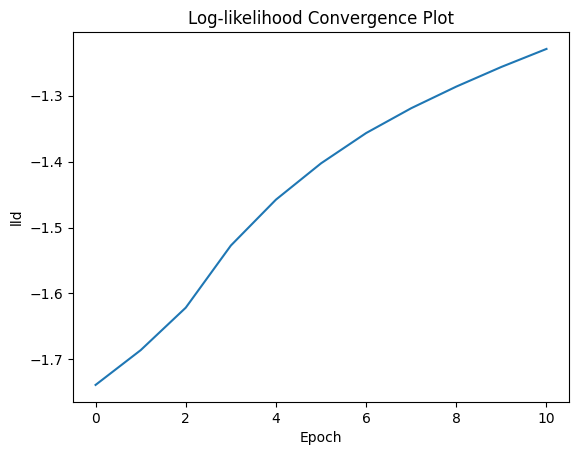

[2024-03-01T10:08:27.294371+00:00] Testing llk: -1.16146e+00
[2024-03-01T10:08:27.295444+00:00] MAE:1.33165, MRE:0.86335
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


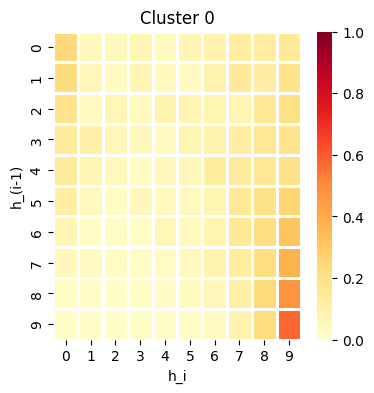

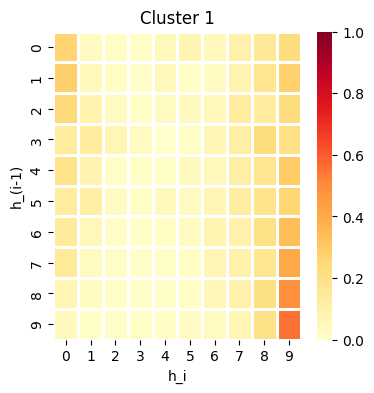

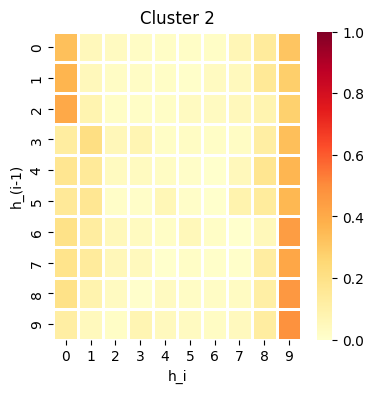

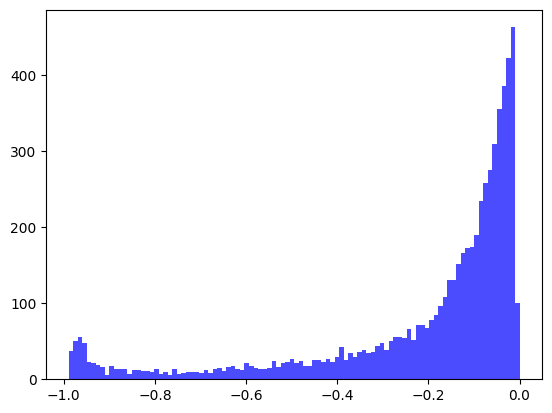

[2024-03-01T10:08:33.745217+00:00] Epochs 11, total loss: 4.24470e+04
[2024-03-01T10:08:33.749236+00:00] Training llk: -1.20363e+00


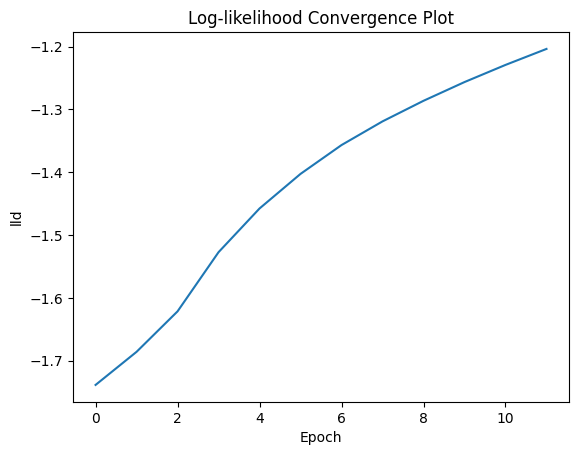

[2024-03-01T10:08:34.034758+00:00] Testing llk: -1.13468e+00
[2024-03-01T10:08:34.035327+00:00] MAE:1.32435, MRE:0.83613
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


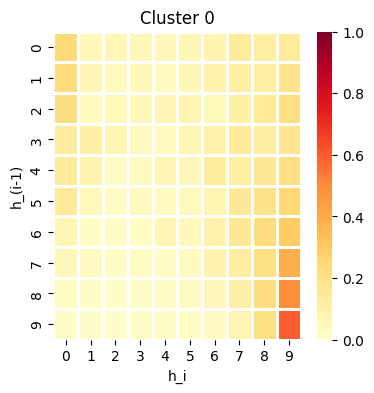

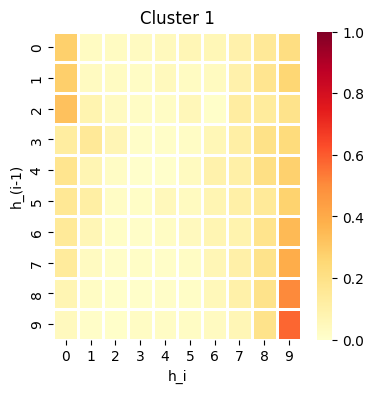

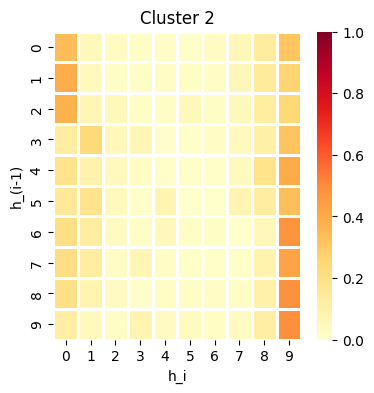

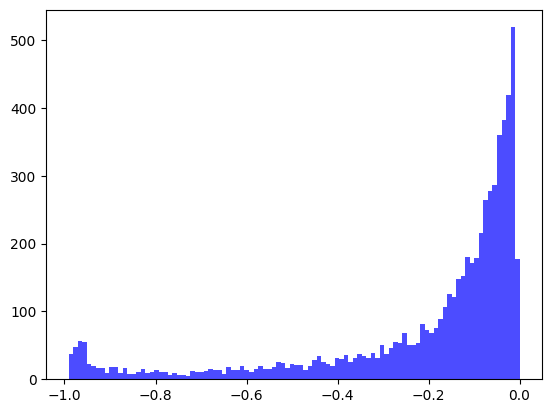

[2024-03-01T10:08:41.190665+00:00] Epochs 12, total loss: 4.18283e+04
[2024-03-01T10:08:41.192755+00:00] Training llk: -1.17957e+00


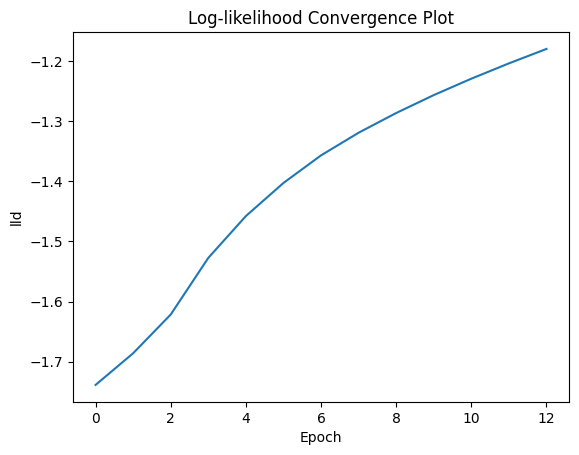

[2024-03-01T10:08:41.553046+00:00] Testing llk: -1.10762e+00
[2024-03-01T10:08:41.553358+00:00] MAE:1.31680, MRE:0.81472
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


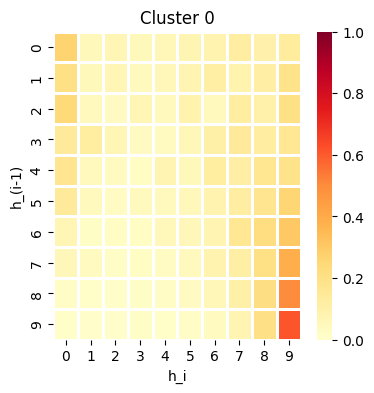

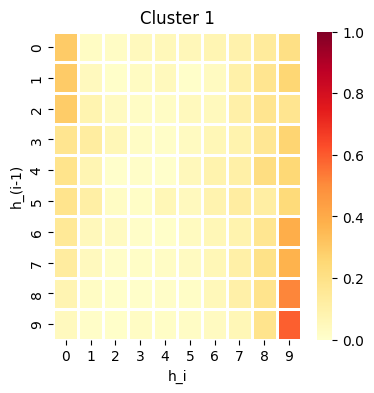

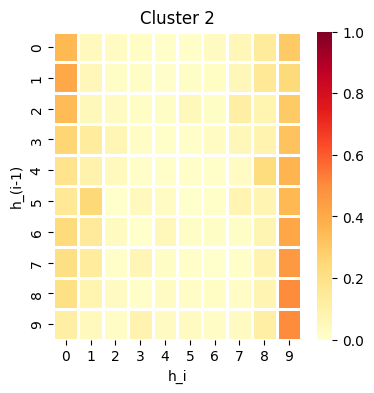

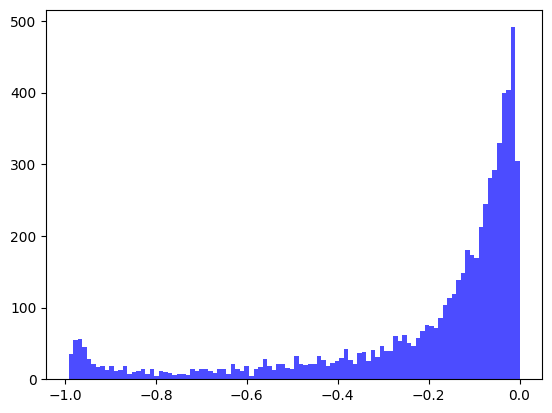

[2024-03-01T10:08:48.187435+00:00] Epochs 13, total loss: 4.12451e+04
[2024-03-01T10:08:48.188909+00:00] Training llk: -1.15678e+00


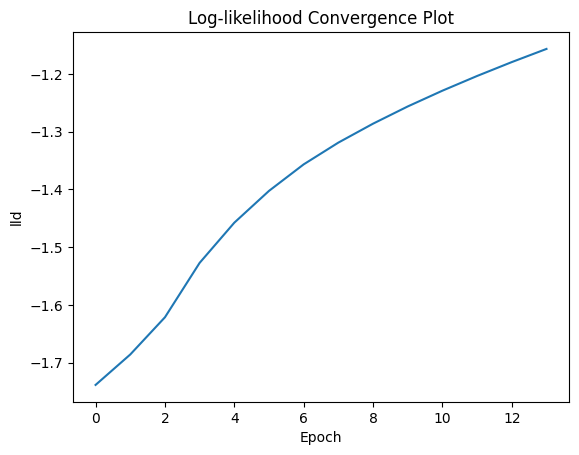

[2024-03-01T10:08:48.491628+00:00] Testing llk: -1.08139e+00
[2024-03-01T10:08:48.491795+00:00] MAE:1.30956, MRE:0.79702
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


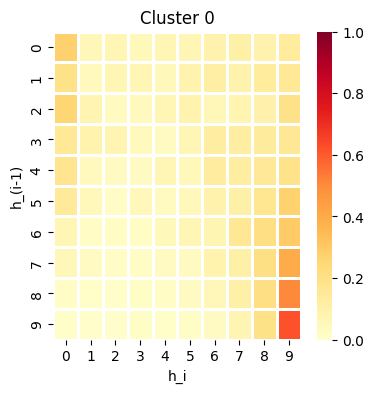

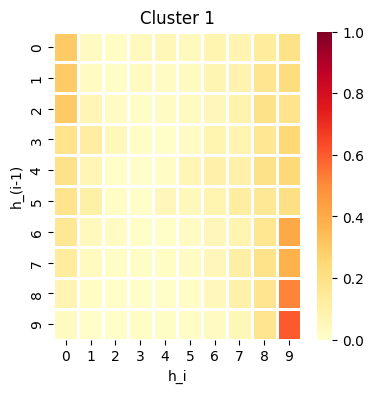

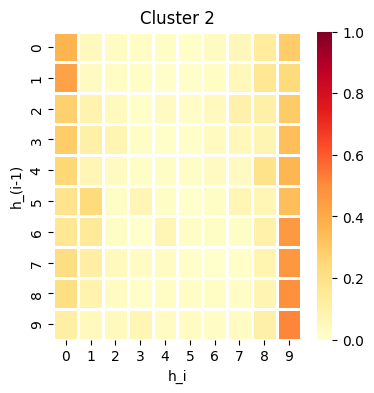

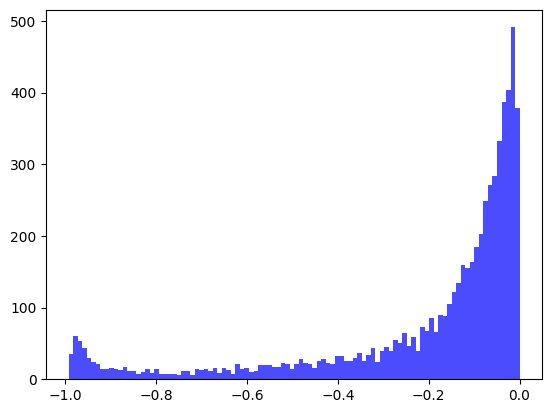

[2024-03-01T10:08:55.757246+00:00] Epochs 14, total loss: 4.06927e+04
[2024-03-01T10:08:55.760265+00:00] Training llk: -1.13507e+00


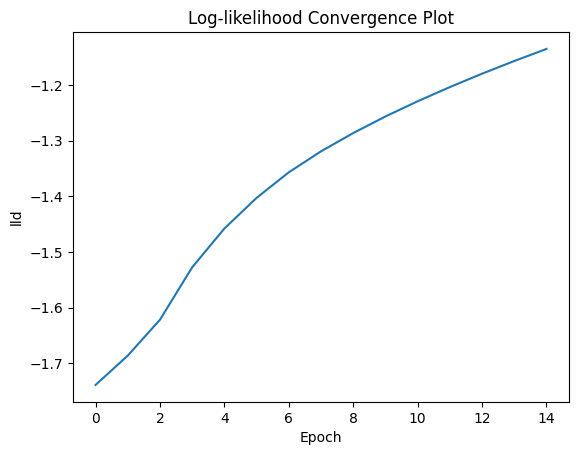

[2024-03-01T10:08:56.043894+00:00] Testing llk: -1.05562e+00
[2024-03-01T10:08:56.047023+00:00] MAE:1.30208, MRE:0.78165
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


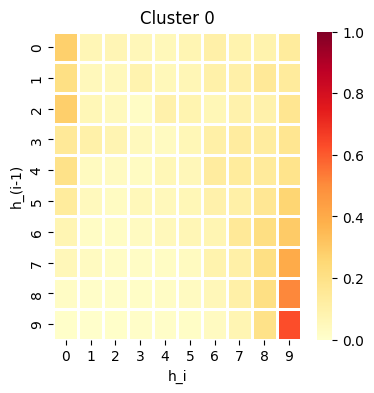

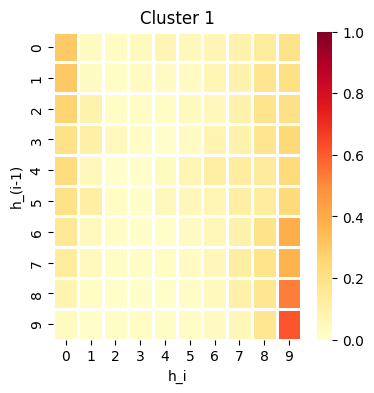

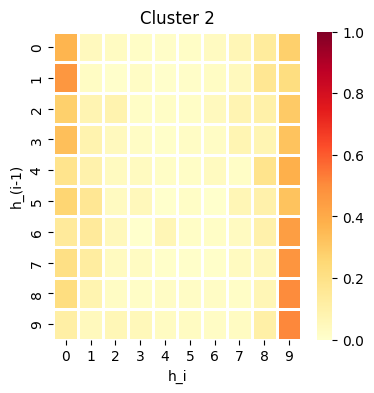

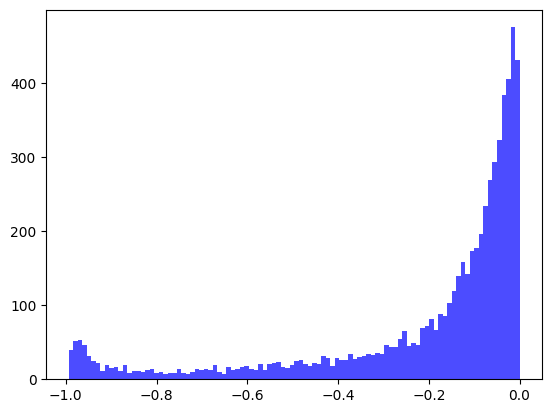

[2024-03-01T10:09:02.009950+00:00] Epochs 15, total loss: 4.01693e+04
[2024-03-01T10:09:02.011505+00:00] Training llk: -1.11443e+00


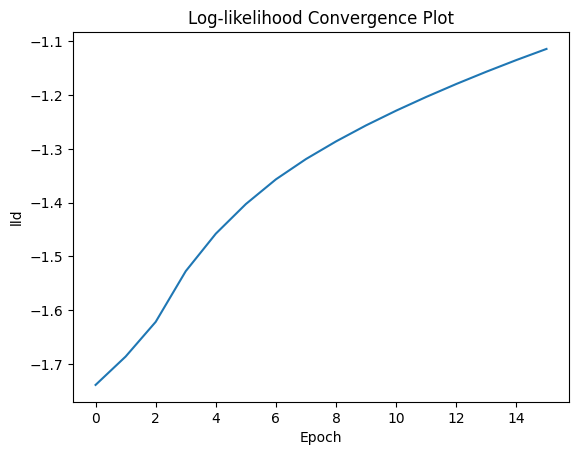

[2024-03-01T10:09:02.296502+00:00] Testing llk: -1.03091e+00
[2024-03-01T10:09:02.297119+00:00] MAE:1.29468, MRE:0.76783
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


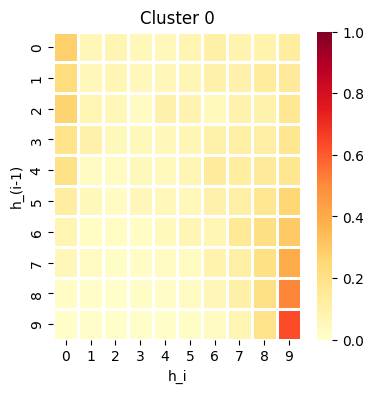

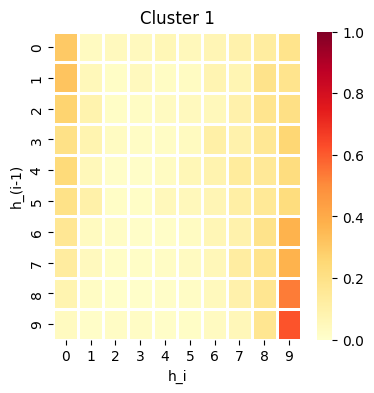

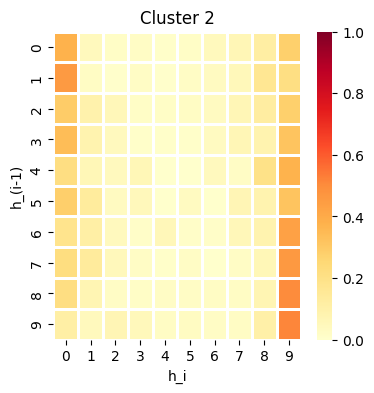

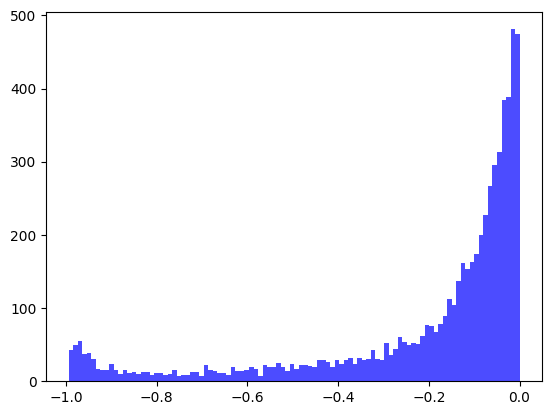

[2024-03-01T10:09:10.754130+00:00] Epochs 16, total loss: 3.96726e+04
[2024-03-01T10:09:10.754507+00:00] Training llk: -1.09484e+00


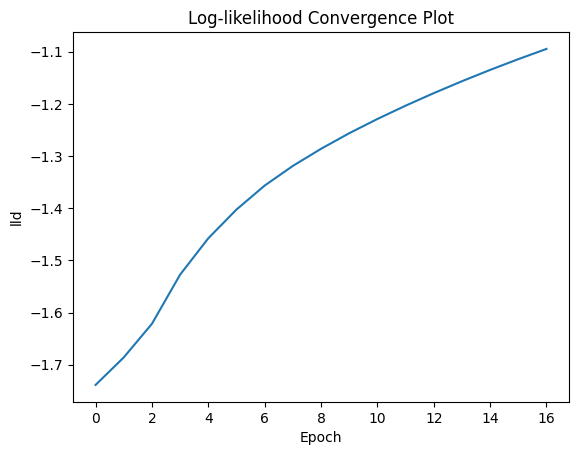

[2024-03-01T10:09:11.055521+00:00] Testing llk: -1.00721e+00
[2024-03-01T10:09:11.055700+00:00] MAE:1.28719, MRE:0.75507
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


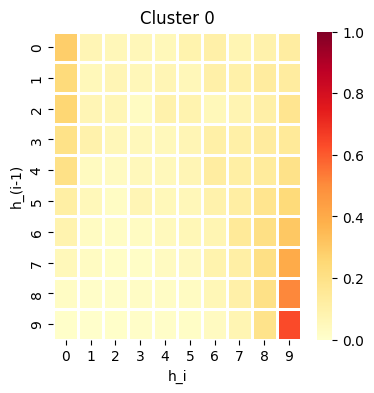

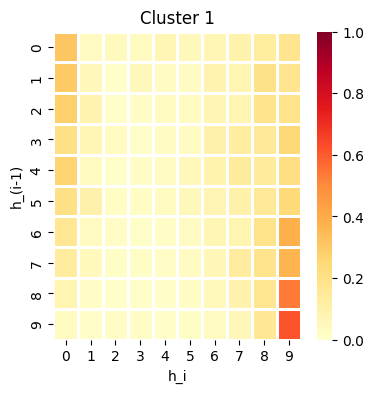

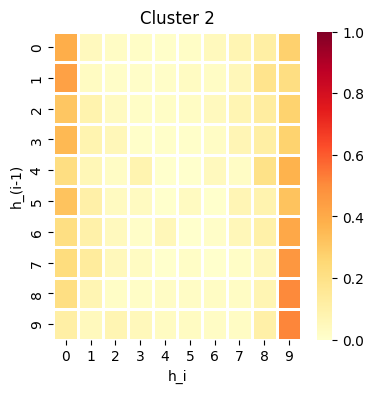

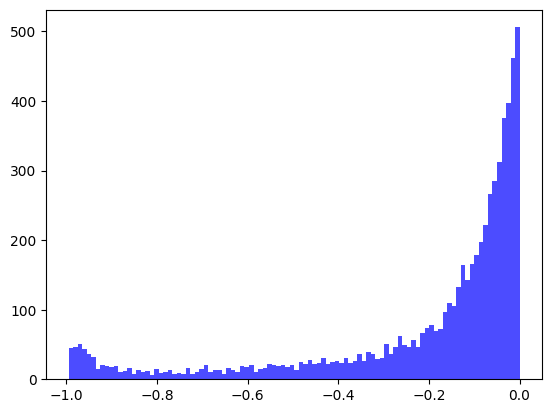

[2024-03-01T10:09:17.265000+00:00] Epochs 17, total loss: 3.92011e+04
[2024-03-01T10:09:17.265405+00:00] Training llk: -1.07627e+00


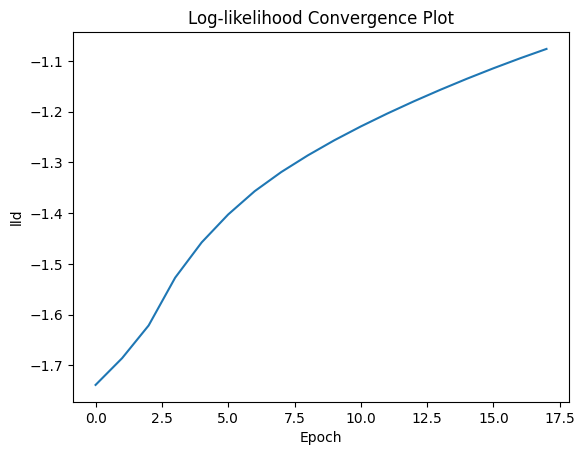

[2024-03-01T10:09:17.704070+00:00] Testing llk: -9.84713e-01
[2024-03-01T10:09:17.705197+00:00] MAE:1.27975, MRE:0.74305
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


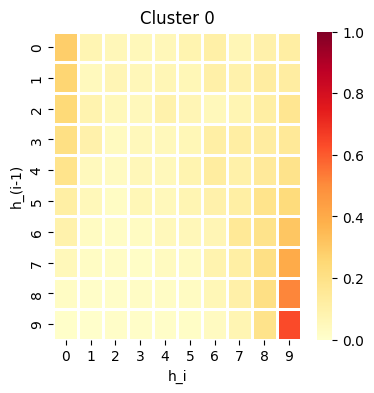

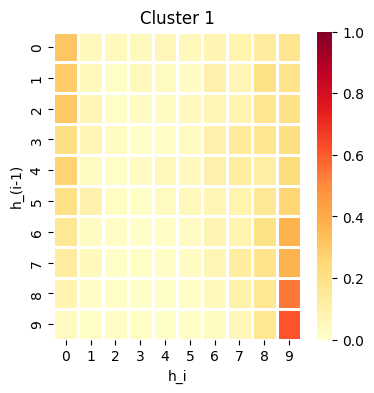

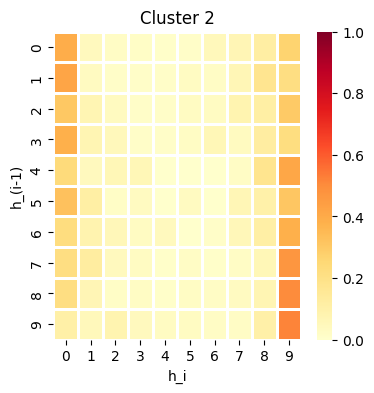

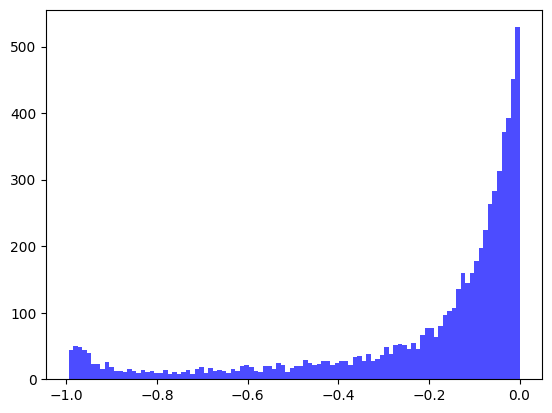

[2024-03-01T10:09:24.762771+00:00] Epochs 18, total loss: 3.87531e+04
[2024-03-01T10:09:24.764188+00:00] Training llk: -1.05867e+00


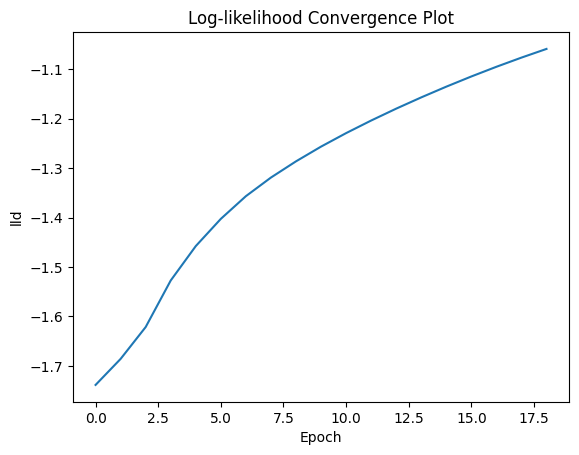

[2024-03-01T10:09:25.068652+00:00] Testing llk: -9.63386e-01
[2024-03-01T10:09:25.068825+00:00] MAE:1.27231, MRE:0.73159
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


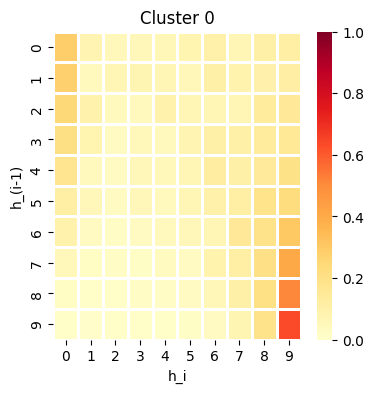

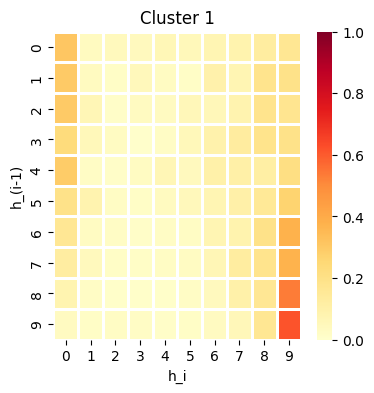

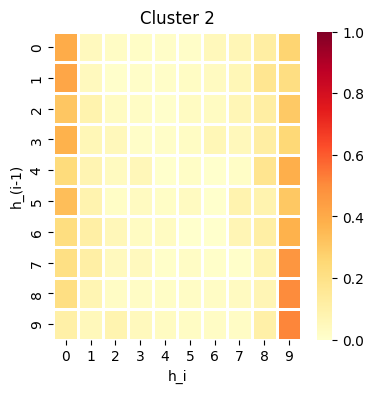

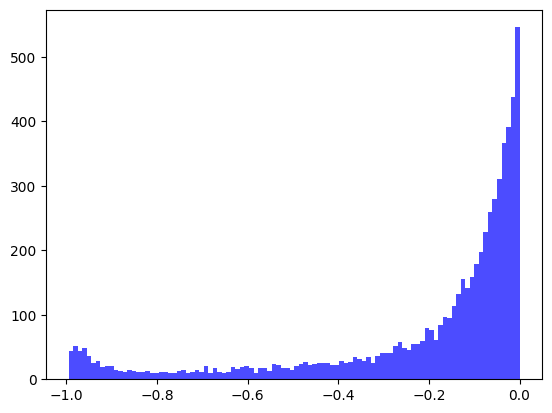

[2024-03-01T10:09:32.056212+00:00] Epochs 19, total loss: 3.83274e+04
[2024-03-01T10:09:32.057586+00:00] Training llk: -1.04200e+00


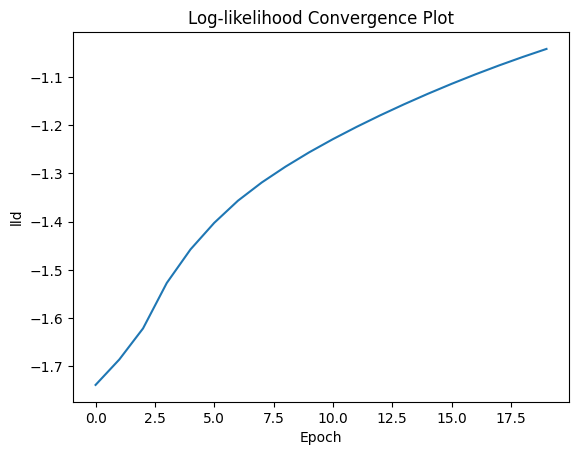

[2024-03-01T10:09:32.525267+00:00] Testing llk: -9.43240e-01
[2024-03-01T10:09:32.526234+00:00] MAE:1.26494, MRE:0.72053
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


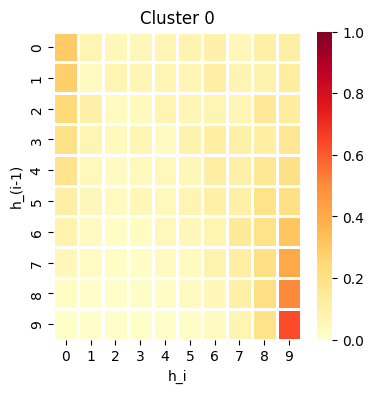

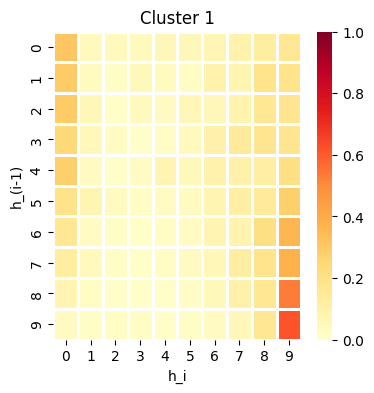

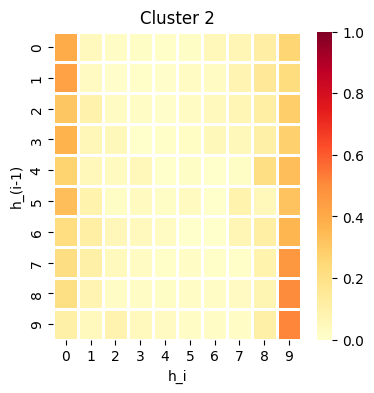

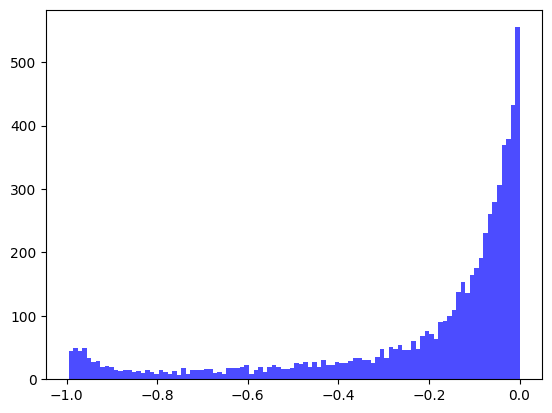

[2024-03-01T10:09:38.901355+00:00] Epochs 20, total loss: 3.79231e+04
[2024-03-01T10:09:38.902744+00:00] Training llk: -1.02622e+00


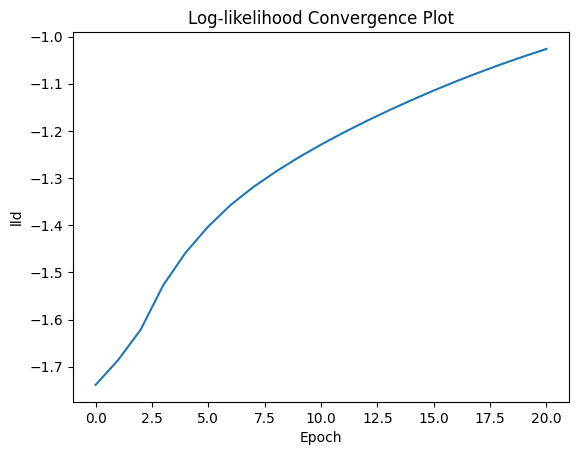

[2024-03-01T10:09:39.192288+00:00] Testing llk: -9.24233e-01
[2024-03-01T10:09:39.192506+00:00] MAE:1.25763, MRE:0.70981
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


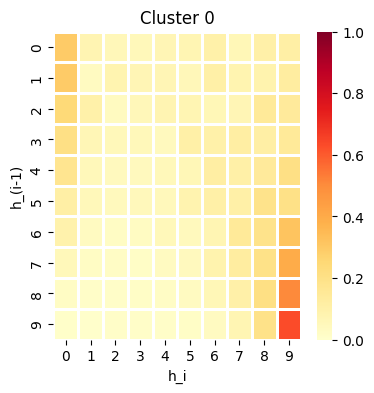

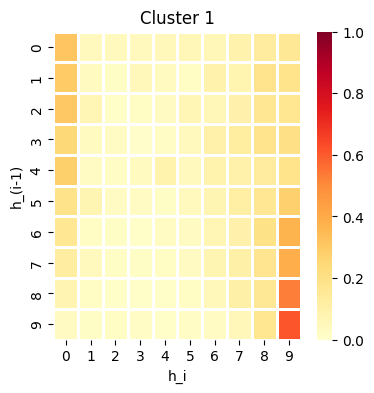

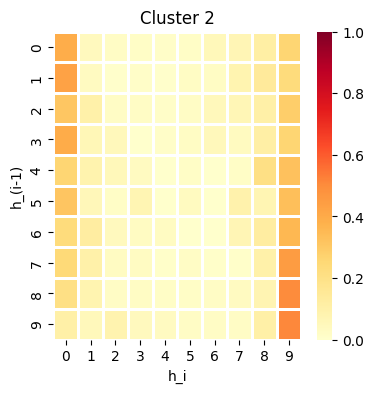

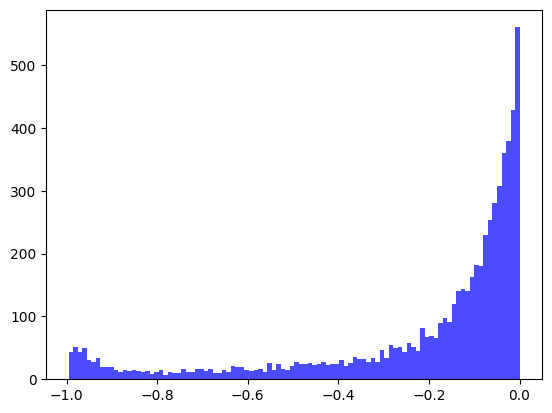

[2024-03-01T10:09:46.123084+00:00] Epochs 21, total loss: 3.75391e+04
[2024-03-01T10:09:46.124794+00:00] Training llk: -1.01127e+00


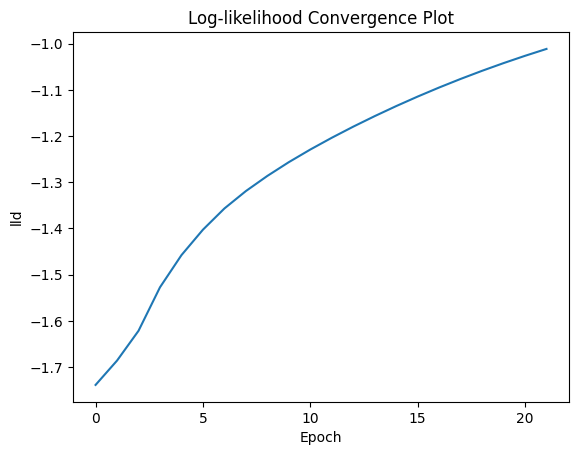

[2024-03-01T10:09:46.542660+00:00] Testing llk: -9.06322e-01
[2024-03-01T10:09:46.543781+00:00] MAE:1.25043, MRE:0.69940
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


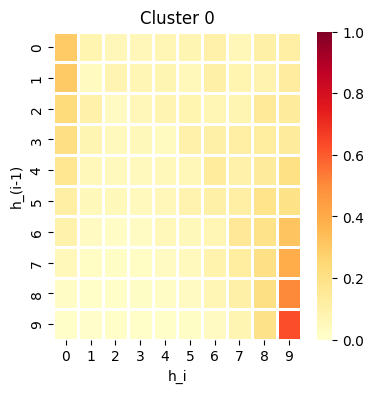

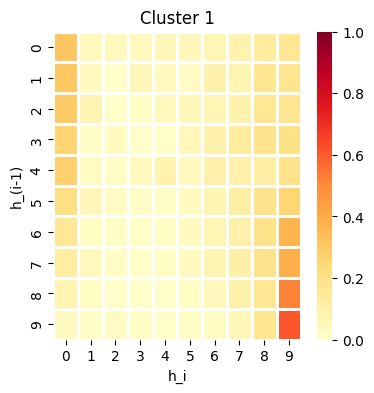

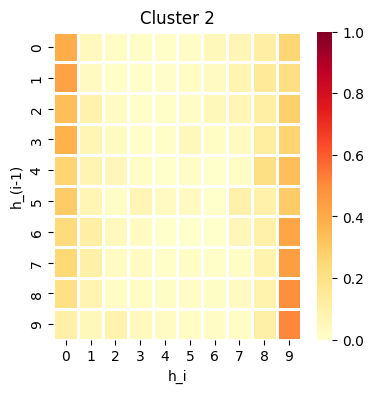

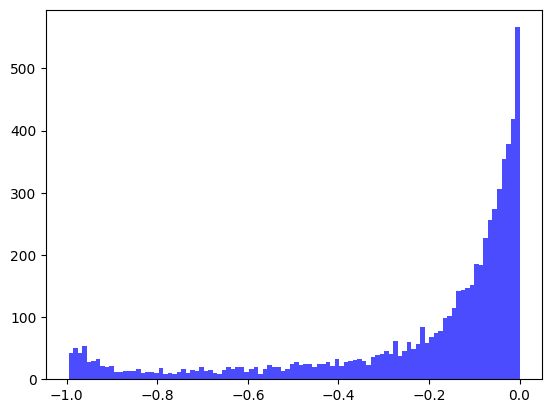

[2024-03-01T10:09:53.112287+00:00] Epochs 22, total loss: 3.71747e+04
[2024-03-01T10:09:53.112731+00:00] Training llk: -9.97126e-01


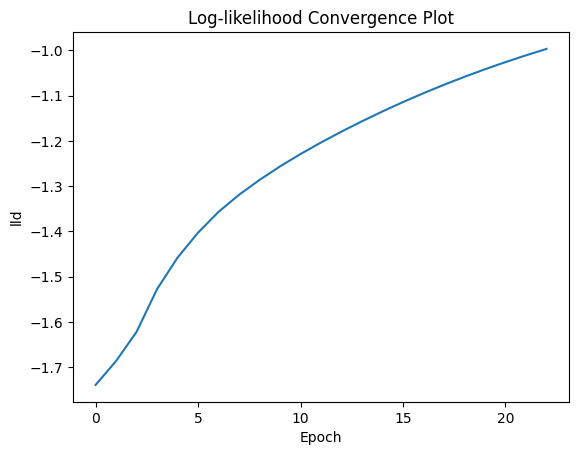

[2024-03-01T10:09:53.411010+00:00] Testing llk: -8.89459e-01
[2024-03-01T10:09:53.411176+00:00] MAE:1.24335, MRE:0.68929
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


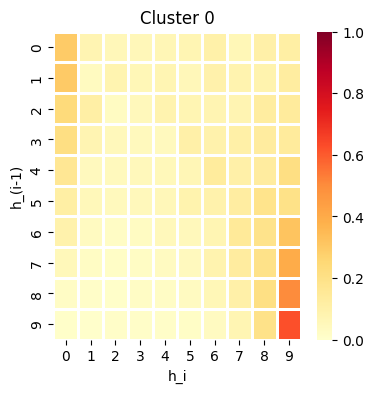

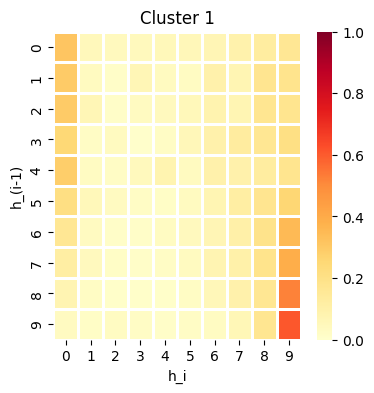

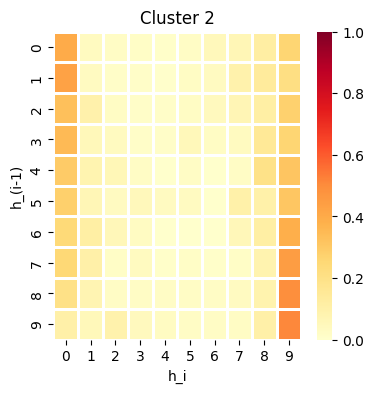

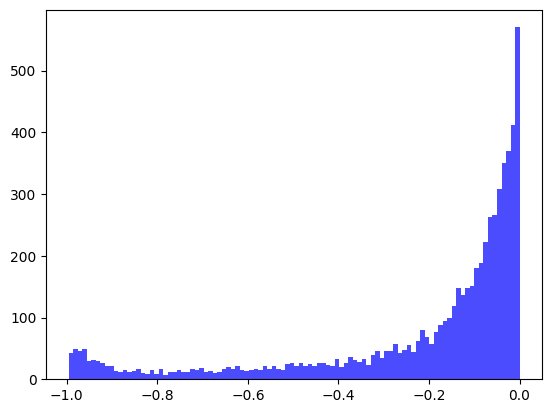

[2024-03-01T10:10:00.725950+00:00] Epochs 23, total loss: 3.68289e+04
[2024-03-01T10:10:00.728533+00:00] Training llk: -9.83749e-01


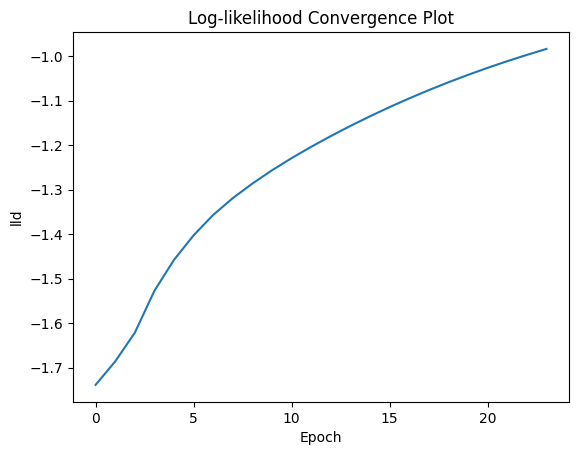

[2024-03-01T10:10:01.017509+00:00] Testing llk: -8.73593e-01
[2024-03-01T10:10:01.017675+00:00] MAE:1.23640, MRE:0.67951
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


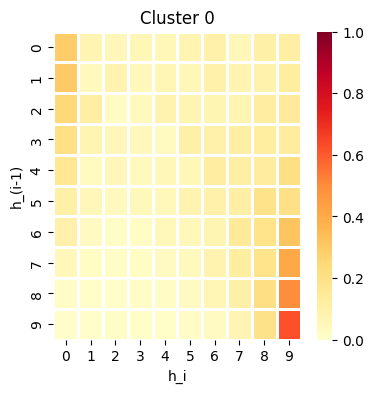

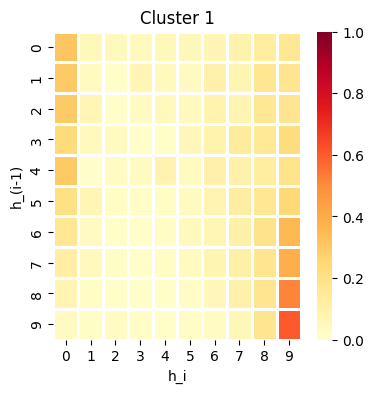

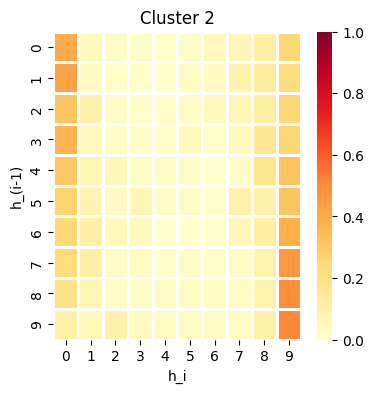

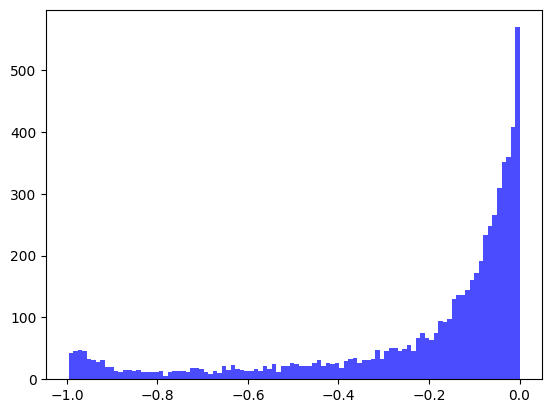

[2024-03-01T10:10:07.203825+00:00] Epochs 24, total loss: 3.65011e+04
[2024-03-01T10:10:07.205271+00:00] Training llk: -9.71103e-01


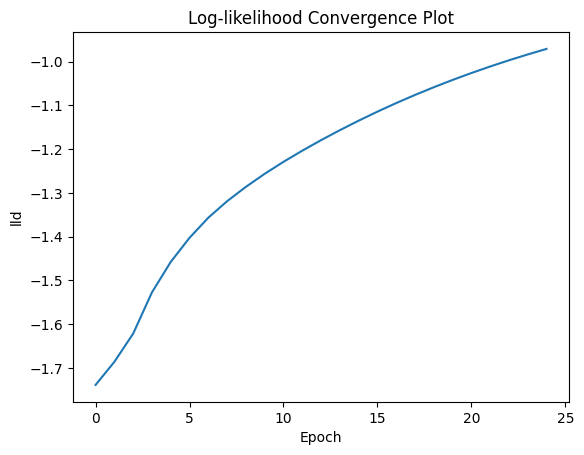

[2024-03-01T10:10:07.508994+00:00] Testing llk: -8.58674e-01
[2024-03-01T10:10:07.509173+00:00] MAE:1.22959, MRE:0.67003
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


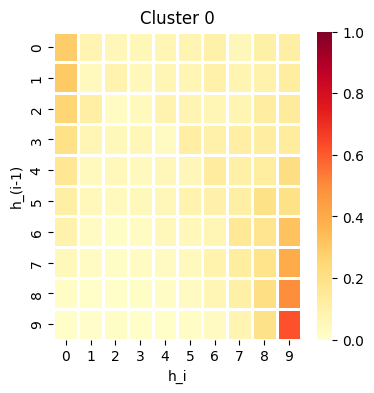

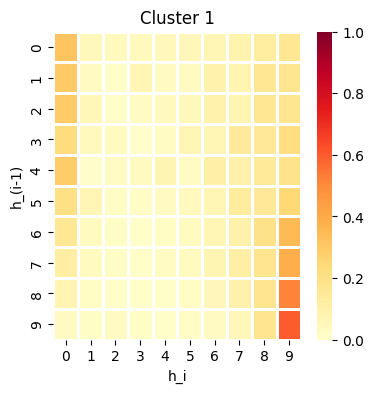

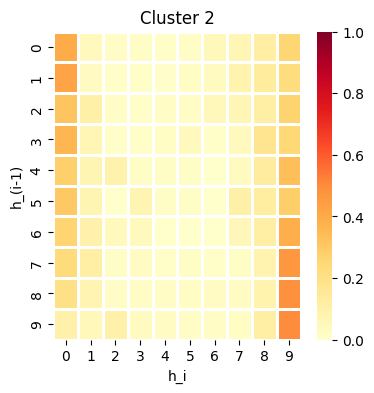

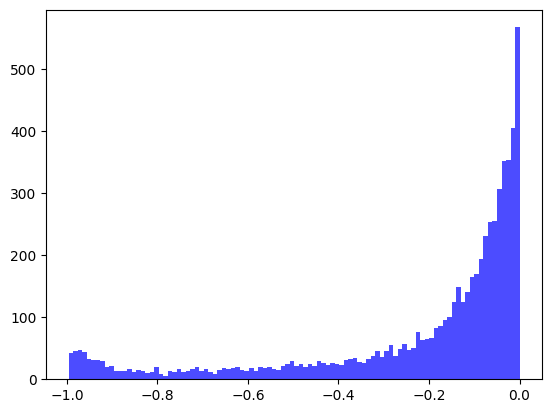

[2024-03-01T10:10:15.328724+00:00] Epochs 25, total loss: 3.61904e+04
[2024-03-01T10:10:15.330207+00:00] Training llk: -9.59156e-01


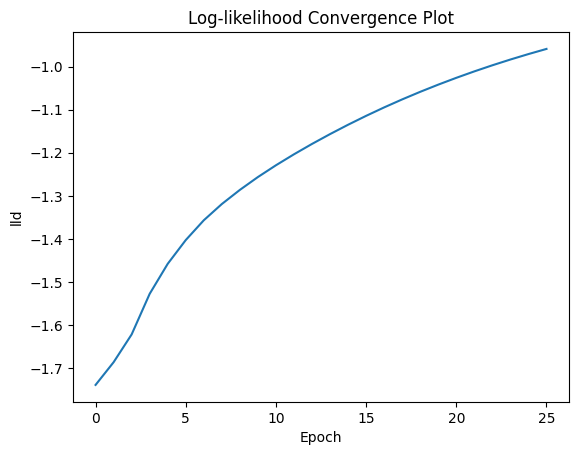

[2024-03-01T10:10:15.607428+00:00] Testing llk: -8.44651e-01
[2024-03-01T10:10:15.607605+00:00] MAE:1.22302, MRE:0.66094
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


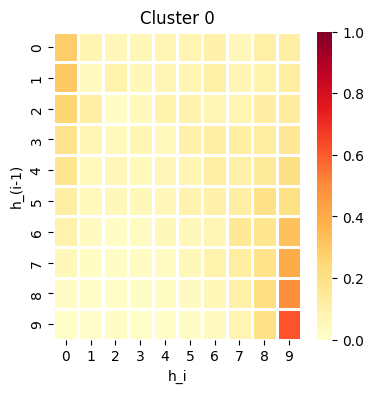

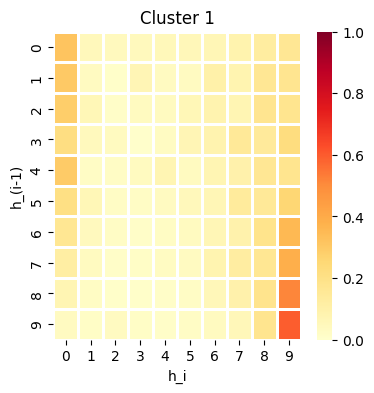

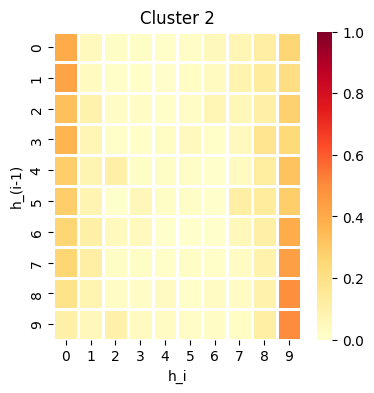

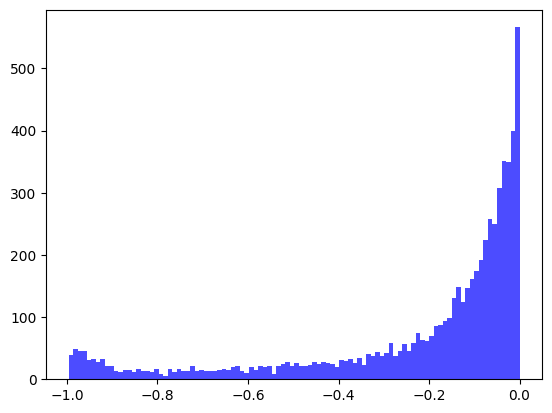

[2024-03-01T10:10:21.890132+00:00] Epochs 26, total loss: 3.58959e+04
[2024-03-01T10:10:21.890537+00:00] Training llk: -9.47870e-01


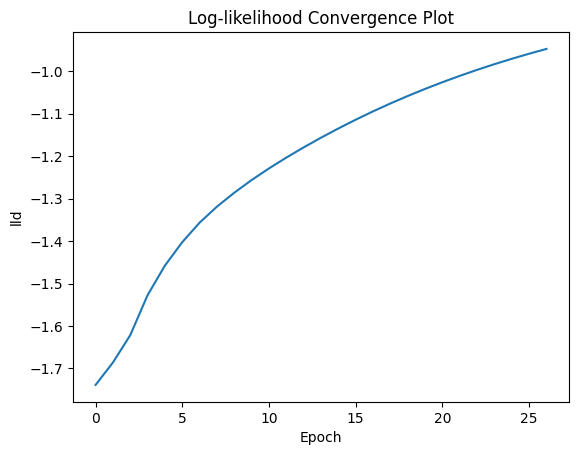

[2024-03-01T10:10:22.194668+00:00] Testing llk: -8.31474e-01
[2024-03-01T10:10:22.194844+00:00] MAE:1.21666, MRE:0.65221
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


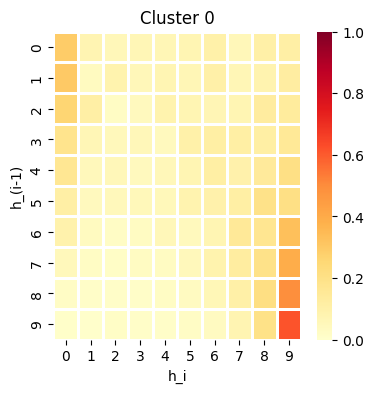

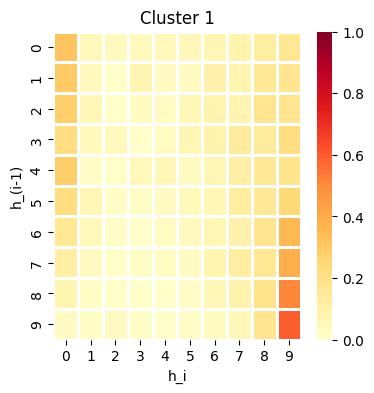

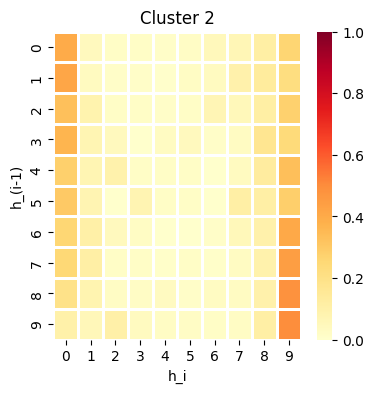

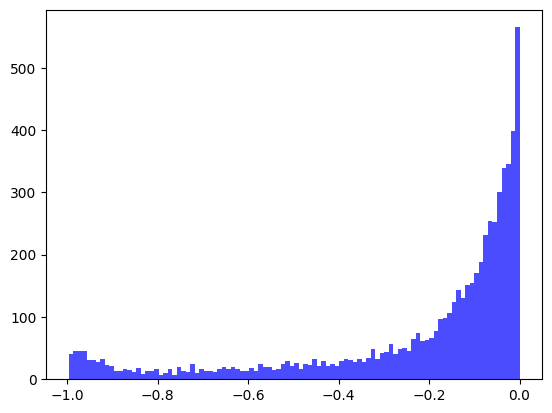

[2024-03-01T10:10:29.368906+00:00] Epochs 27, total loss: 3.56170e+04
[2024-03-01T10:10:29.370742+00:00] Training llk: -9.37213e-01


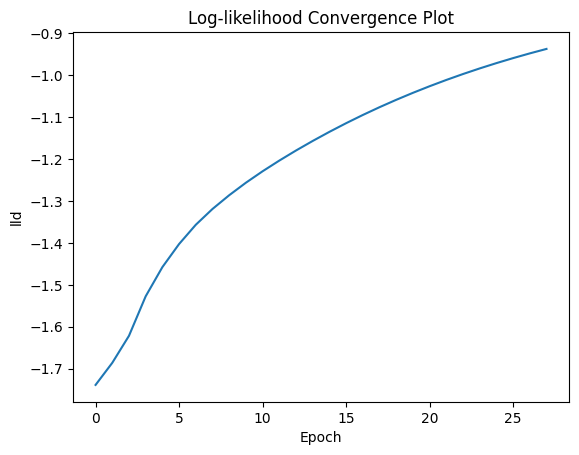

[2024-03-01T10:10:29.657303+00:00] Testing llk: -8.19095e-01
[2024-03-01T10:10:29.657601+00:00] MAE:1.21050, MRE:0.64383
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


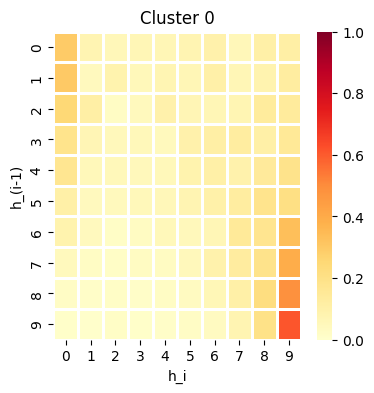

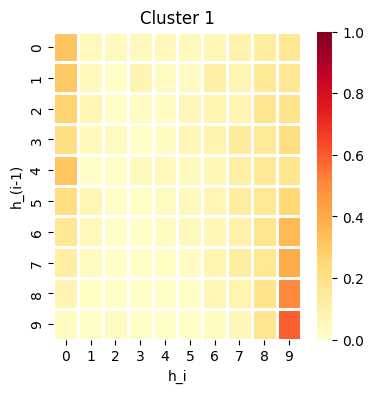

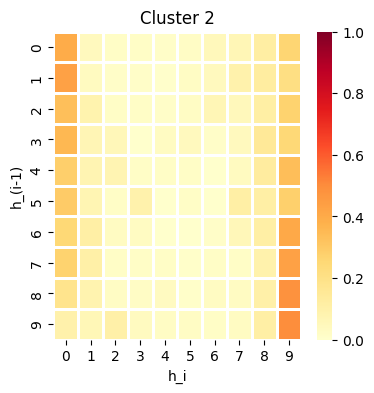

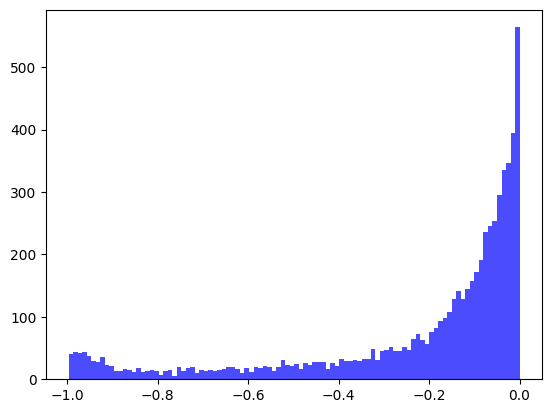

[2024-03-01T10:10:36.725757+00:00] Epochs 28, total loss: 3.53527e+04
[2024-03-01T10:10:36.727349+00:00] Training llk: -9.27151e-01


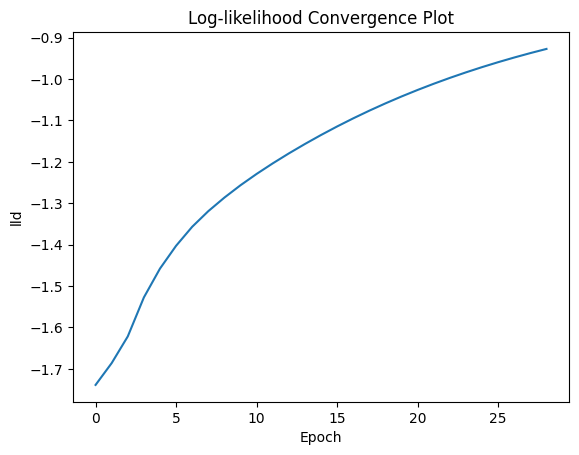

[2024-03-01T10:10:37.151011+00:00] Testing llk: -8.07467e-01
[2024-03-01T10:10:37.152070+00:00] MAE:1.20454, MRE:0.63581
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


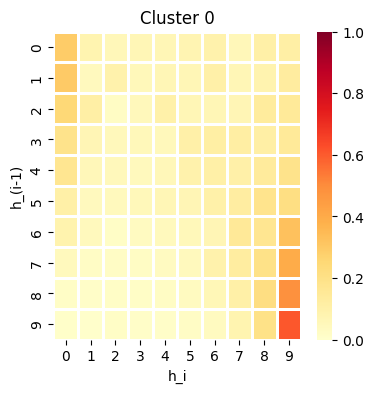

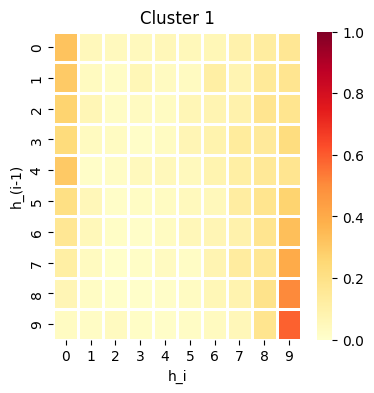

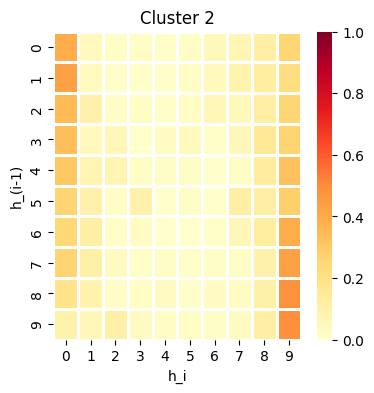

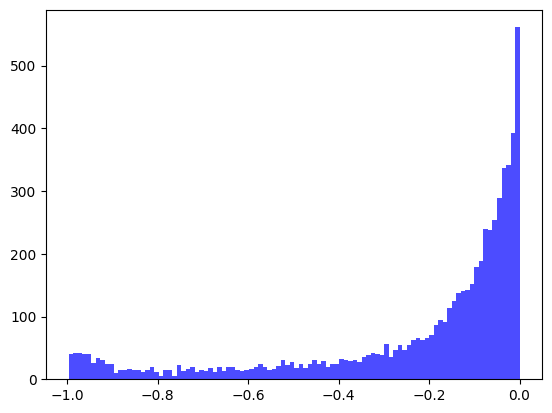

[2024-03-01T10:10:43.893230+00:00] Epochs 29, total loss: 3.51023e+04
[2024-03-01T10:10:43.894760+00:00] Training llk: -9.17652e-01


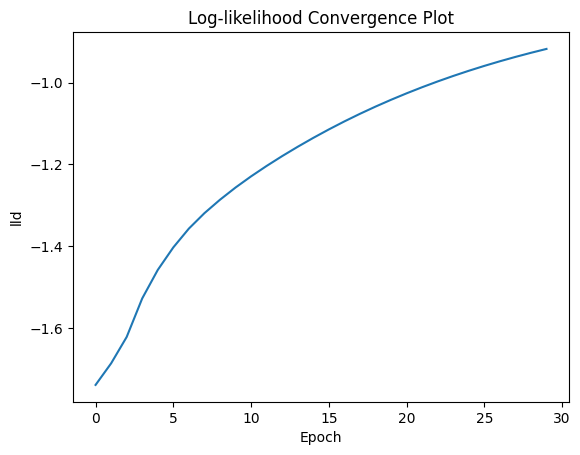

[2024-03-01T10:10:44.173610+00:00] Testing llk: -7.96546e-01
[2024-03-01T10:10:44.174708+00:00] MAE:1.19879, MRE:0.62815
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


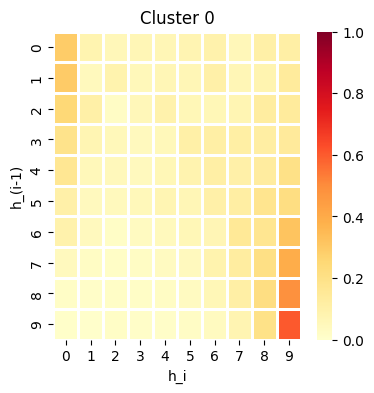

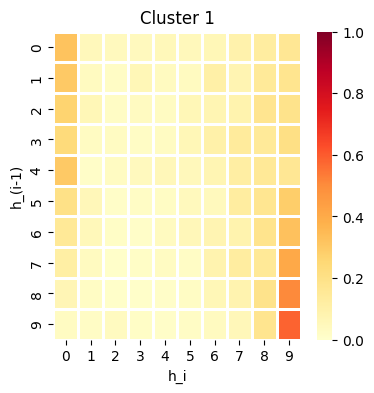

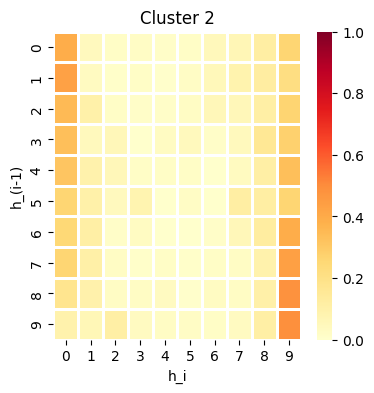

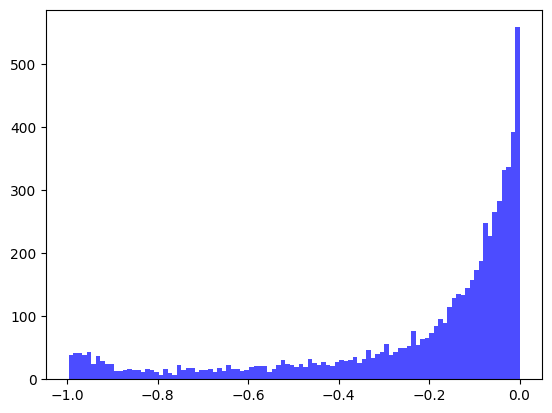

[2024-03-01T10:10:51.012775+00:00] Epochs 30, total loss: 3.48651e+04
[2024-03-01T10:10:51.014354+00:00] Training llk: -9.08683e-01


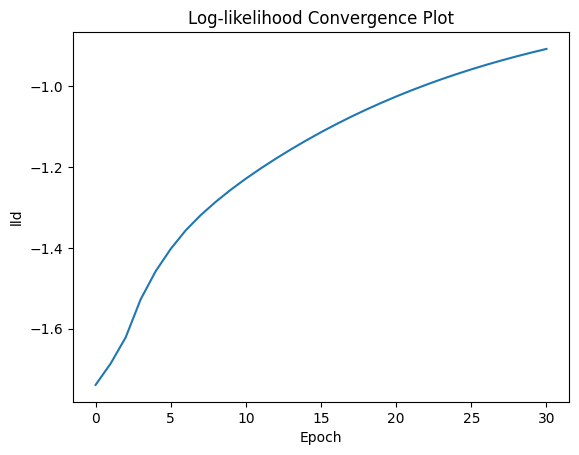

[2024-03-01T10:10:51.447931+00:00] Testing llk: -7.86288e-01
[2024-03-01T10:10:51.449375+00:00] MAE:1.19322, MRE:0.62081
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


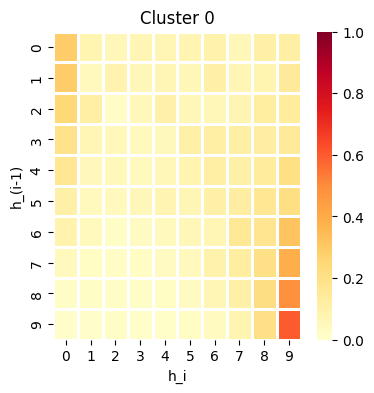

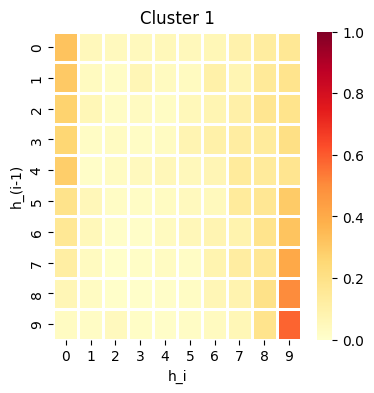

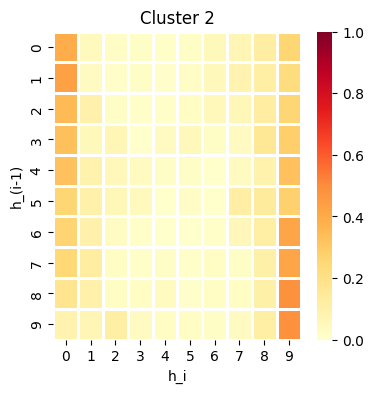

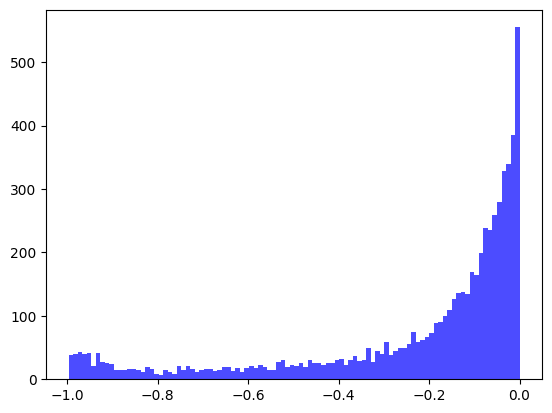

[2024-03-01T10:10:59.113113+00:00] Epochs 31, total loss: 3.46403e+04
[2024-03-01T10:10:59.113533+00:00] Training llk: -9.00215e-01


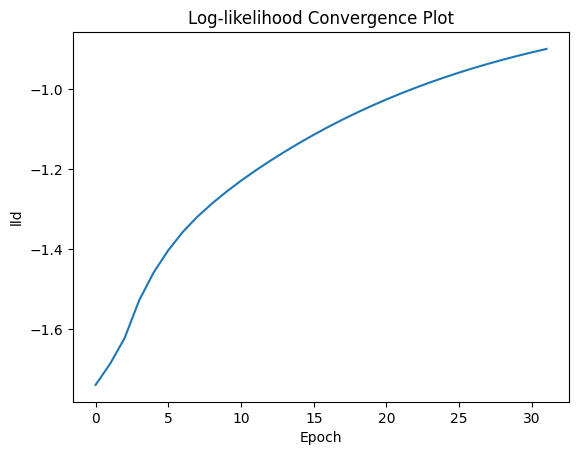

[2024-03-01T10:10:59.402278+00:00] Testing llk: -7.76652e-01
[2024-03-01T10:10:59.403381+00:00] MAE:1.18782, MRE:0.61379
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


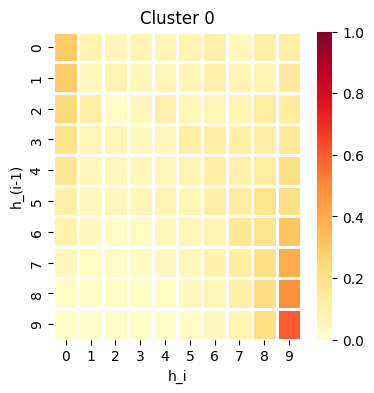

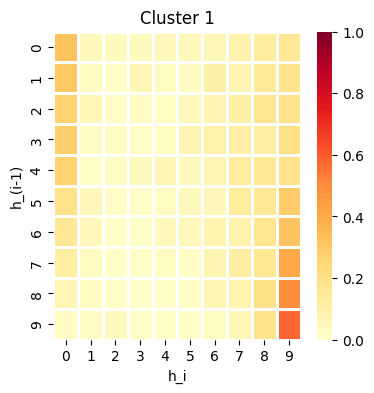

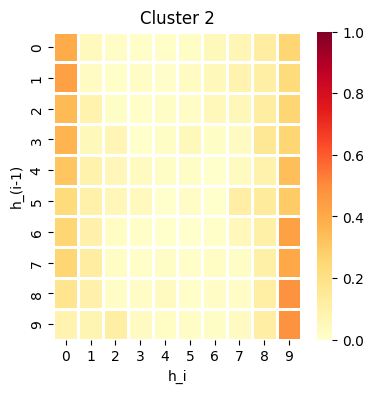

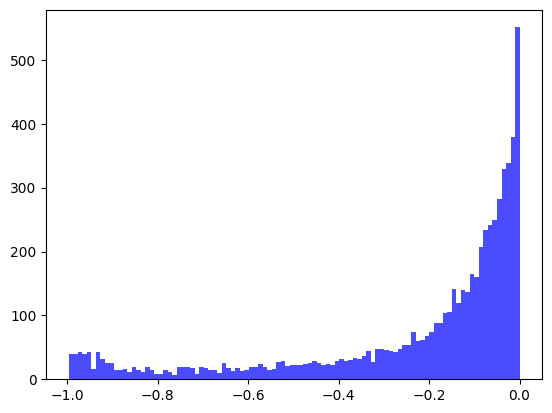

[2024-03-01T10:11:06.833701+00:00] Epochs 32, total loss: 3.44273e+04
[2024-03-01T10:11:06.835168+00:00] Training llk: -8.92218e-01


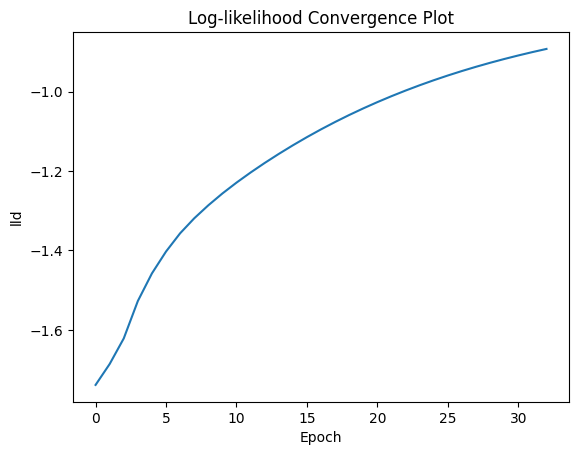

[2024-03-01T10:11:07.102193+00:00] Testing llk: -7.67599e-01
[2024-03-01T10:11:07.102417+00:00] MAE:1.18261, MRE:0.60710
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


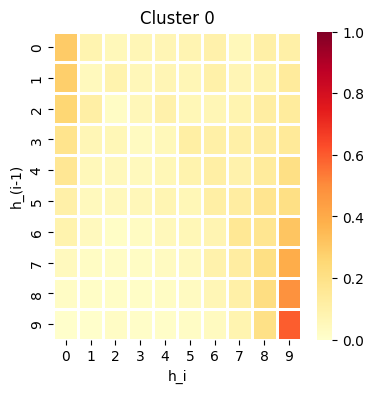

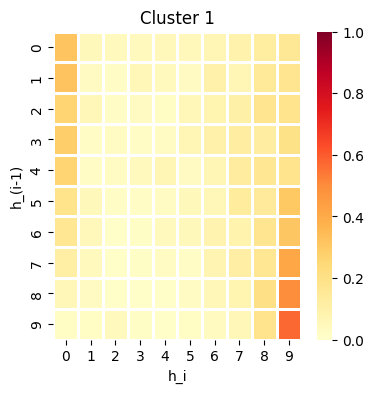

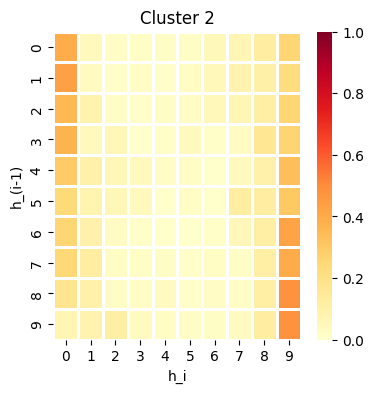

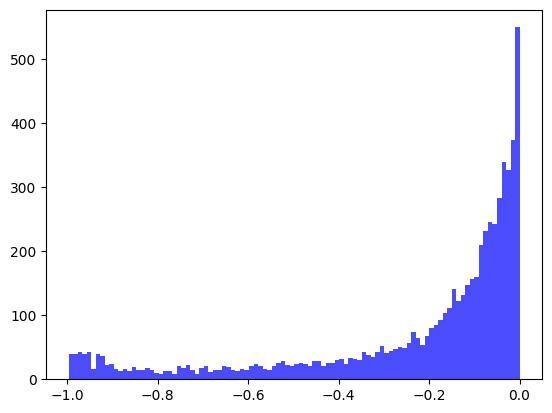

[2024-03-01T10:11:13.381516+00:00] Epochs 33, total loss: 3.42254e+04
[2024-03-01T10:11:13.381927+00:00] Training llk: -8.84666e-01


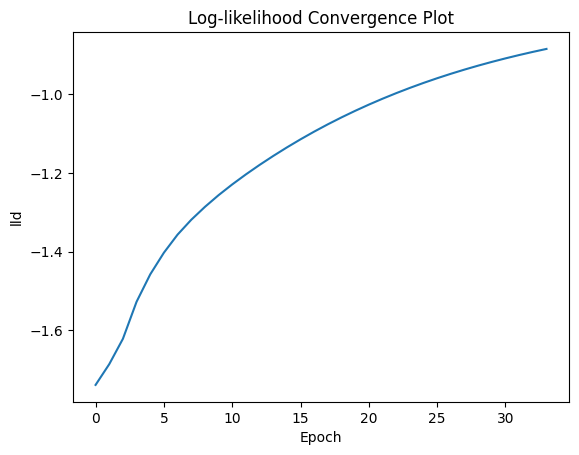

[2024-03-01T10:11:13.654581+00:00] Testing llk: -7.59093e-01
[2024-03-01T10:11:13.654754+00:00] MAE:1.17757, MRE:0.60074
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


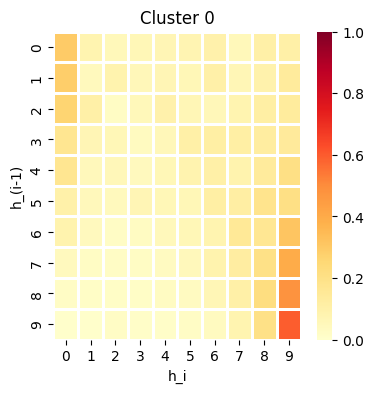

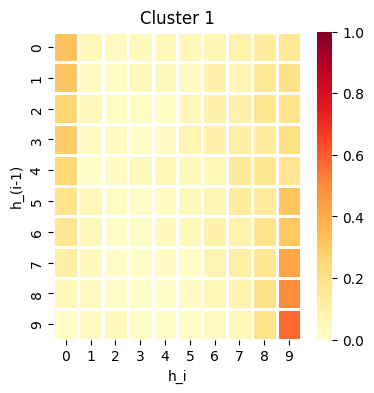

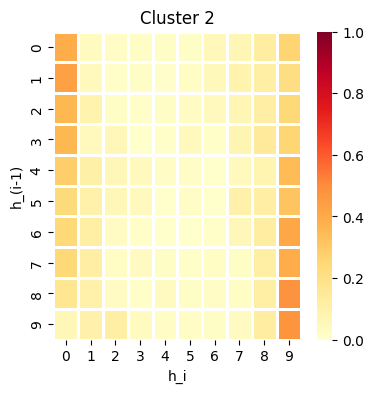

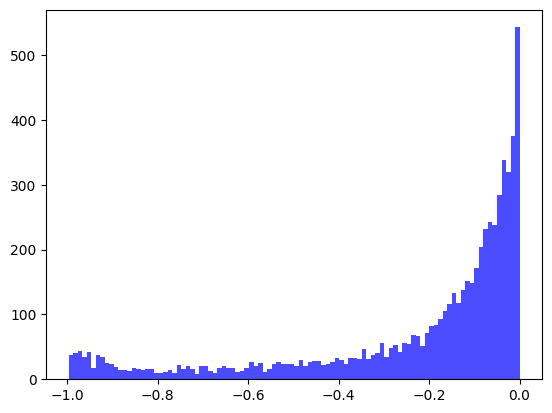

[2024-03-01T10:11:21.816468+00:00] Epochs 34, total loss: 3.40339e+04
[2024-03-01T10:11:21.818045+00:00] Training llk: -8.77530e-01


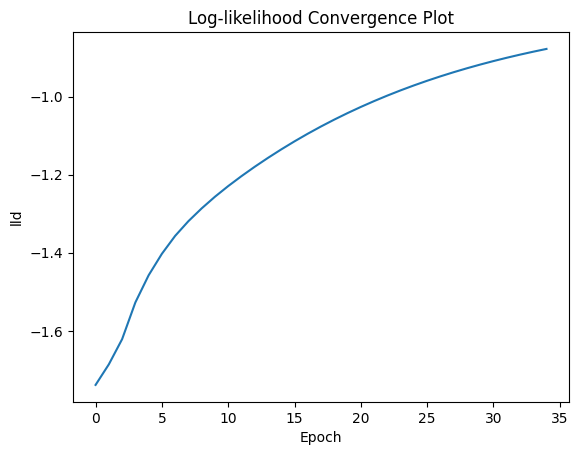

[2024-03-01T10:11:22.096600+00:00] Testing llk: -7.51099e-01
[2024-03-01T10:11:22.096764+00:00] MAE:1.17268, MRE:0.59464
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


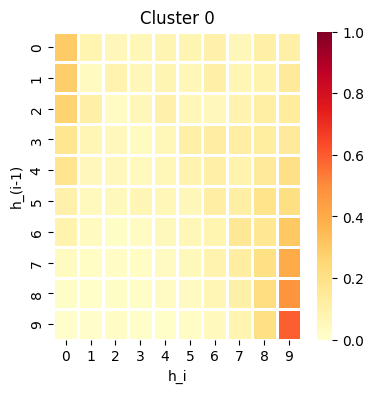

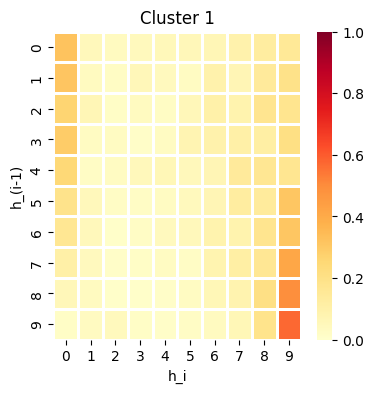

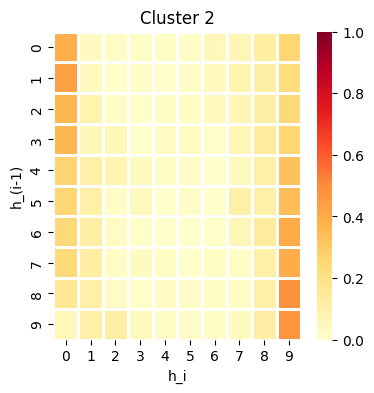

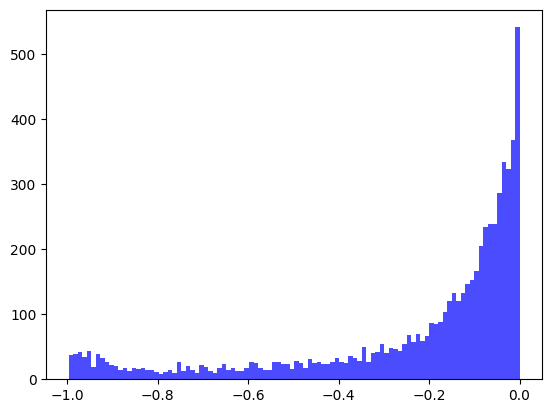

[2024-03-01T10:11:28.505415+00:00] Epochs 35, total loss: 3.38523e+04
[2024-03-01T10:11:28.506945+00:00] Training llk: -8.70787e-01


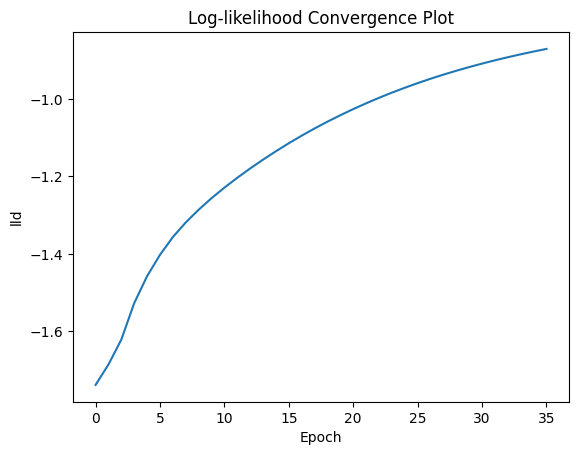

[2024-03-01T10:11:28.888916+00:00] Testing llk: -7.43583e-01
[2024-03-01T10:11:28.890180+00:00] MAE:1.16795, MRE:0.58882
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


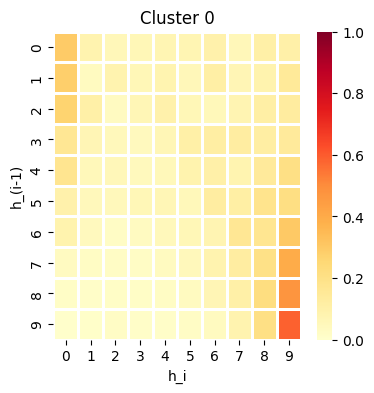

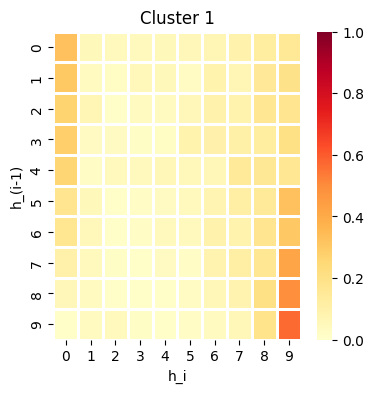

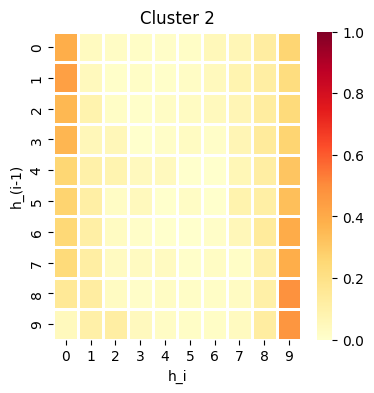

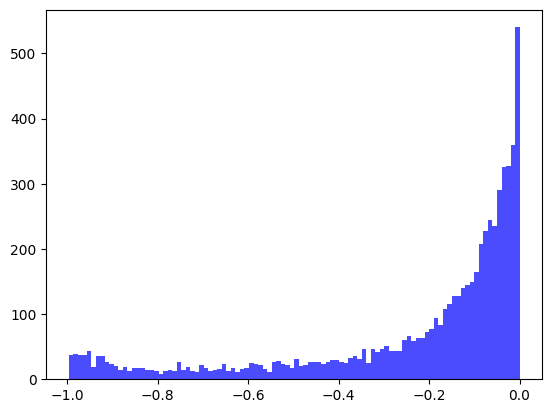

[2024-03-01T10:11:36.355263+00:00] Epochs 36, total loss: 3.36800e+04
[2024-03-01T10:11:36.357008+00:00] Training llk: -8.64413e-01


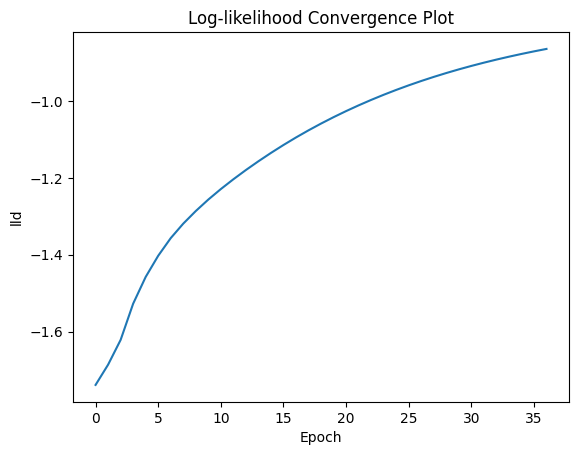

[2024-03-01T10:11:36.632913+00:00] Testing llk: -7.36515e-01
[2024-03-01T10:11:36.633085+00:00] MAE:1.16337, MRE:0.58325
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


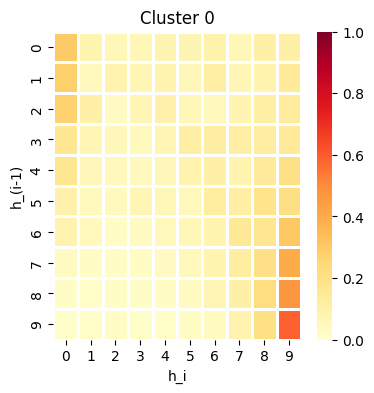

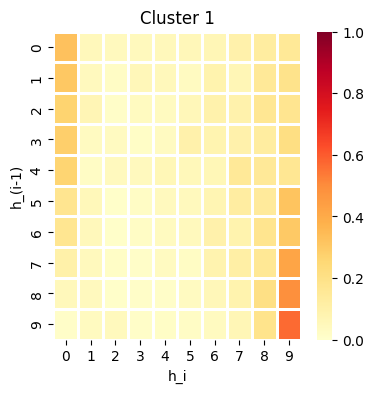

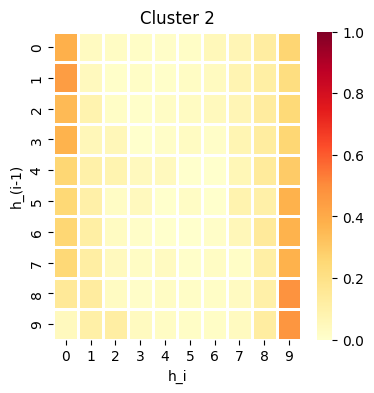

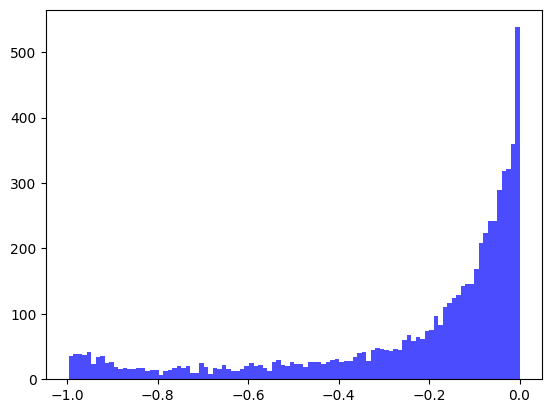

[2024-03-01T10:11:44.210099+00:00] Epochs 37, total loss: 3.35164e+04
[2024-03-01T10:11:44.211810+00:00] Training llk: -8.58385e-01


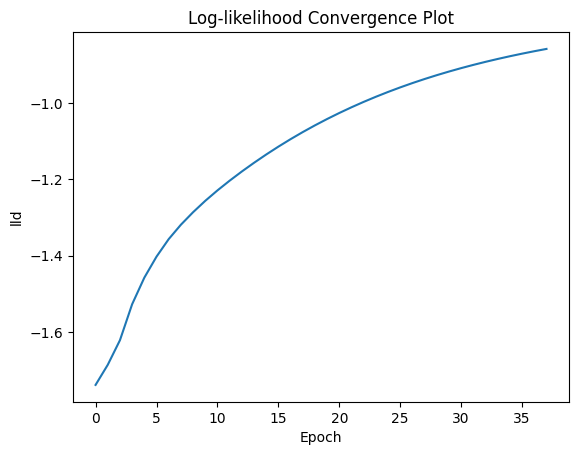

[2024-03-01T10:11:44.623023+00:00] Testing llk: -7.29866e-01
[2024-03-01T10:11:44.623631+00:00] MAE:1.15893, MRE:0.57792
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


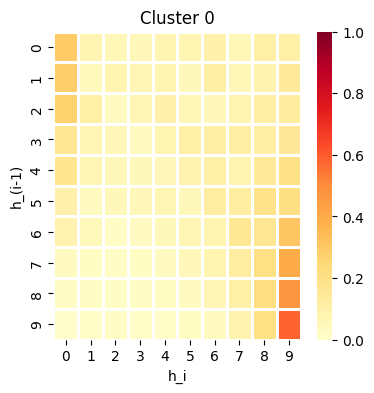

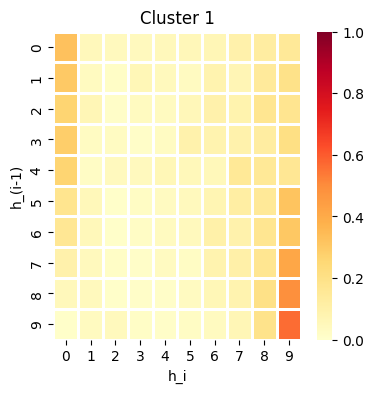

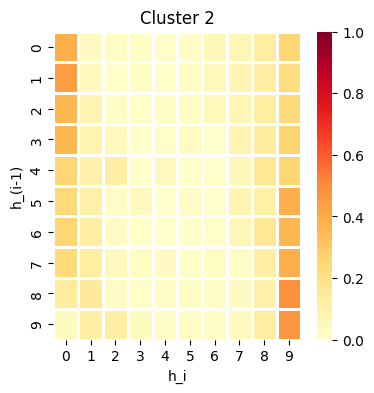

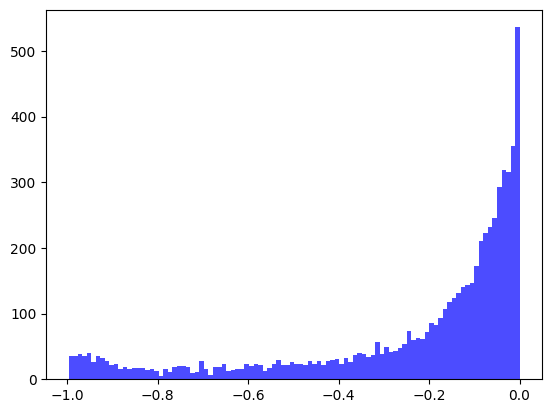

[2024-03-01T10:11:50.874085+00:00] Epochs 38, total loss: 3.33610e+04
[2024-03-01T10:11:50.875570+00:00] Training llk: -8.52684e-01


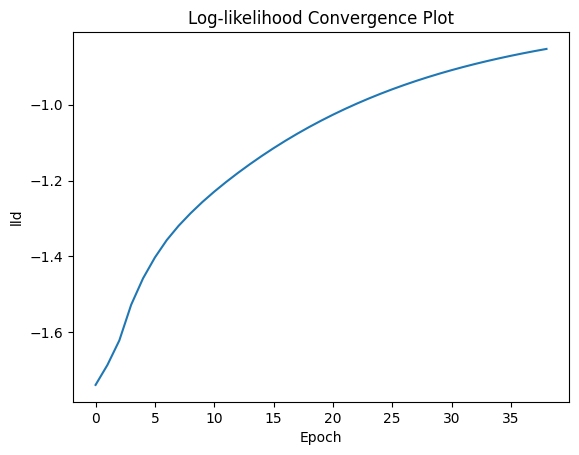

[2024-03-01T10:11:51.164451+00:00] Testing llk: -7.23609e-01
[2024-03-01T10:11:51.164736+00:00] MAE:1.15462, MRE:0.57283
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


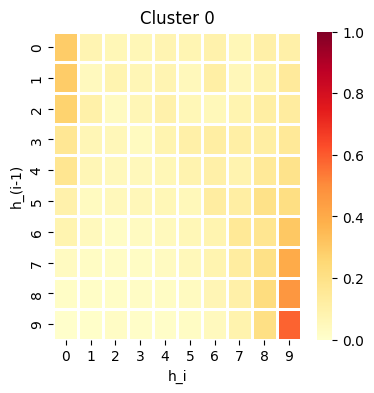

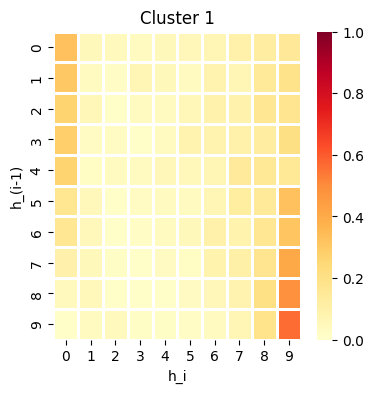

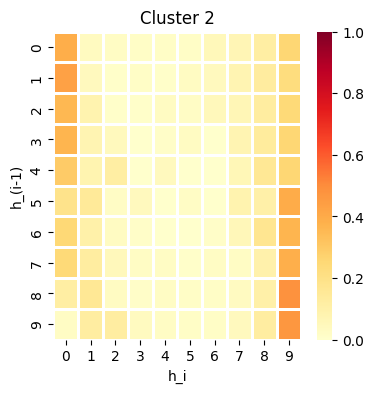

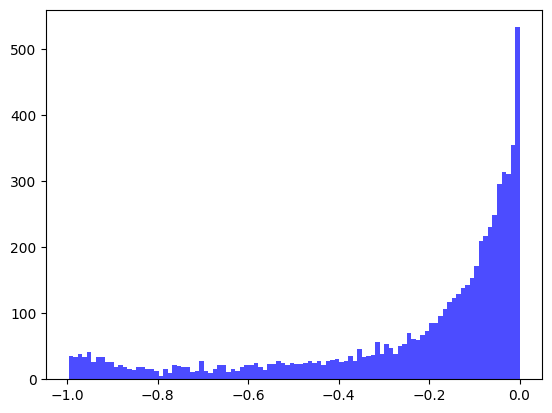

[2024-03-01T10:11:58.582327+00:00] Epochs 39, total loss: 3.32135e+04
[2024-03-01T10:11:58.583792+00:00] Training llk: -8.47288e-01


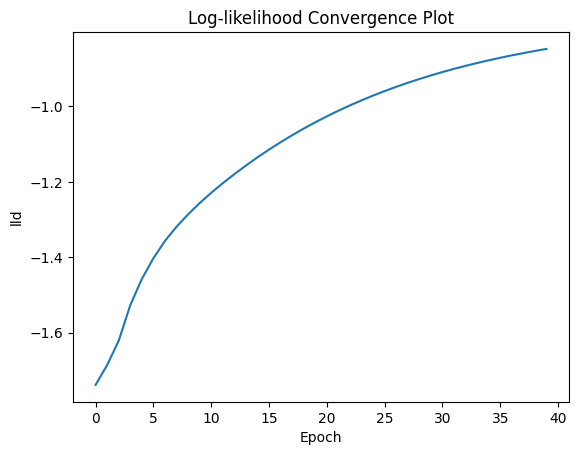

[2024-03-01T10:11:58.881188+00:00] Testing llk: -7.17718e-01
[2024-03-01T10:11:58.881782+00:00] MAE:1.15046, MRE:0.56798
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


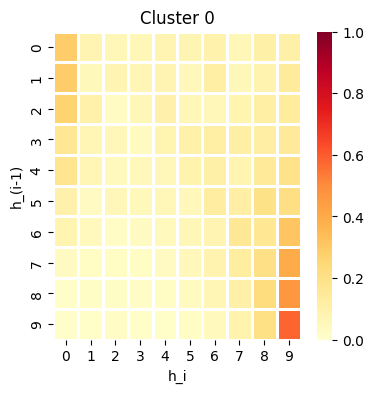

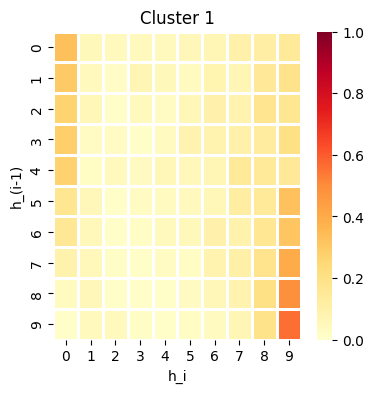

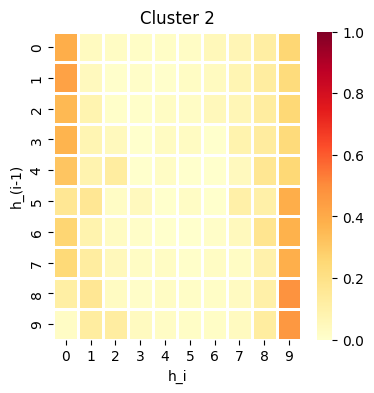

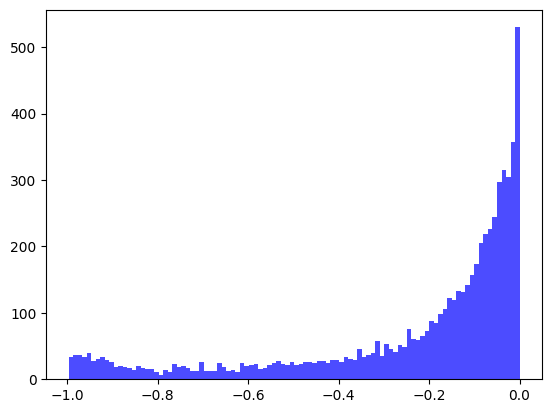

[2024-03-01T10:12:05.675158+00:00] Epochs 40, total loss: 3.30732e+04
[2024-03-01T10:12:05.676787+00:00] Training llk: -8.42180e-01


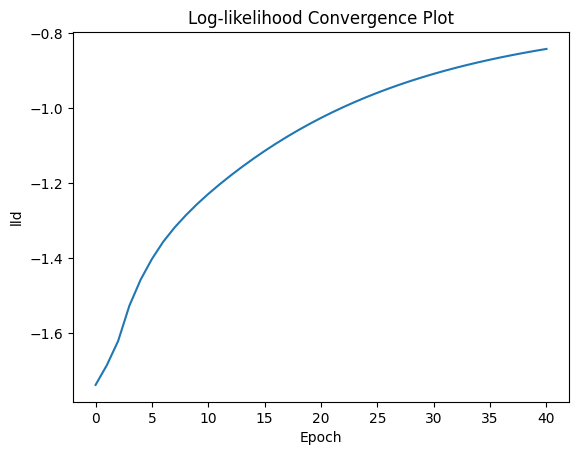

[2024-03-01T10:12:06.014250+00:00] Testing llk: -7.12172e-01
[2024-03-01T10:12:06.014475+00:00] MAE:1.14643, MRE:0.56334
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


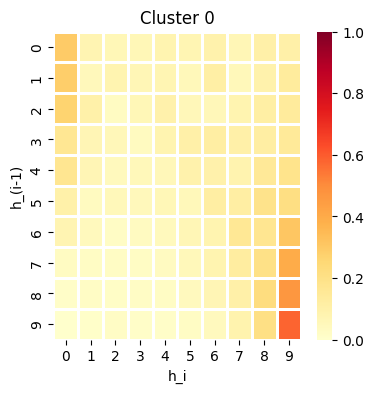

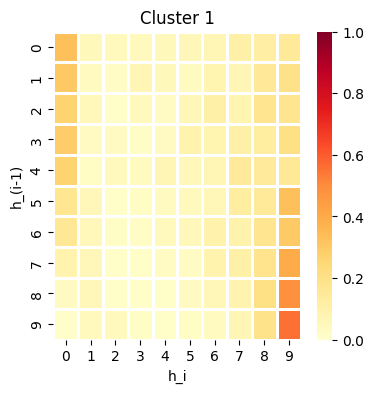

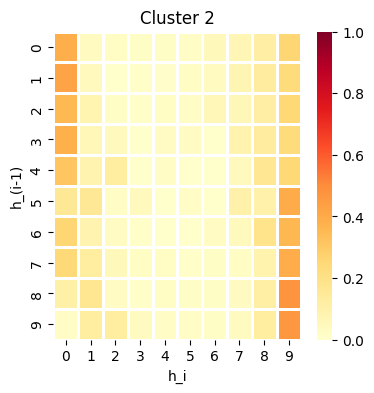

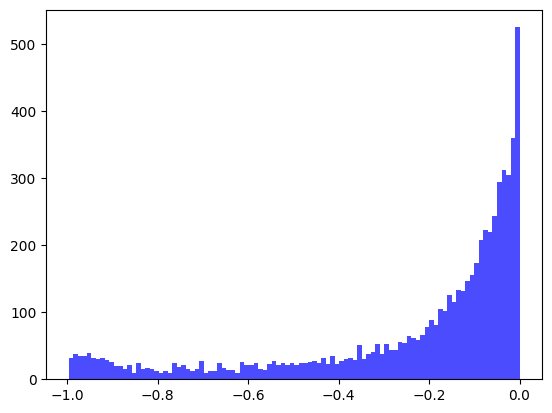

[2024-03-01T10:12:13.361851+00:00] Epochs 41, total loss: 3.29399e+04
[2024-03-01T10:12:13.362227+00:00] Training llk: -8.37342e-01


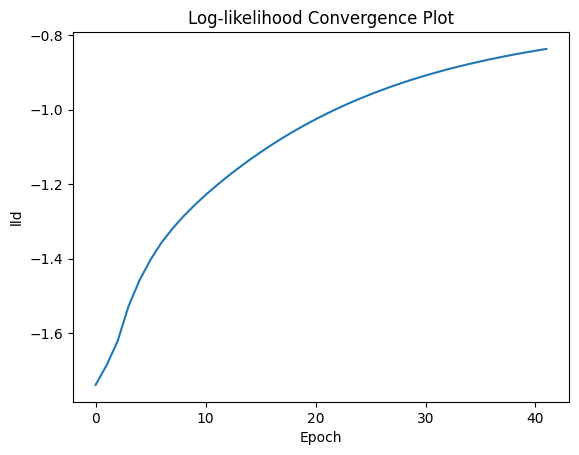

[2024-03-01T10:12:13.629811+00:00] Testing llk: -7.06946e-01
[2024-03-01T10:12:13.630824+00:00] MAE:1.14252, MRE:0.55891
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


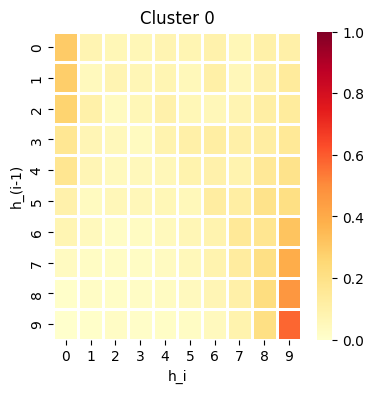

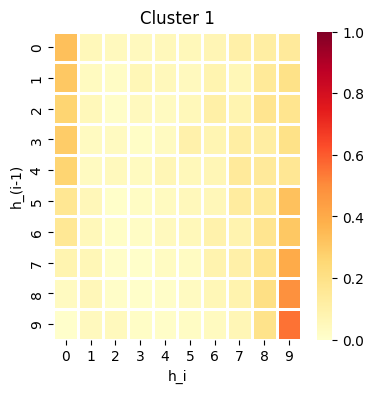

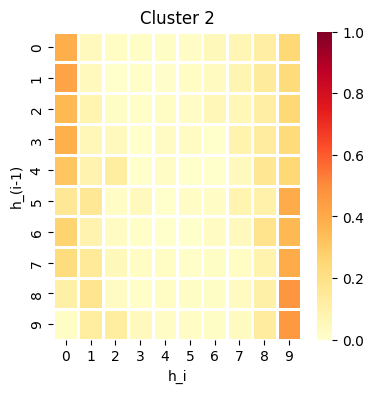

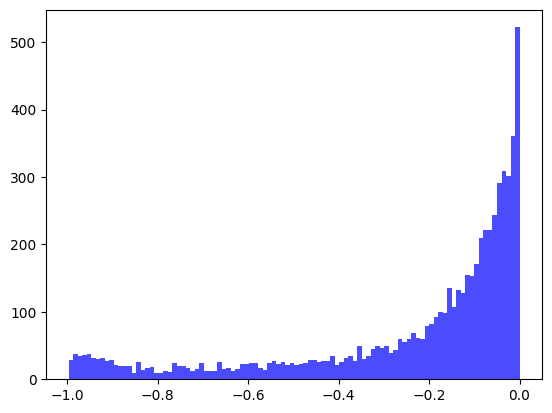

[2024-03-01T10:12:19.869016+00:00] Epochs 42, total loss: 3.28130e+04
[2024-03-01T10:12:19.873602+00:00] Training llk: -8.32758e-01


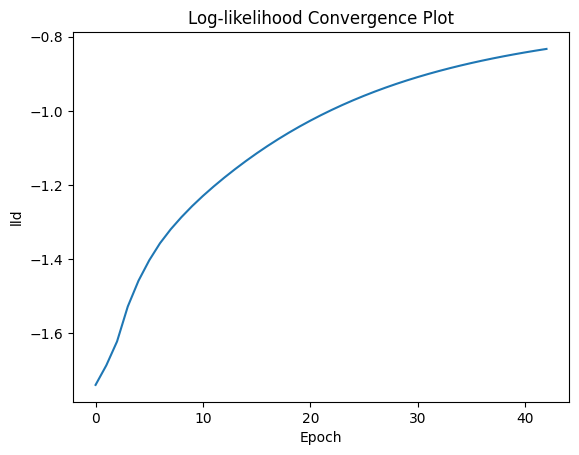

[2024-03-01T10:12:20.153575+00:00] Testing llk: -7.02021e-01
[2024-03-01T10:12:20.153748+00:00] MAE:1.13872, MRE:0.55469
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


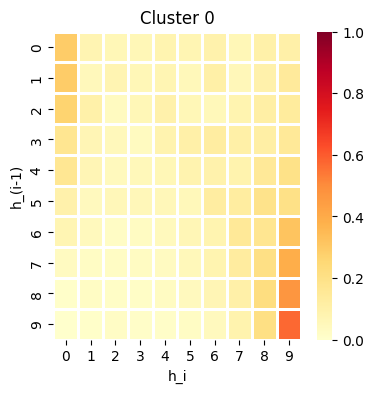

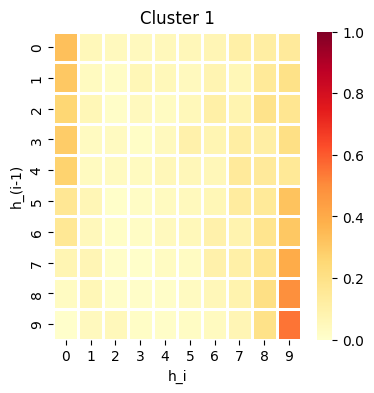

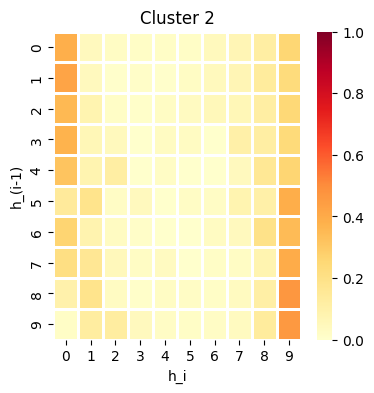

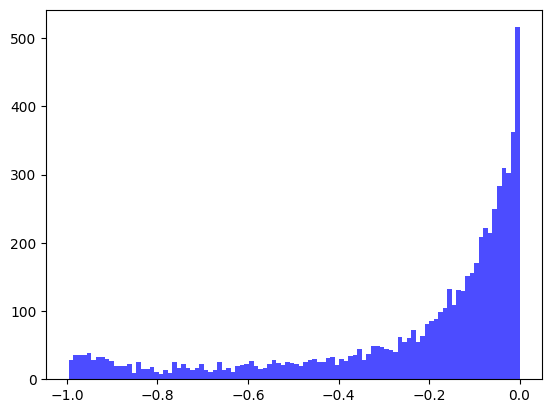

[2024-03-01T10:12:27.922701+00:00] Epochs 43, total loss: 3.26923e+04
[2024-03-01T10:12:27.924124+00:00] Training llk: -8.28412e-01


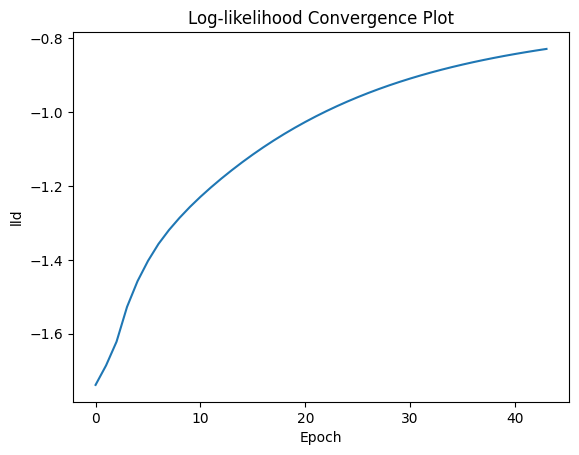

[2024-03-01T10:12:28.199454+00:00] Testing llk: -6.97378e-01
[2024-03-01T10:12:28.200856+00:00] MAE:1.13504, MRE:0.55065
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


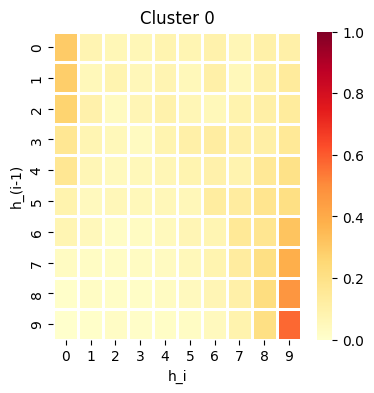

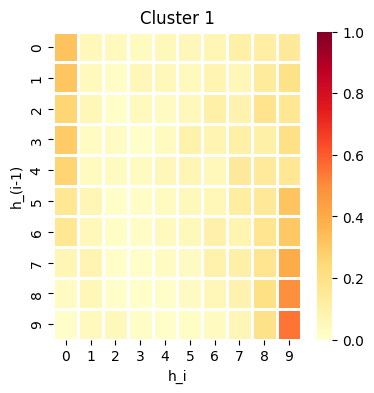

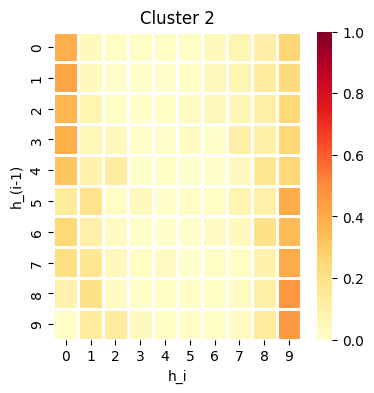

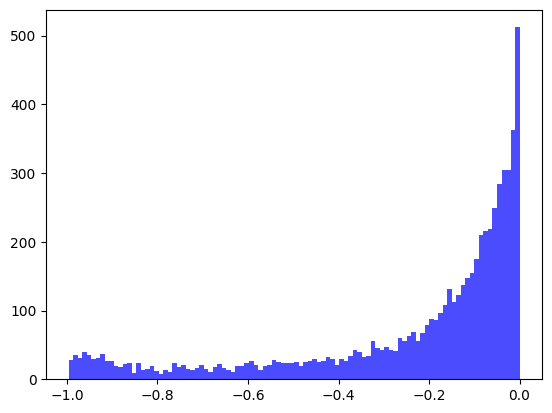

[2024-03-01T10:12:34.661801+00:00] Epochs 44, total loss: 3.25773e+04
[2024-03-01T10:12:34.668685+00:00] Training llk: -8.24292e-01


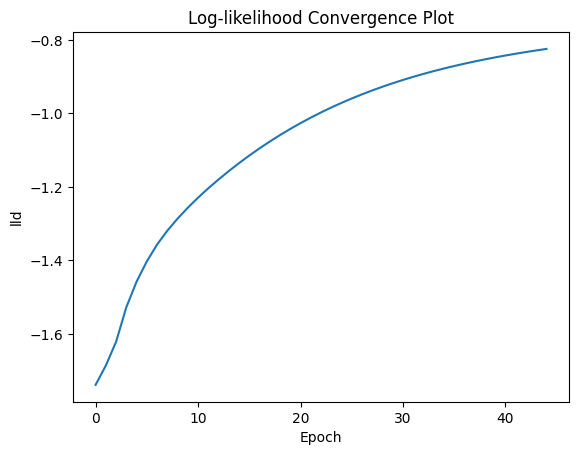

[2024-03-01T10:12:35.116491+00:00] Testing llk: -6.92999e-01
[2024-03-01T10:12:35.123068+00:00] MAE:1.13146, MRE:0.54679
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


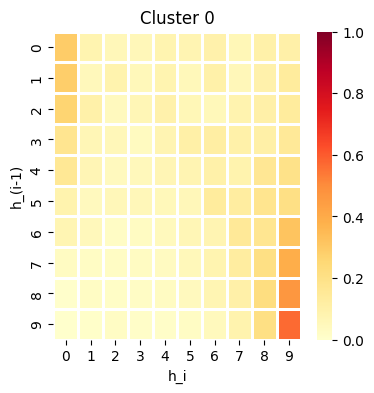

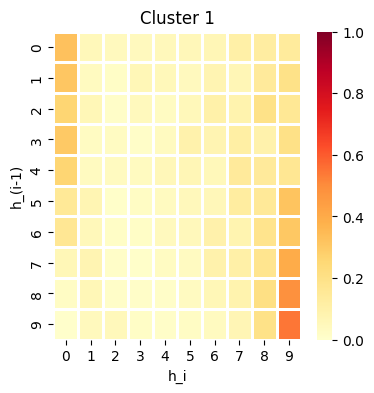

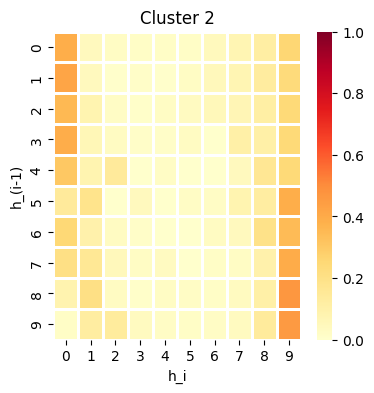

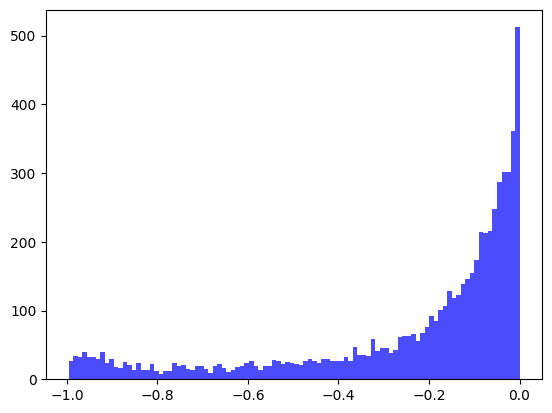

[2024-03-01T10:12:42.148007+00:00] Epochs 45, total loss: 3.24679e+04
[2024-03-01T10:12:42.149484+00:00] Training llk: -8.20383e-01


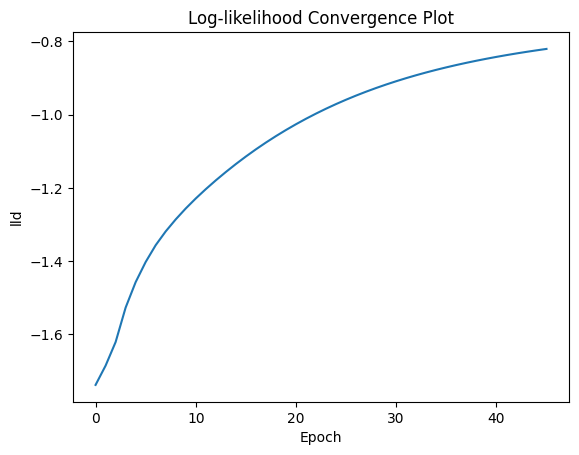

[2024-03-01T10:12:42.407367+00:00] Testing llk: -6.88867e-01
[2024-03-01T10:12:42.408537+00:00] MAE:1.12799, MRE:0.54312
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


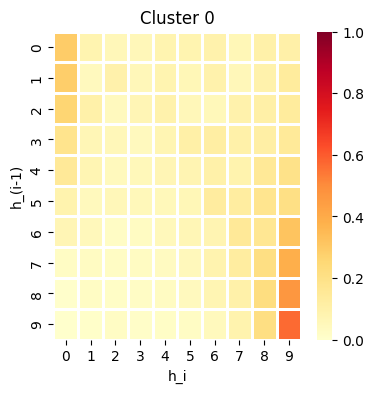

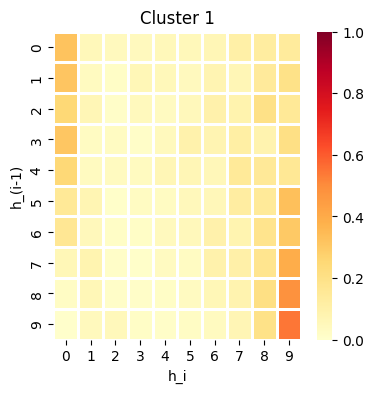

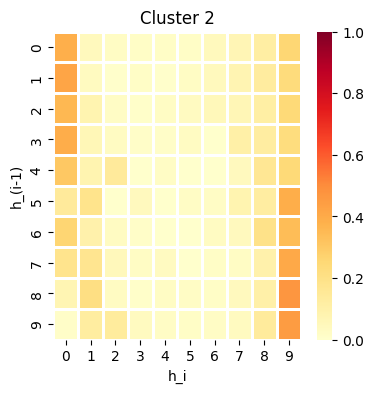

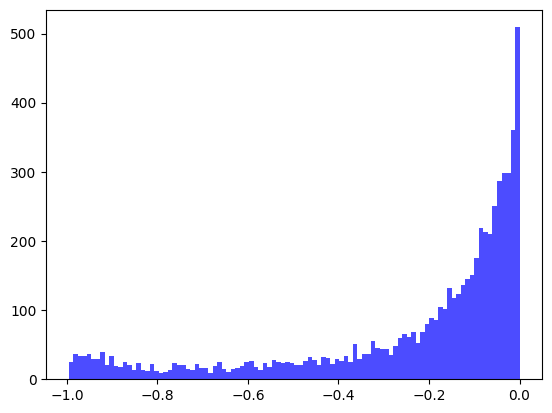

[2024-03-01T10:12:49.816263+00:00] Epochs 46, total loss: 3.23635e+04
[2024-03-01T10:12:49.817702+00:00] Training llk: -8.16672e-01


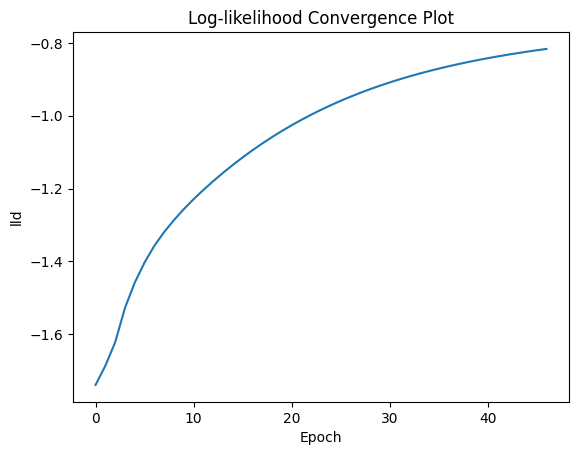

[2024-03-01T10:12:50.300095+00:00] Testing llk: -6.84967e-01
[2024-03-01T10:12:50.300272+00:00] MAE:1.12463, MRE:0.53962
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


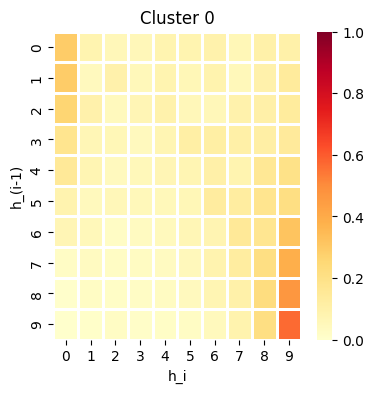

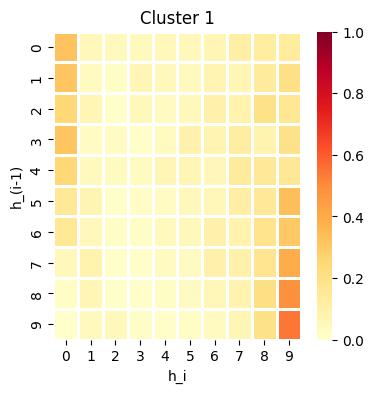

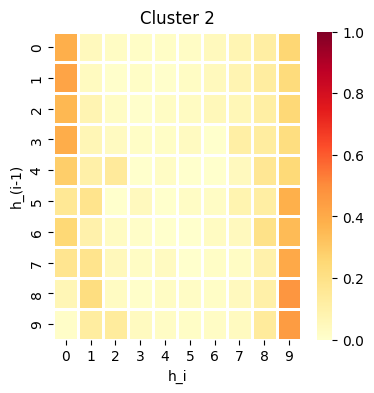

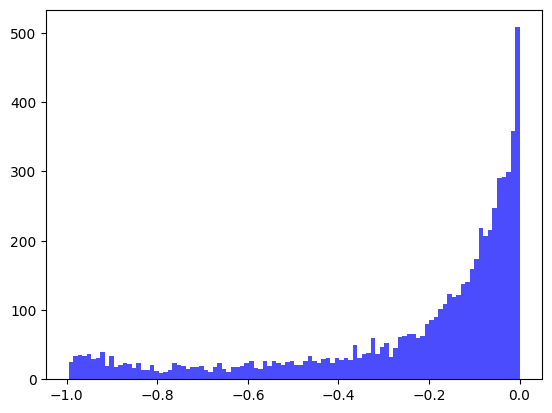

[2024-03-01T10:12:56.585582+00:00] Epochs 47, total loss: 3.22640e+04
[2024-03-01T10:12:56.587046+00:00] Training llk: -8.13149e-01


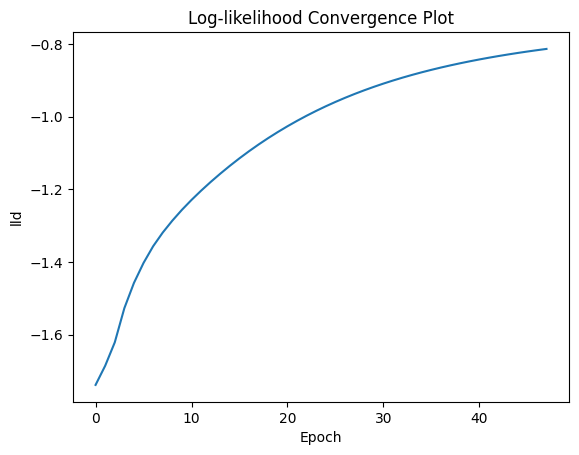

[2024-03-01T10:12:56.855728+00:00] Testing llk: -6.81285e-01
[2024-03-01T10:12:56.856828+00:00] MAE:1.12136, MRE:0.53626
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


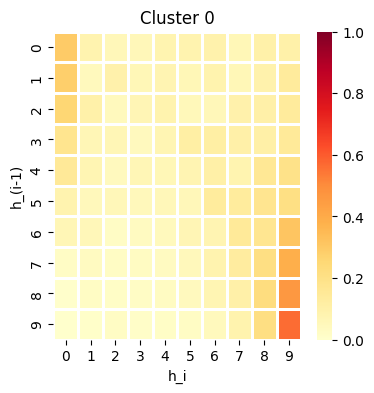

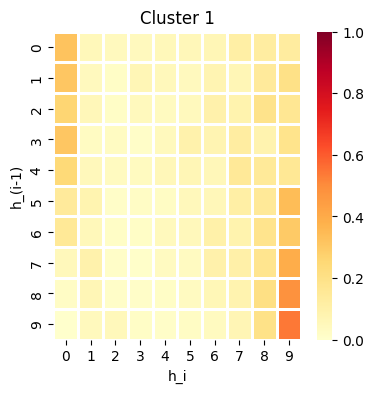

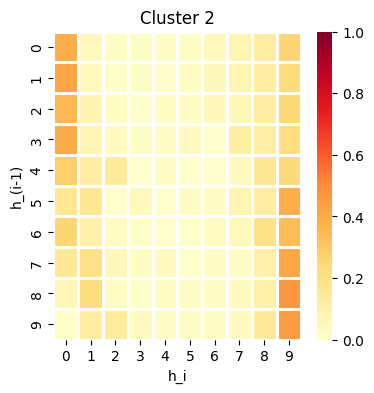

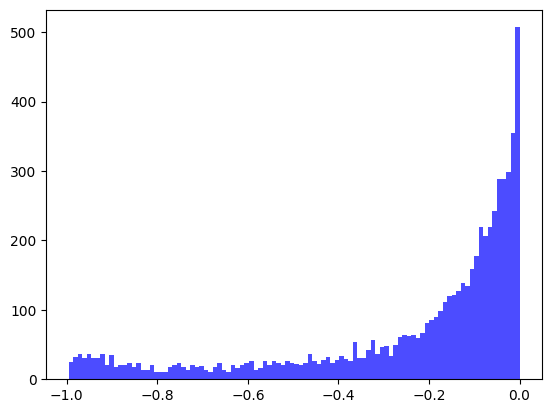

[2024-03-01T10:13:04.322932+00:00] Epochs 48, total loss: 3.21691e+04
[2024-03-01T10:13:04.323312+00:00] Training llk: -8.09802e-01


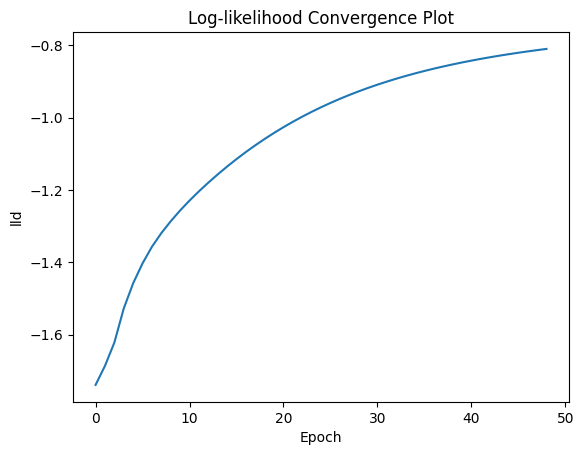

[2024-03-01T10:13:04.610007+00:00] Testing llk: -6.77807e-01
[2024-03-01T10:13:04.615092+00:00] MAE:1.11818, MRE:0.53304
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


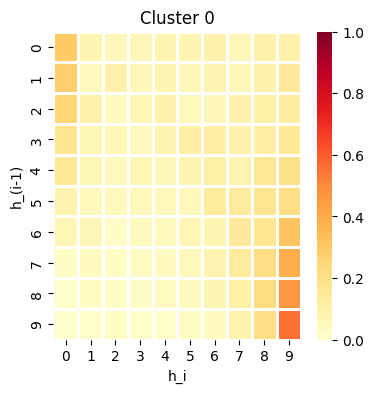

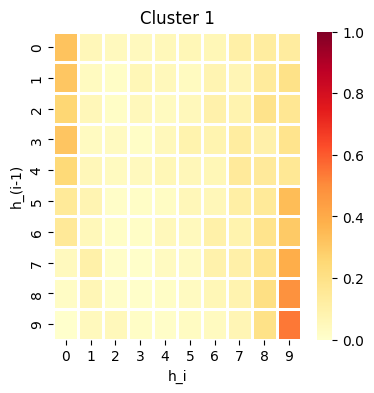

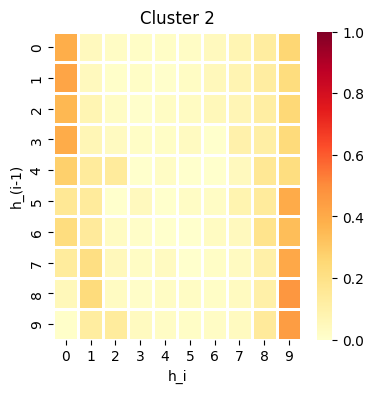

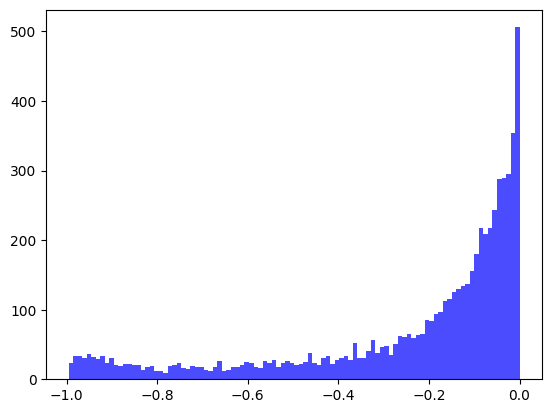

[2024-03-01T10:13:11.468445+00:00] Epochs 49, total loss: 3.20786e+04
[2024-03-01T10:13:11.469952+00:00] Training llk: -8.06621e-01


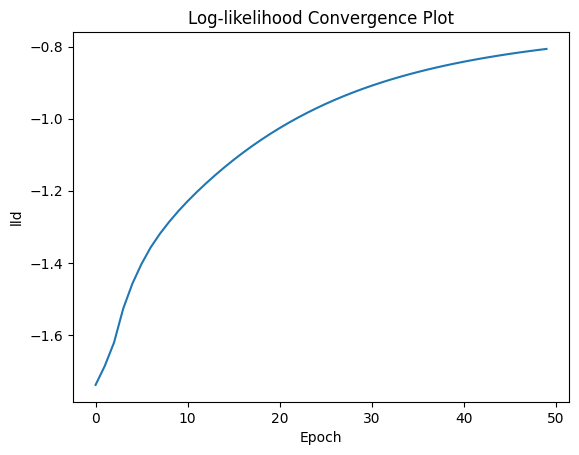

[2024-03-01T10:13:11.757008+00:00] Testing llk: -6.74520e-01
[2024-03-01T10:13:11.757189+00:00] MAE:1.11508, MRE:0.52996
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


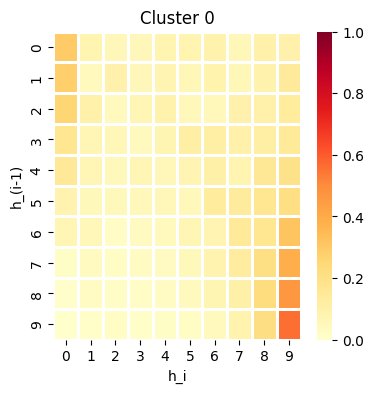

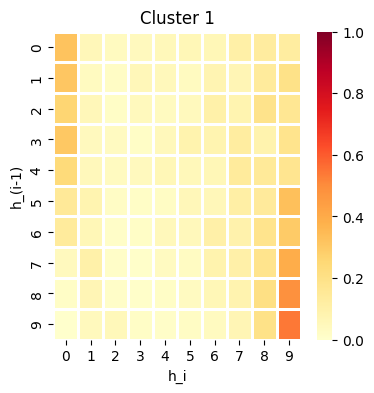

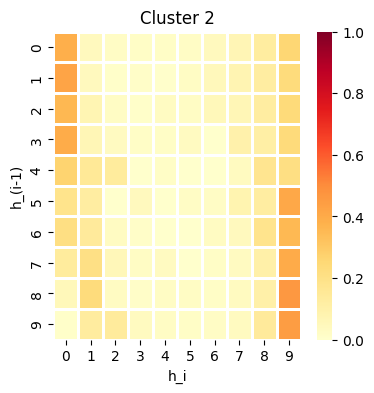

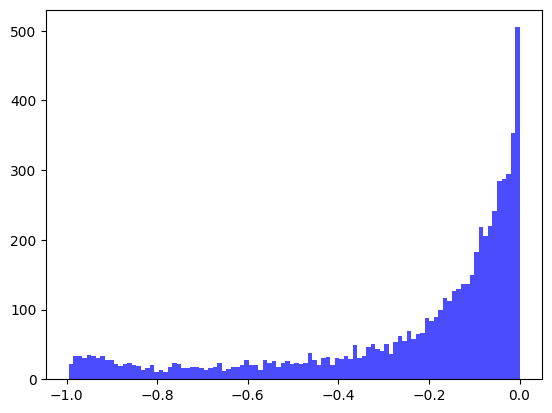

[2024-03-01T10:13:19.148562+00:00] Epochs 50, total loss: 3.19921e+04
[2024-03-01T10:13:19.150008+00:00] Training llk: -8.03597e-01


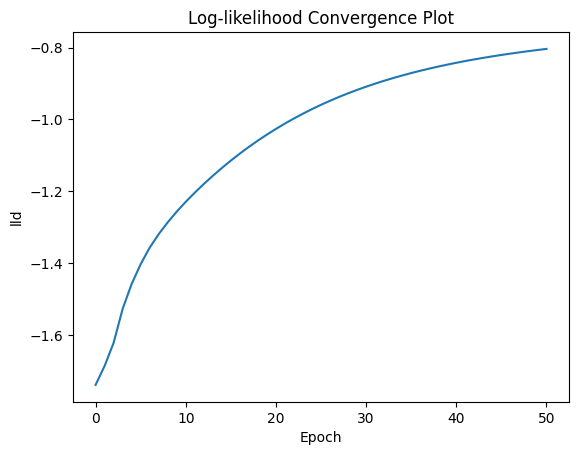

[2024-03-01T10:13:19.429159+00:00] Testing llk: -6.71414e-01
[2024-03-01T10:13:19.430366+00:00] MAE:1.11208, MRE:0.52701
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


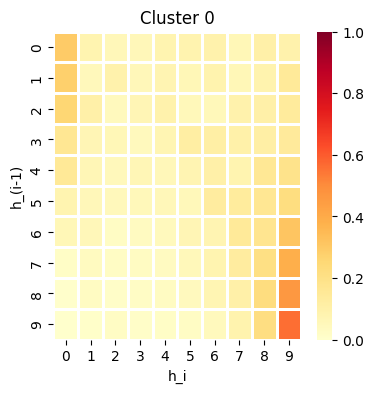

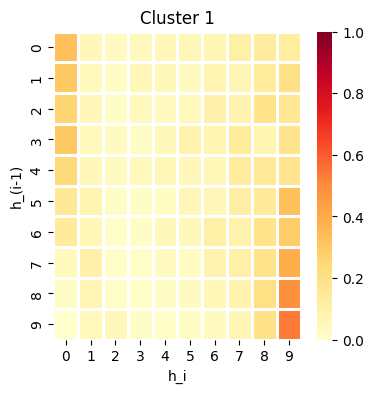

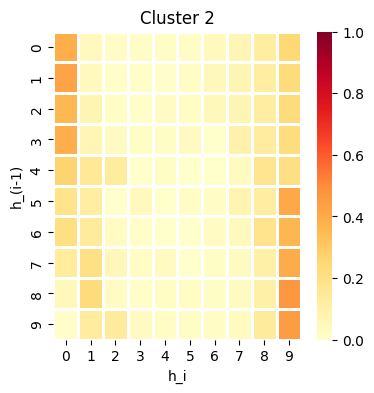

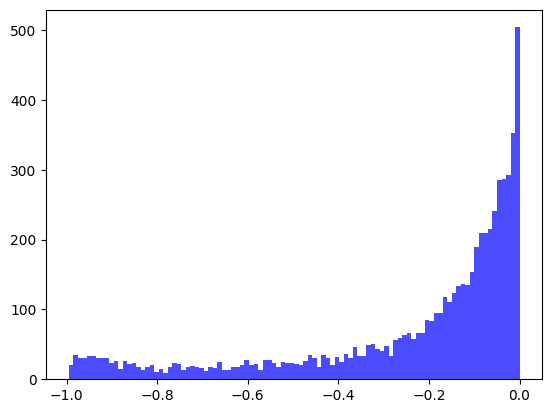

[2024-03-01T10:13:25.810954+00:00] Epochs 51, total loss: 3.19096e+04
[2024-03-01T10:13:25.812423+00:00] Training llk: -8.00720e-01


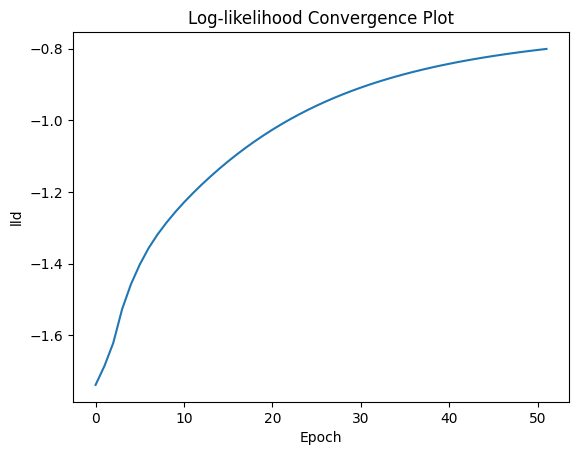

[2024-03-01T10:13:26.123697+00:00] Testing llk: -6.68477e-01
[2024-03-01T10:13:26.123876+00:00] MAE:1.10916, MRE:0.52418
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


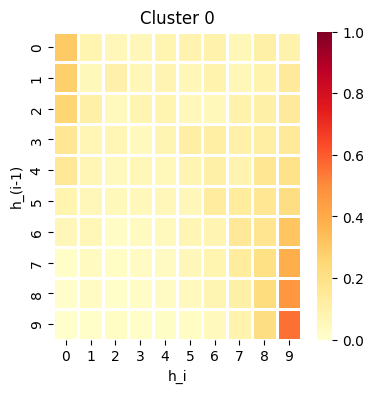

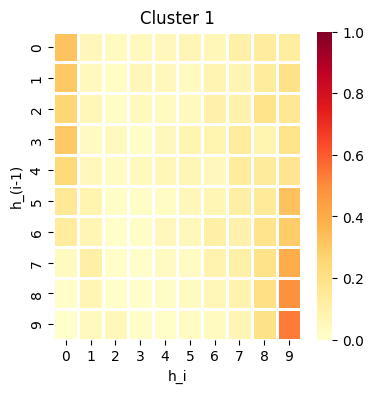

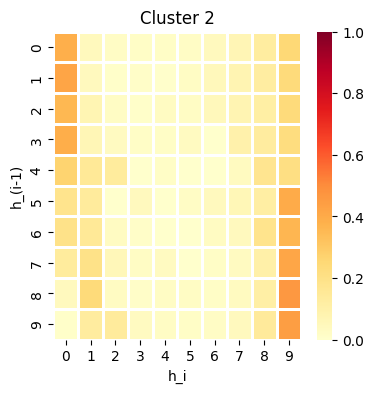

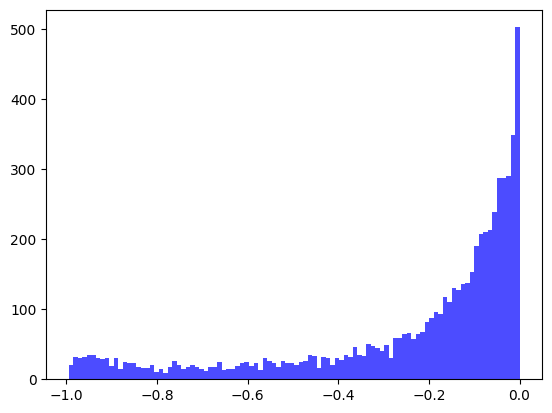

[2024-03-01T10:13:33.930136+00:00] Epochs 52, total loss: 3.18307e+04
[2024-03-01T10:13:33.930490+00:00] Training llk: -7.97982e-01


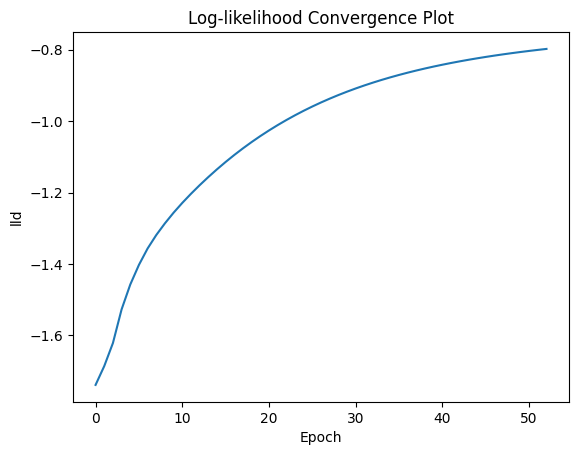

[2024-03-01T10:13:34.210807+00:00] Testing llk: -6.65698e-01
[2024-03-01T10:13:34.211817+00:00] MAE:1.10633, MRE:0.52146
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


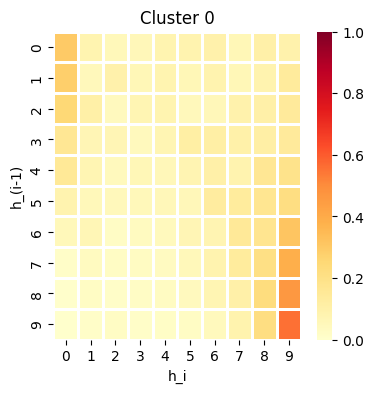

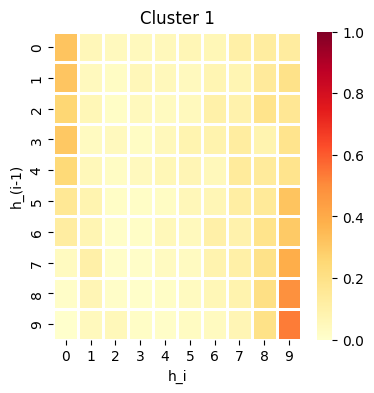

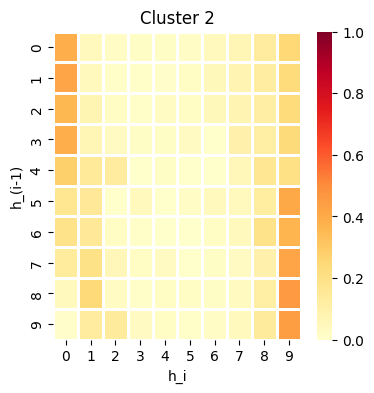

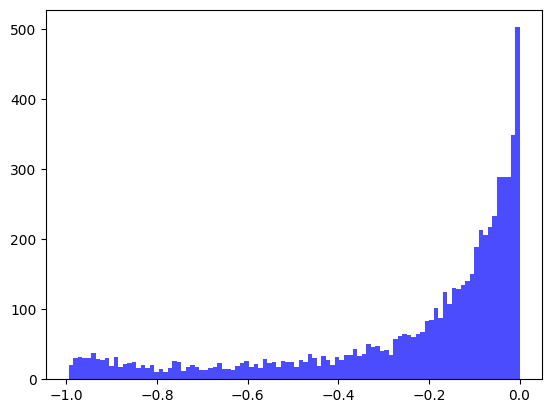

[2024-03-01T10:13:40.848491+00:00] Epochs 53, total loss: 3.17552e+04
[2024-03-01T10:13:40.849874+00:00] Training llk: -7.95376e-01


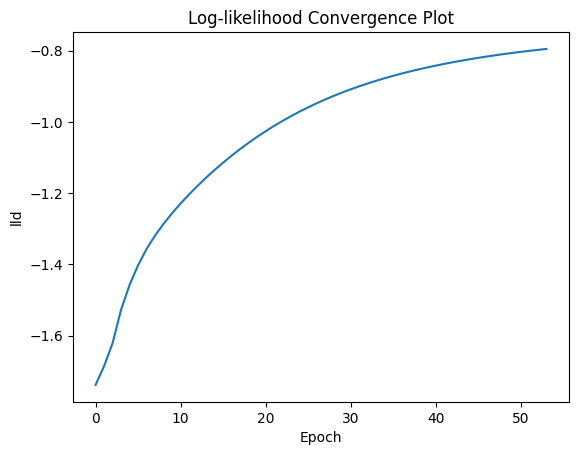

[2024-03-01T10:13:41.242177+00:00] Testing llk: -6.63069e-01
[2024-03-01T10:13:41.243164+00:00] MAE:1.10358, MRE:0.51886
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


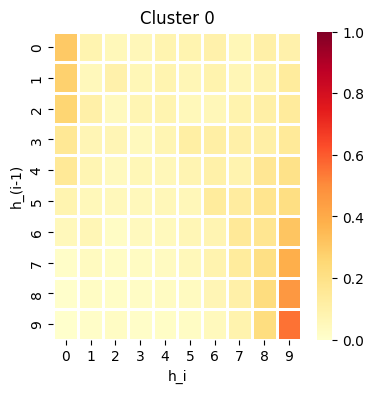

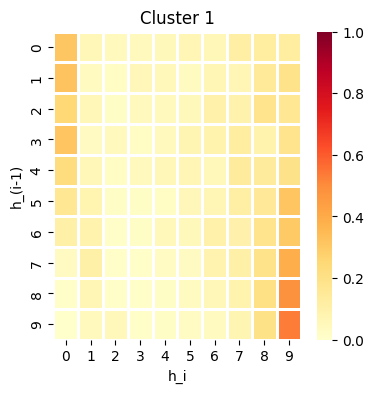

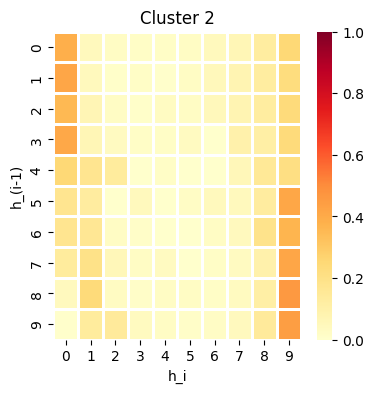

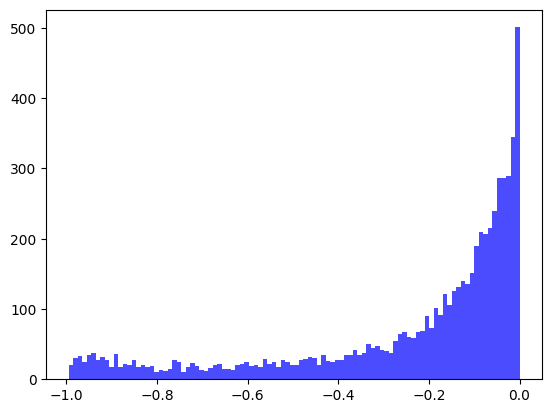

[2024-03-01T10:13:48.389356+00:00] Epochs 54, total loss: 3.16831e+04
[2024-03-01T10:13:48.389756+00:00] Training llk: -7.92894e-01


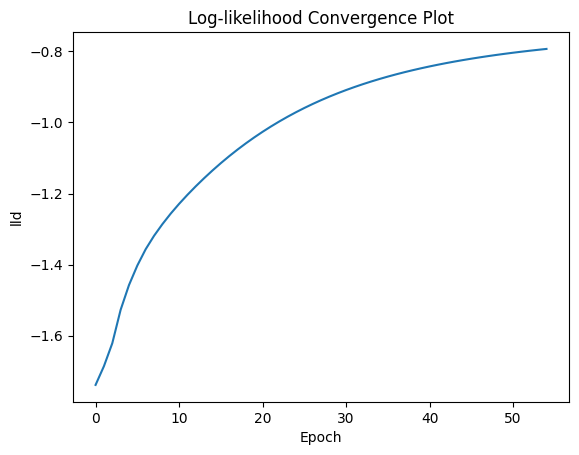

[2024-03-01T10:13:48.695773+00:00] Testing llk: -6.60581e-01
[2024-03-01T10:13:48.695947+00:00] MAE:1.10091, MRE:0.51638
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


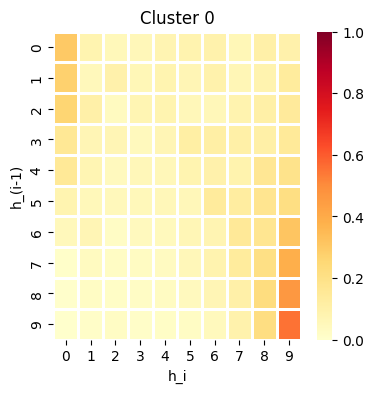

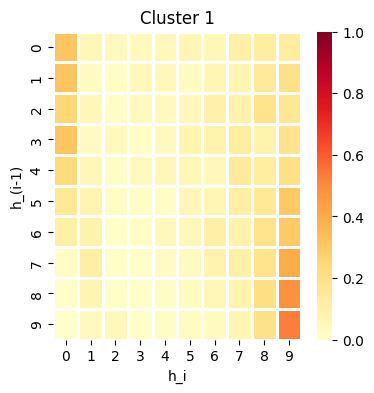

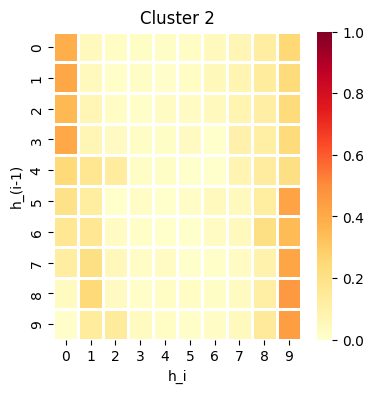

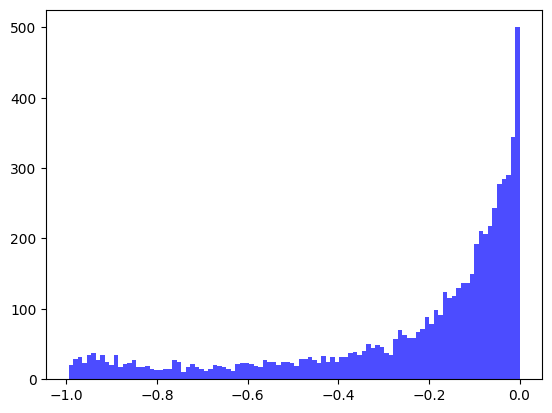

[2024-03-01T10:13:56.558400+00:00] Epochs 55, total loss: 3.16141e+04
[2024-03-01T10:13:56.559841+00:00] Training llk: -7.90529e-01


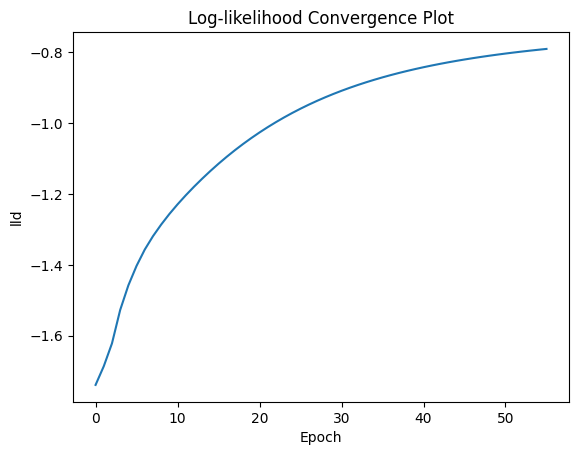

[2024-03-01T10:13:56.845857+00:00] Testing llk: -6.58225e-01
[2024-03-01T10:13:56.846896+00:00] MAE:1.09831, MRE:0.51400
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


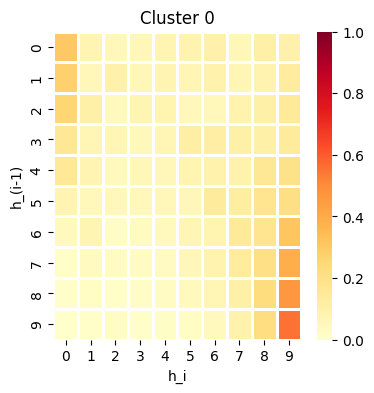

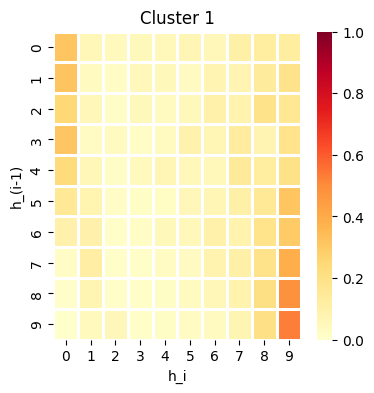

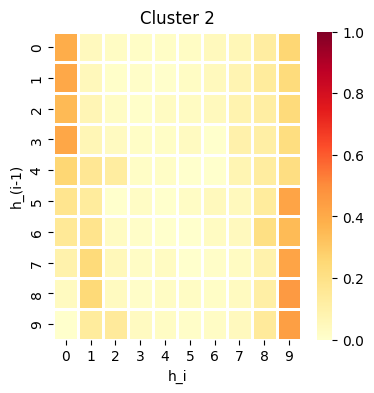

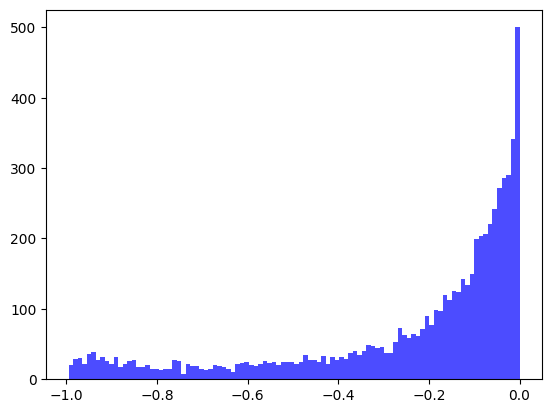

[2024-03-01T10:14:03.189112+00:00] Epochs 56, total loss: 3.15480e+04
[2024-03-01T10:14:03.190636+00:00] Training llk: -7.88275e-01


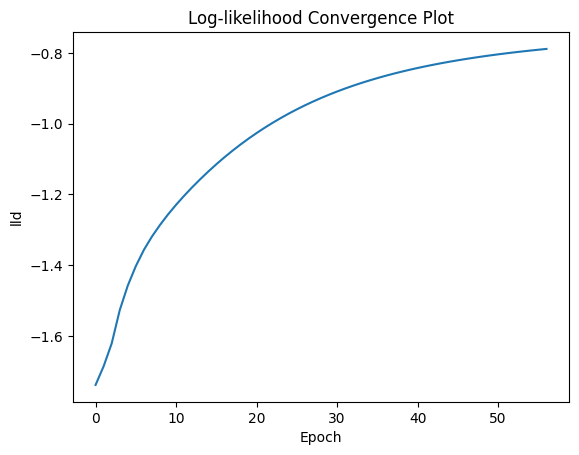

[2024-03-01T10:14:03.476373+00:00] Testing llk: -6.55994e-01
[2024-03-01T10:14:03.477155+00:00] MAE:1.09579, MRE:0.51172
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


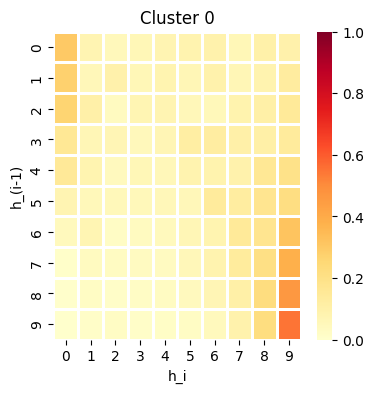

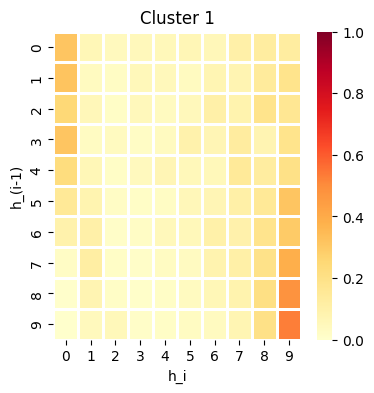

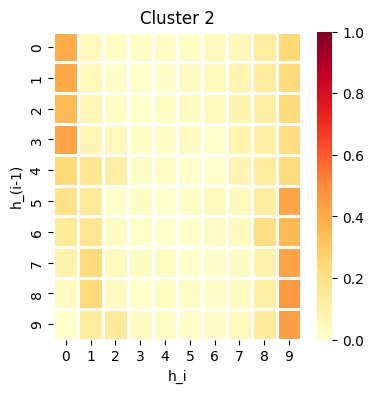

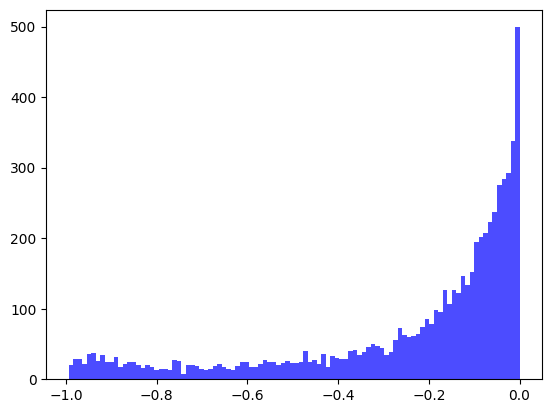

[2024-03-01T10:14:11.297562+00:00] Epochs 57, total loss: 3.14848e+04
[2024-03-01T10:14:11.297948+00:00] Training llk: -7.86125e-01


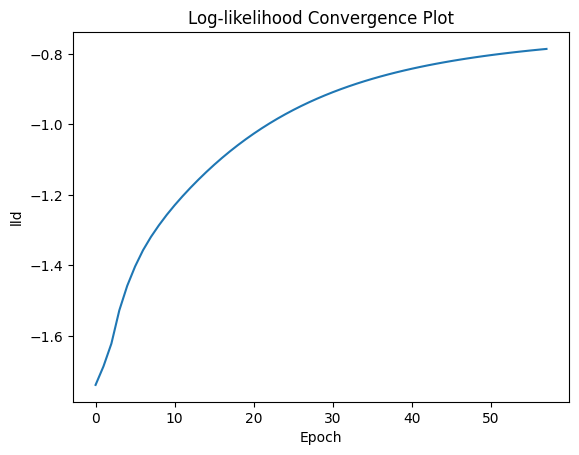

[2024-03-01T10:14:11.595458+00:00] Testing llk: -6.53880e-01
[2024-03-01T10:14:11.596607+00:00] MAE:1.09335, MRE:0.50954
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


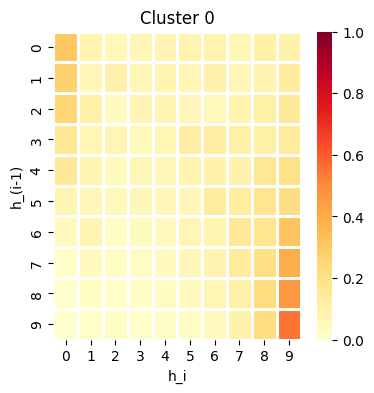

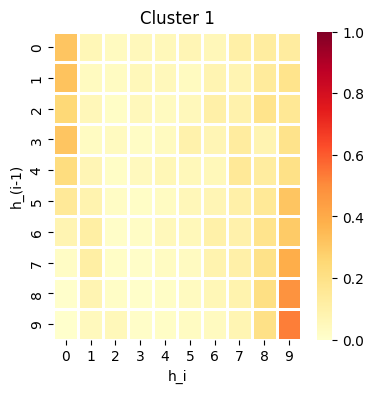

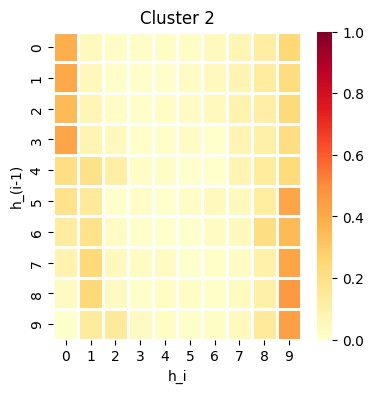

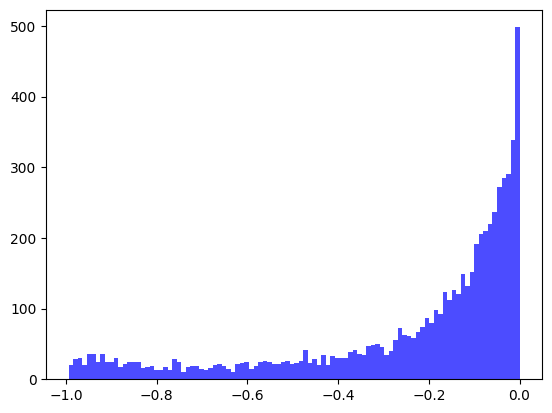

[2024-03-01T10:14:17.920646+00:00] Epochs 58, total loss: 3.14242e+04
[2024-03-01T10:14:17.922126+00:00] Training llk: -7.84075e-01


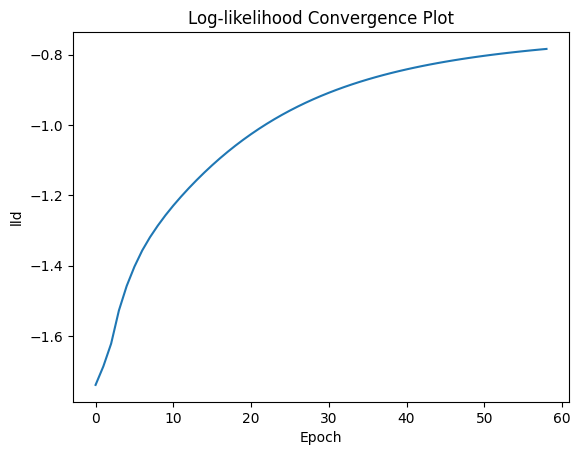

[2024-03-01T10:14:18.730634+00:00] Testing llk: -6.51877e-01
[2024-03-01T10:14:18.730859+00:00] MAE:1.09099, MRE:0.50745
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


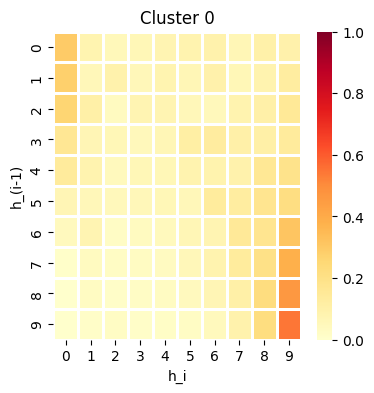

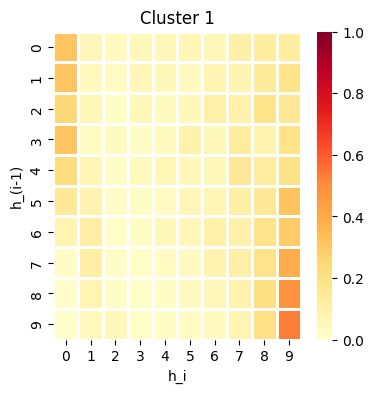

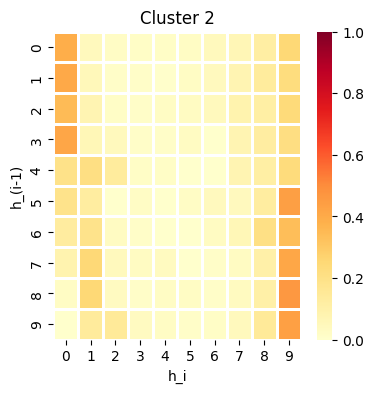

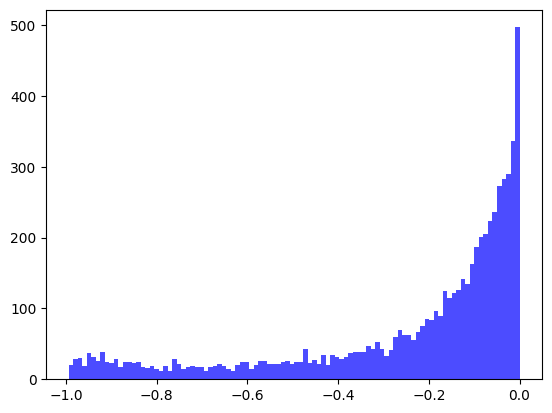

[2024-03-01T10:14:26.259575+00:00] Epochs 59, total loss: 3.13661e+04
[2024-03-01T10:14:26.260963+00:00] Training llk: -7.82118e-01


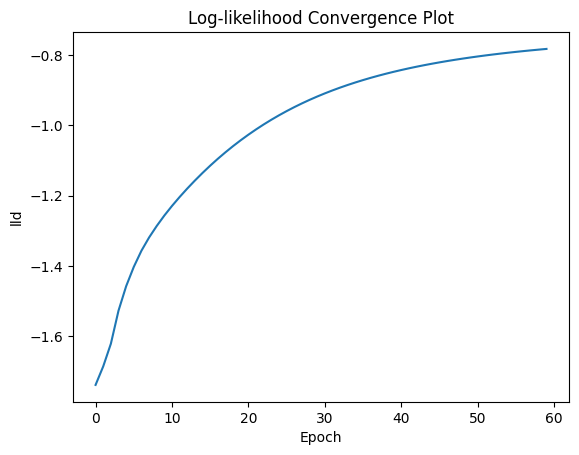

[2024-03-01T10:14:26.539704+00:00] Testing llk: -6.49978e-01
[2024-03-01T10:14:26.543974+00:00] MAE:1.08869, MRE:0.50545
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


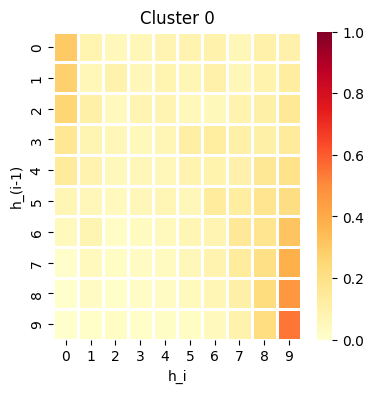

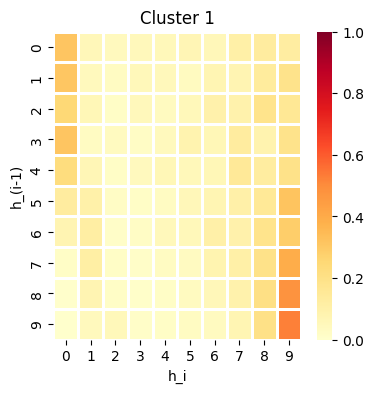

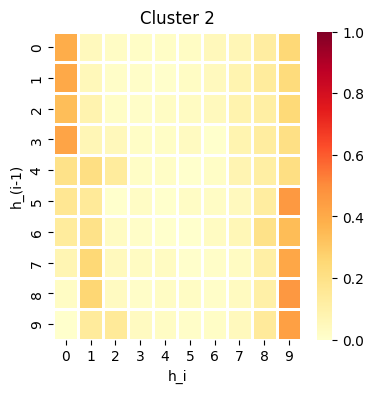

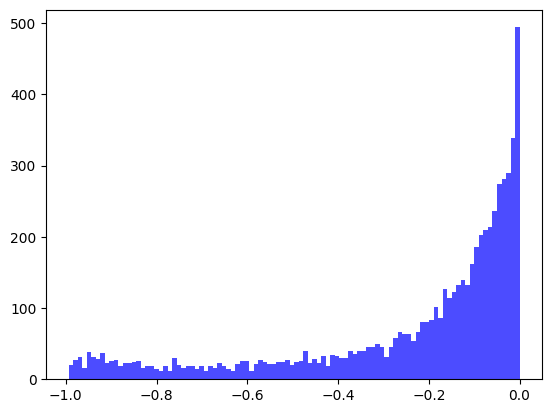

[2024-03-01T10:14:32.990043+00:00] Epochs 60, total loss: 3.13104e+04
[2024-03-01T10:14:32.991720+00:00] Training llk: -7.80249e-01


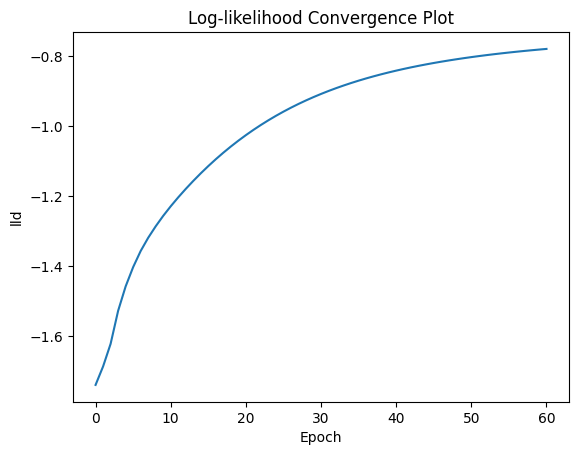

[2024-03-01T10:14:33.353596+00:00] Testing llk: -6.48177e-01
[2024-03-01T10:14:33.354747+00:00] MAE:1.08645, MRE:0.50352
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


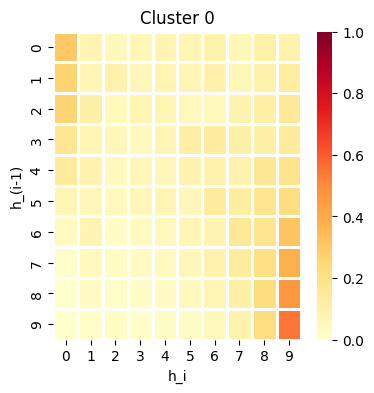

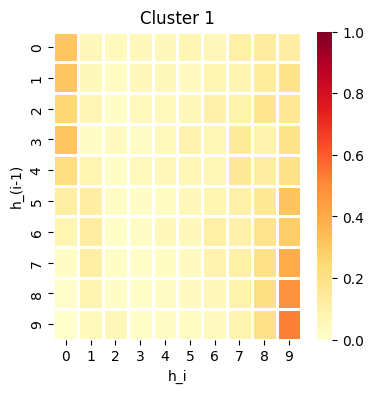

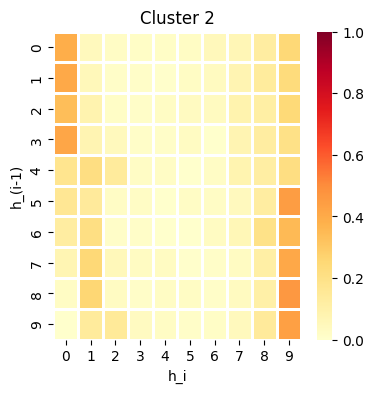

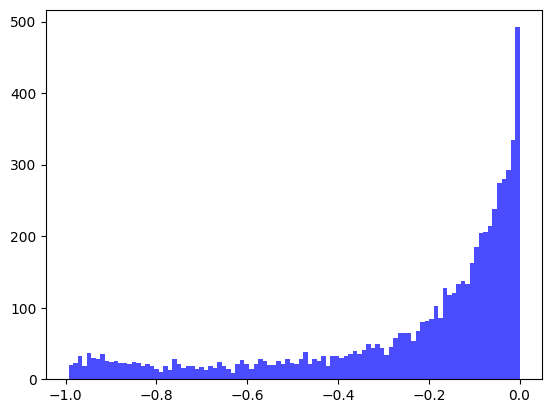

[2024-03-01T10:14:40.804778+00:00] Epochs 61, total loss: 3.12571e+04
[2024-03-01T10:14:40.806260+00:00] Training llk: -7.78465e-01


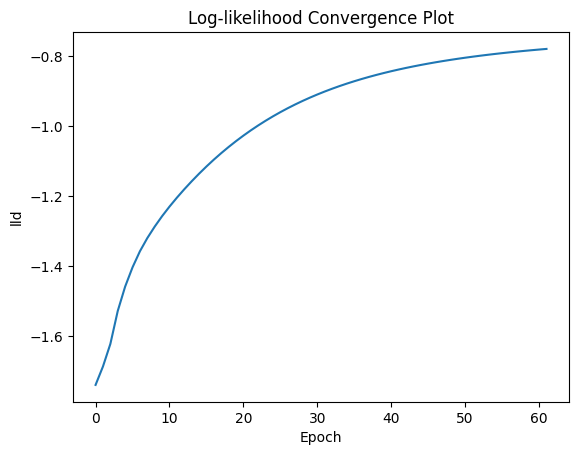

[2024-03-01T10:14:41.608805+00:00] Testing llk: -6.46470e-01
[2024-03-01T10:14:41.609955+00:00] MAE:1.08427, MRE:0.50166
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


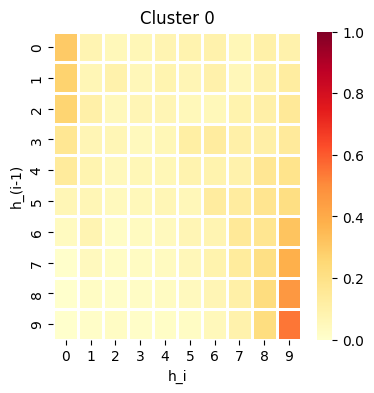

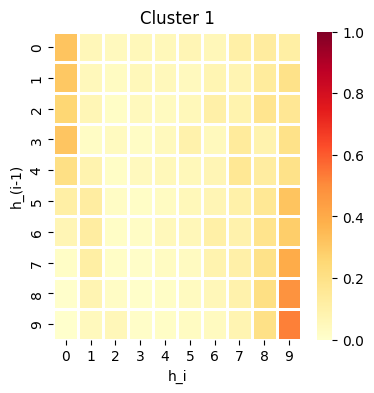

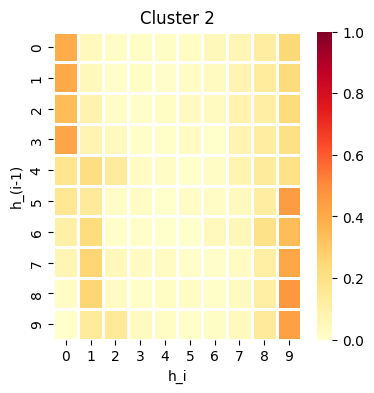

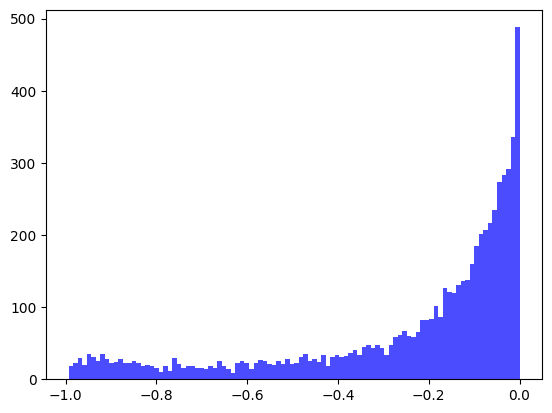

[2024-03-01T10:14:52.347046+00:00] Epochs 62, total loss: 3.12058e+04
[2024-03-01T10:14:52.347426+00:00] Training llk: -7.76760e-01


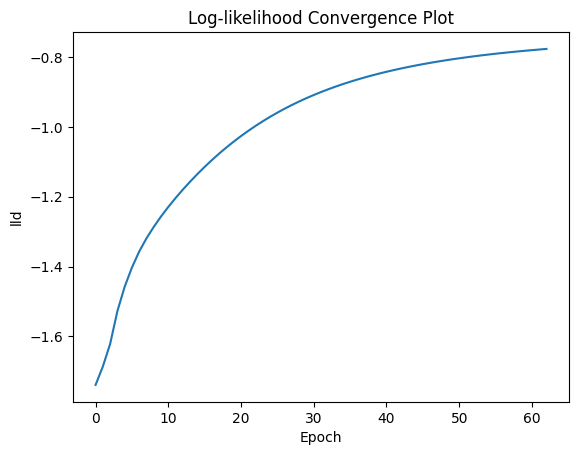

[2024-03-01T10:14:53.129747+00:00] Testing llk: -6.44850e-01
[2024-03-01T10:14:53.131365+00:00] MAE:1.08215, MRE:0.49988
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


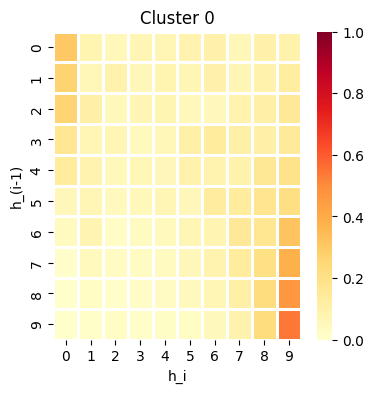

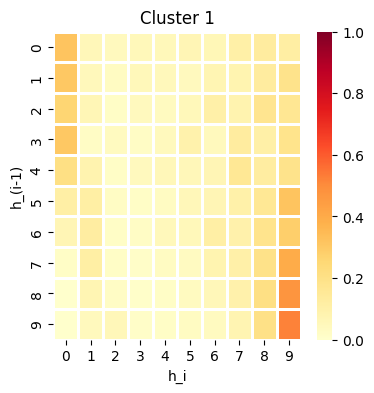

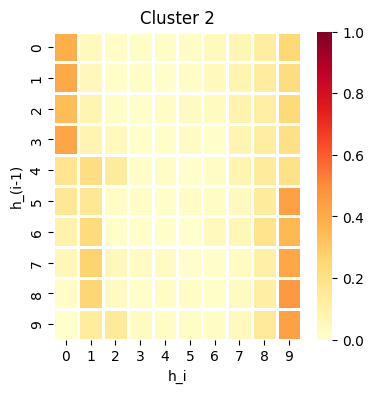

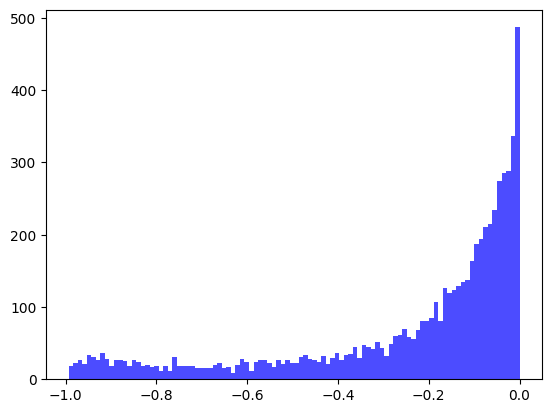

[2024-03-01T10:15:11.965437+00:00] Epochs 63, total loss: 3.11567e+04
[2024-03-01T10:15:11.965742+00:00] Training llk: -7.75130e-01


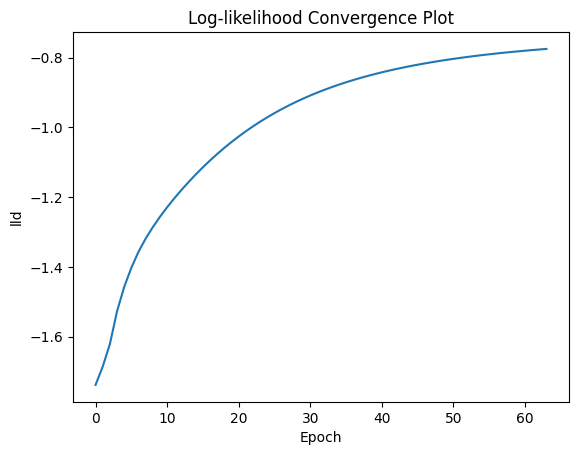

[2024-03-01T10:15:12.451074+00:00] Testing llk: -6.43312e-01
[2024-03-01T10:15:12.451259+00:00] MAE:1.08009, MRE:0.49817
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


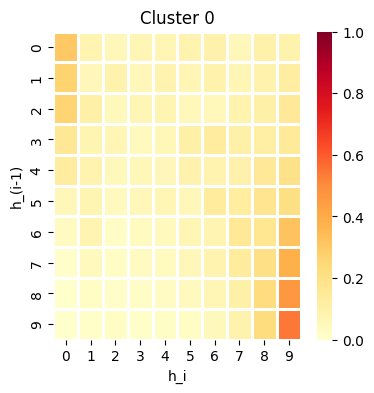

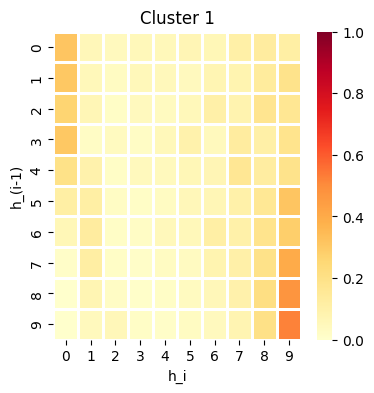

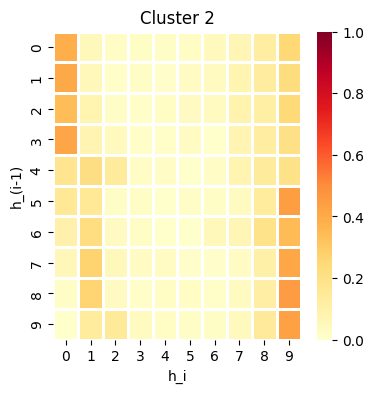

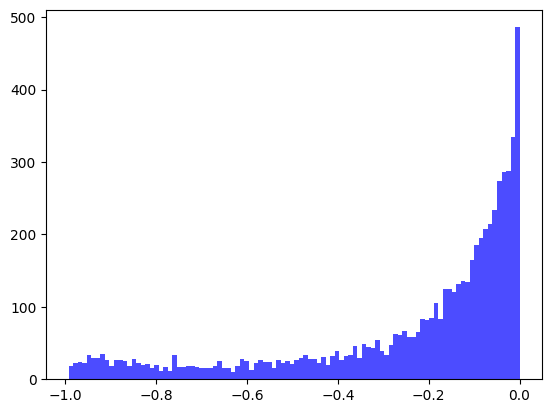

[2024-03-01T10:15:28.095371+00:00] Epochs 64, total loss: 3.11095e+04
[2024-03-01T10:15:28.099492+00:00] Training llk: -7.73572e-01


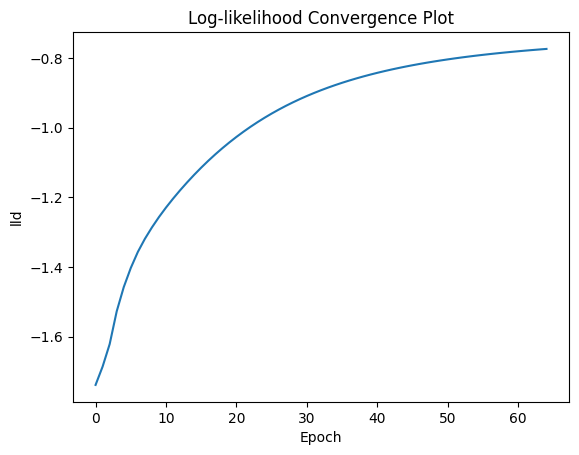

[2024-03-01T10:15:28.900477+00:00] Testing llk: -6.41853e-01
[2024-03-01T10:15:28.901497+00:00] MAE:1.07809, MRE:0.49653
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


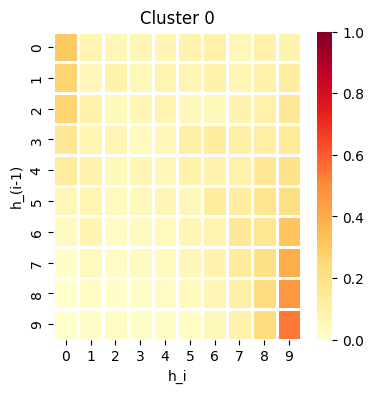

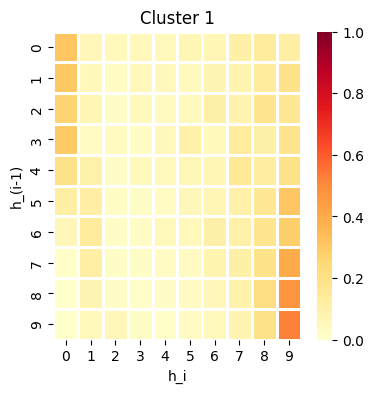

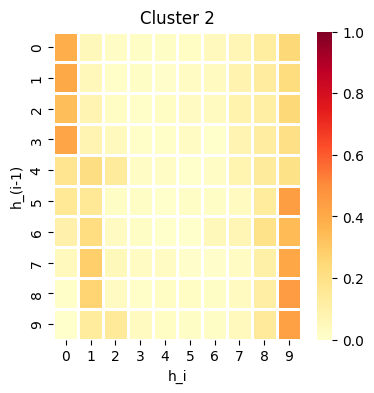

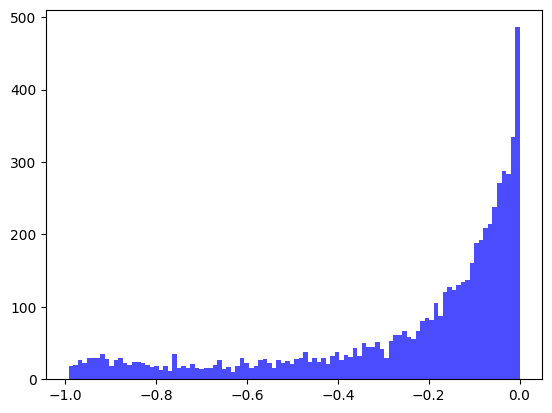

[2024-03-01T10:15:41.125794+00:00] Epochs 65, total loss: 3.10641e+04
[2024-03-01T10:15:41.127067+00:00] Training llk: -7.72082e-01


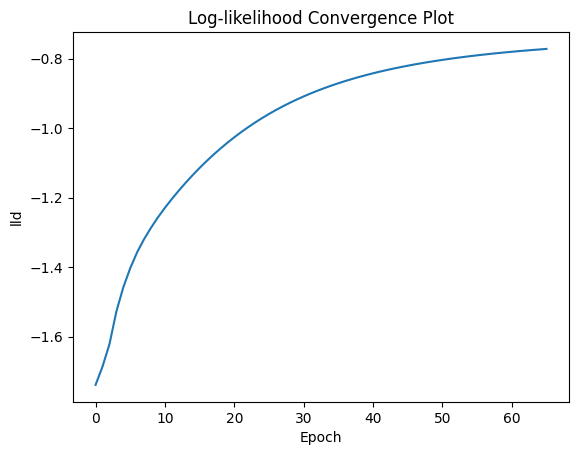

[2024-03-01T10:15:42.106883+00:00] Testing llk: -6.40468e-01
[2024-03-01T10:15:42.107030+00:00] MAE:1.07615, MRE:0.49495
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


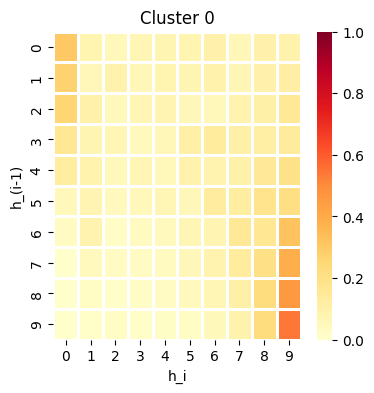

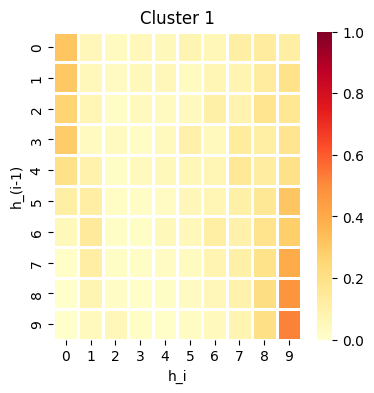

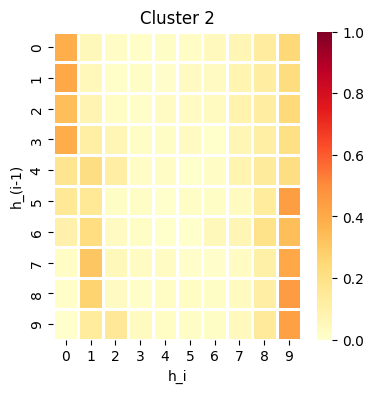

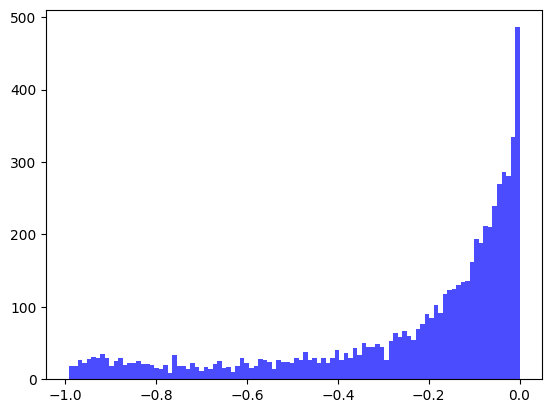

[2024-03-01T10:15:51.222565+00:00] Epochs 66, total loss: 3.10206e+04
[2024-03-01T10:15:51.222859+00:00] Training llk: -7.70656e-01


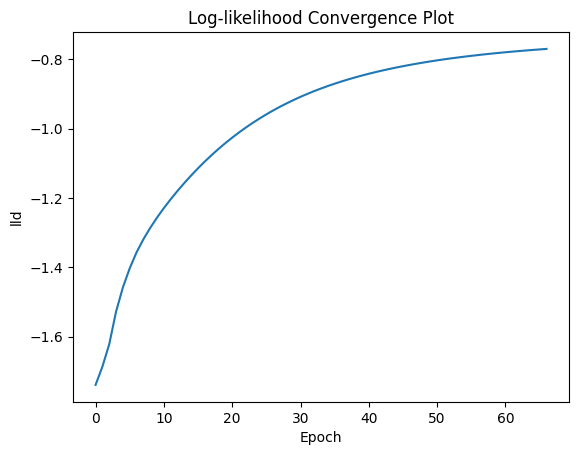

[2024-03-01T10:15:51.470705+00:00] Testing llk: -6.39152e-01
[2024-03-01T10:15:51.471601+00:00] MAE:1.07425, MRE:0.49343
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


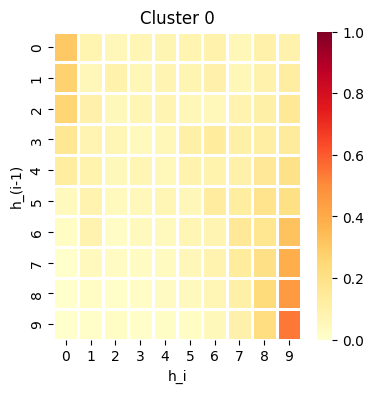

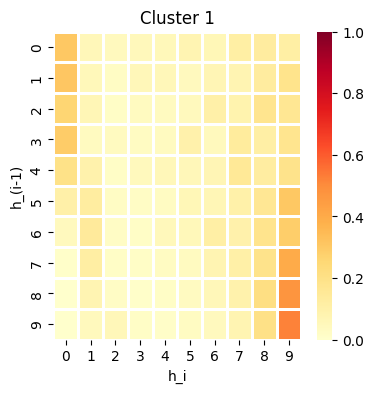

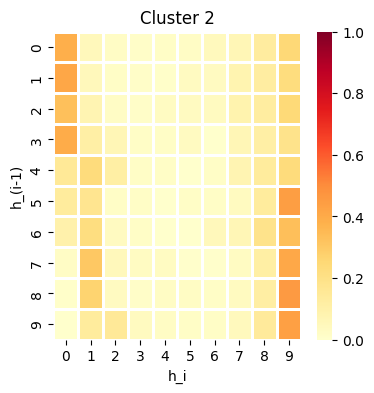

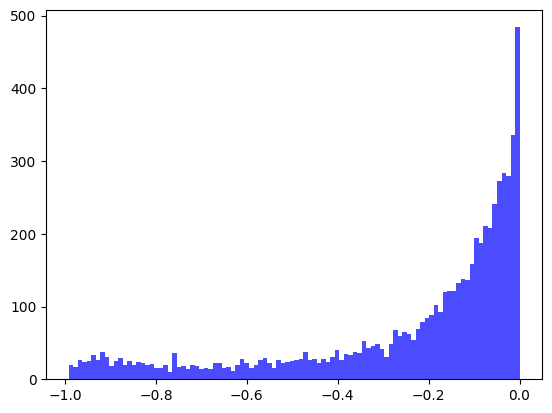

[2024-03-01T10:15:58.650568+00:00] Epochs 67, total loss: 3.09787e+04
[2024-03-01T10:15:58.650846+00:00] Training llk: -7.69290e-01


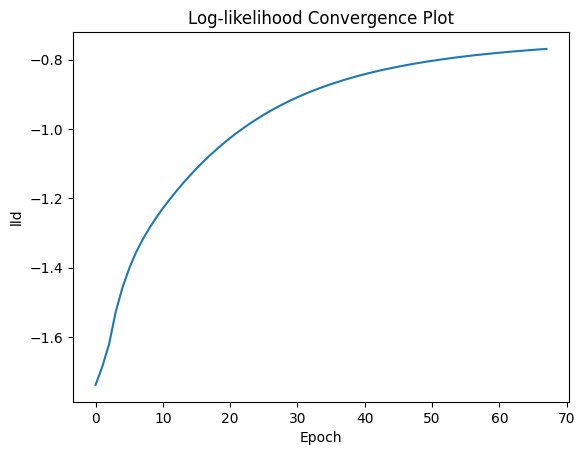

[2024-03-01T10:15:58.919200+00:00] Testing llk: -6.37903e-01
[2024-03-01T10:15:58.922676+00:00] MAE:1.07240, MRE:0.49196
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


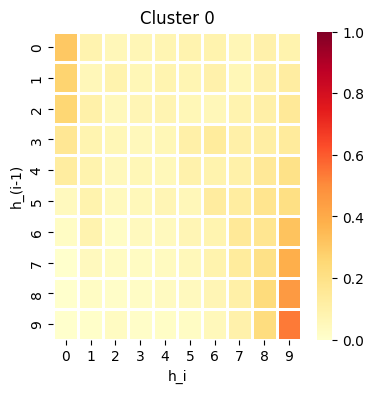

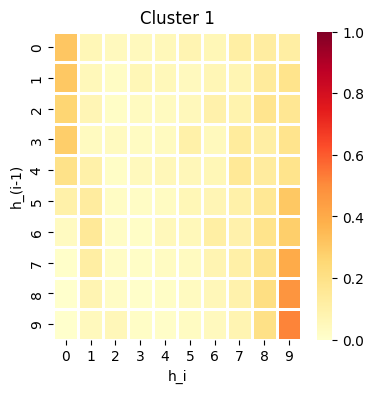

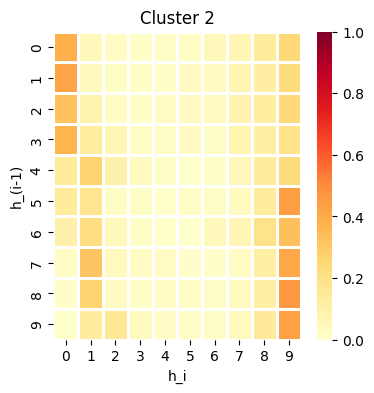

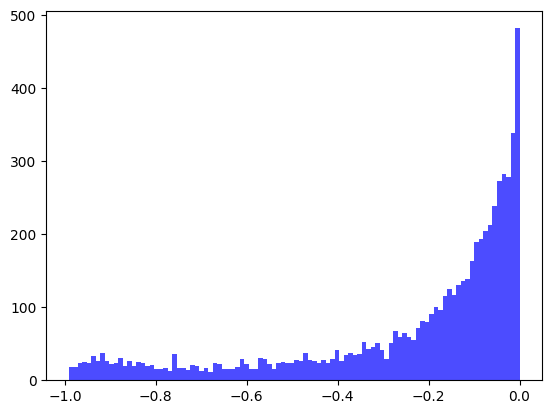

[2024-03-01T10:16:04.700533+00:00] Epochs 68, total loss: 3.09385e+04
[2024-03-01T10:16:04.700811+00:00] Training llk: -7.67983e-01


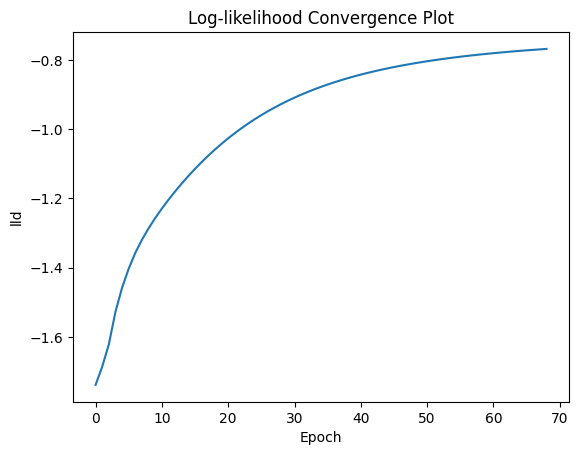

[2024-03-01T10:16:04.945861+00:00] Testing llk: -6.36716e-01
[2024-03-01T10:16:04.946831+00:00] MAE:1.07061, MRE:0.49055
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


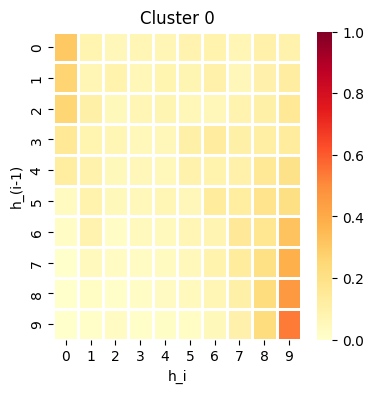

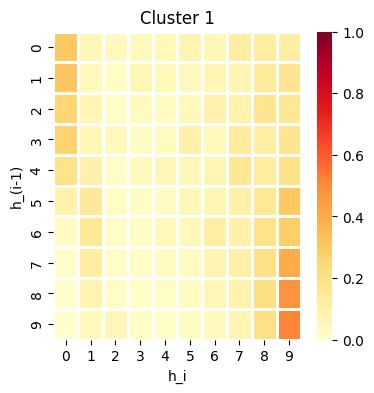

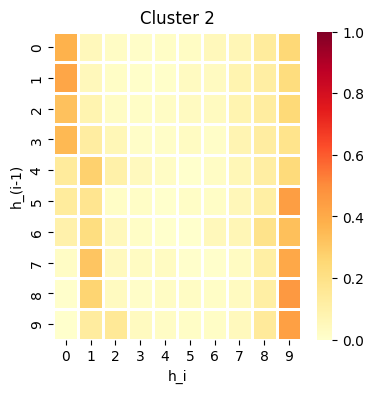

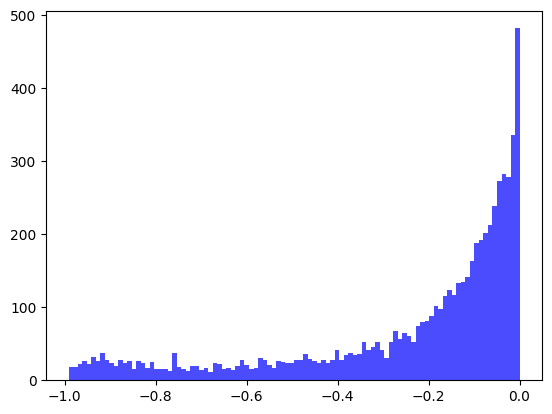

[2024-03-01T10:16:11.816221+00:00] Epochs 69, total loss: 3.08998e+04
[2024-03-01T10:16:11.816523+00:00] Training llk: -7.66731e-01


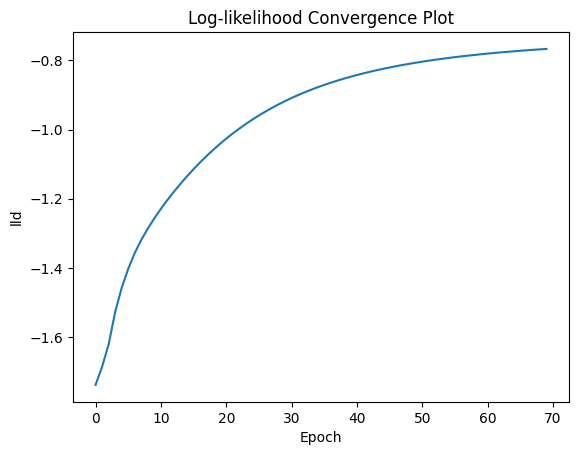

[2024-03-01T10:16:12.074878+00:00] Testing llk: -6.35588e-01
[2024-03-01T10:16:12.075798+00:00] MAE:1.06886, MRE:0.48920
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


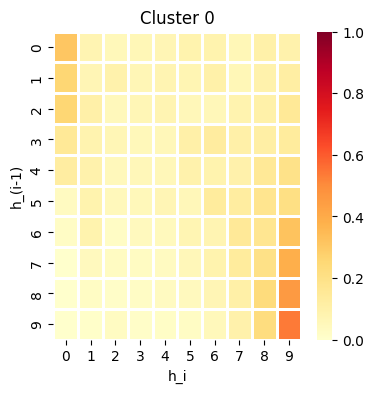

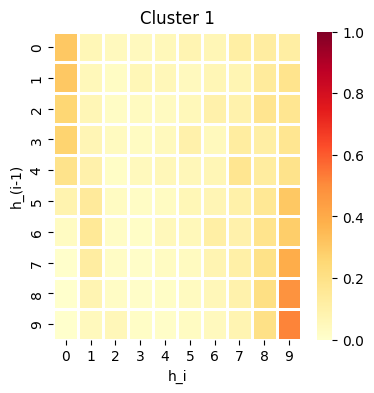

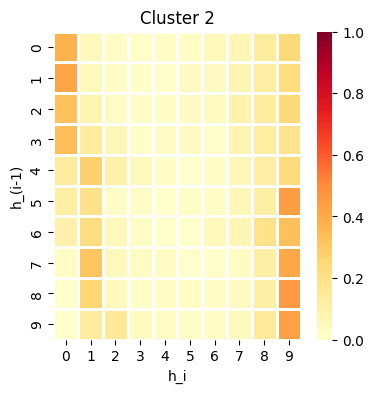

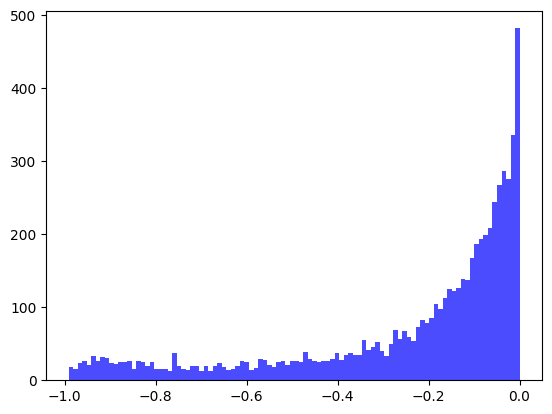

[2024-03-01T10:16:17.764550+00:00] Epochs 70, total loss: 3.08625e+04
[2024-03-01T10:16:17.765772+00:00] Training llk: -7.65531e-01


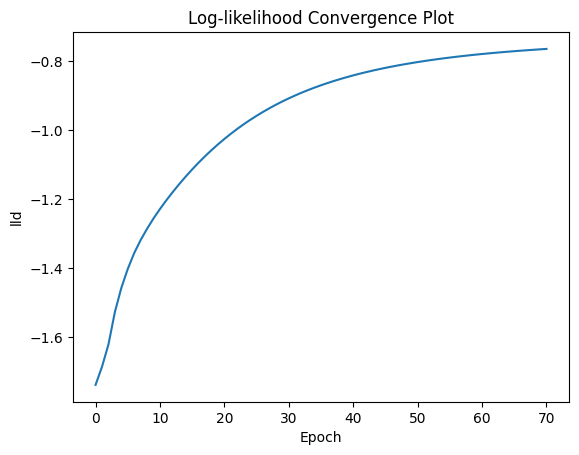

[2024-03-01T10:16:18.037199+00:00] Testing llk: -6.34515e-01
[2024-03-01T10:16:18.037385+00:00] MAE:1.06716, MRE:0.48790
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


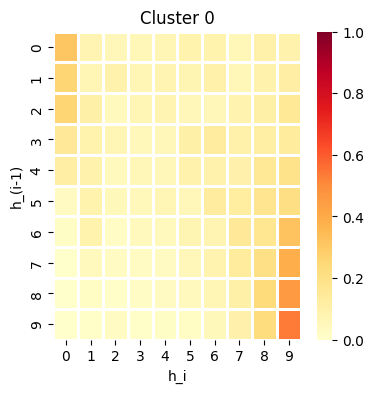

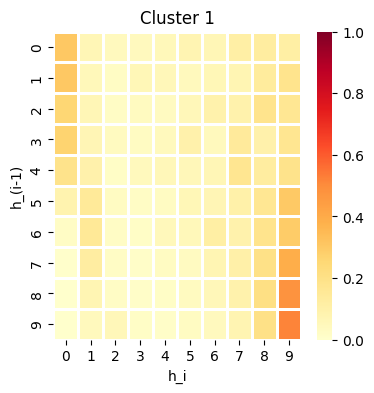

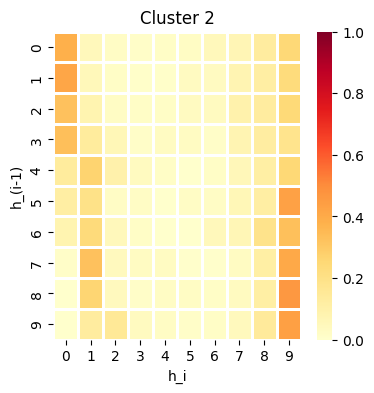

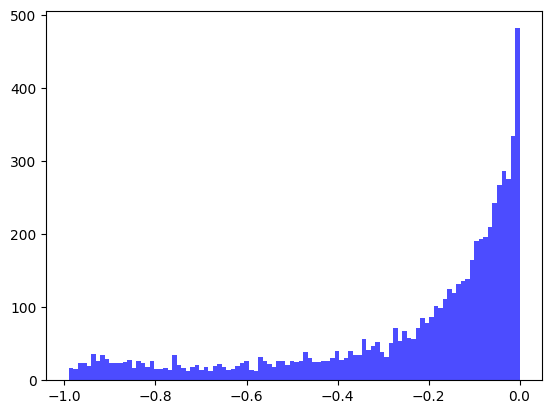

[2024-03-01T10:16:25.279056+00:00] Epochs 71, total loss: 3.08267e+04
[2024-03-01T10:16:25.280526+00:00] Training llk: -7.64381e-01


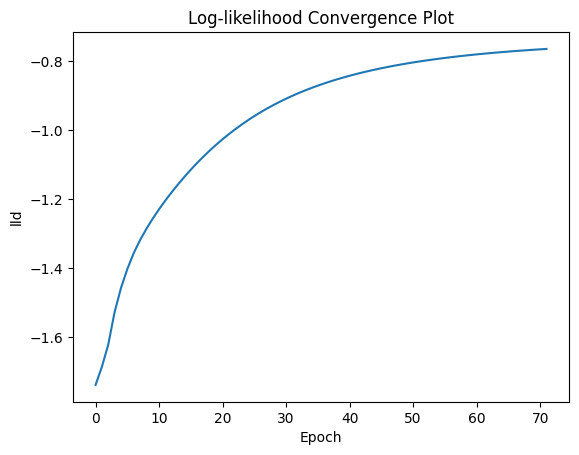

[2024-03-01T10:16:25.556323+00:00] Testing llk: -6.33496e-01
[2024-03-01T10:16:25.557292+00:00] MAE:1.06551, MRE:0.48665
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


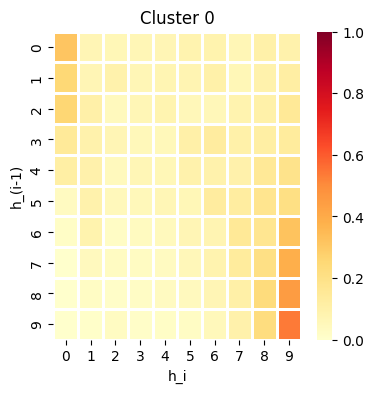

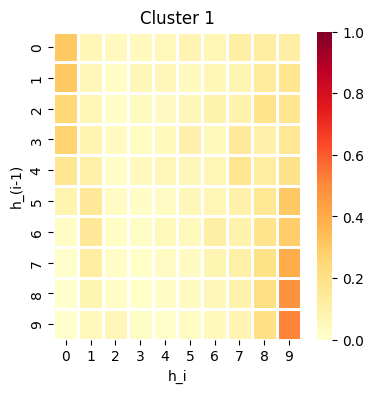

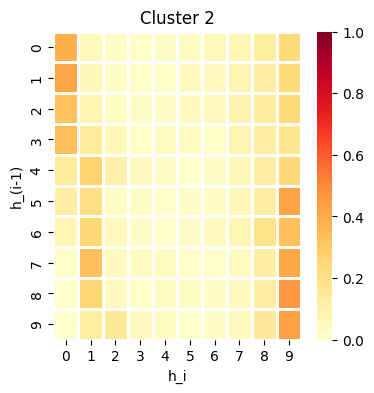

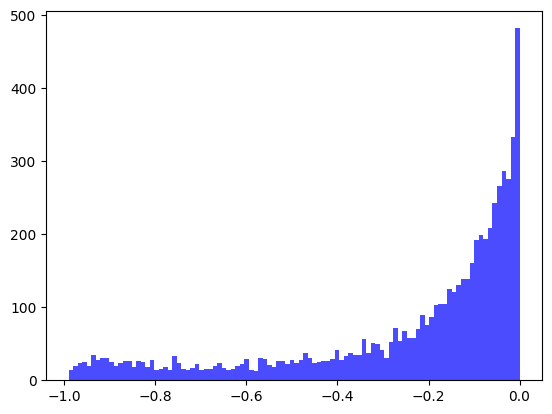

[2024-03-01T10:16:31.291711+00:00] Epochs 72, total loss: 3.07922e+04
[2024-03-01T10:16:31.292002+00:00] Training llk: -7.63278e-01


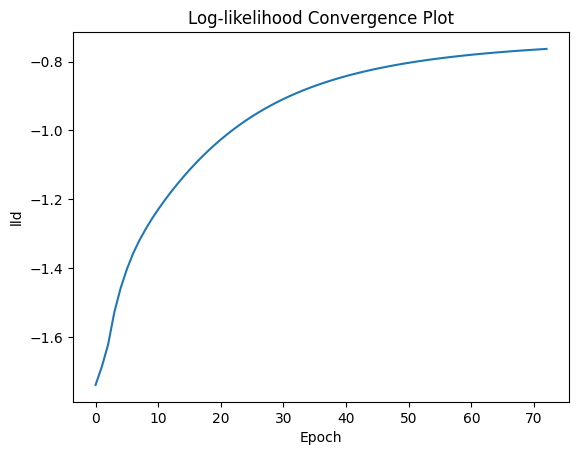

[2024-03-01T10:16:31.599373+00:00] Testing llk: -6.32527e-01
[2024-03-01T10:16:31.599570+00:00] MAE:1.06389, MRE:0.48545
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


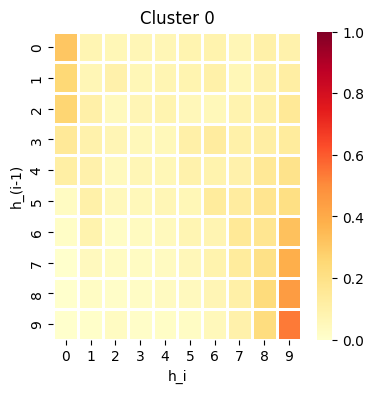

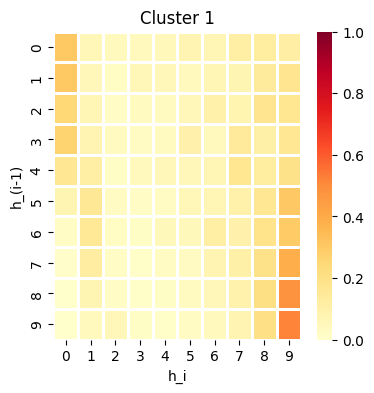

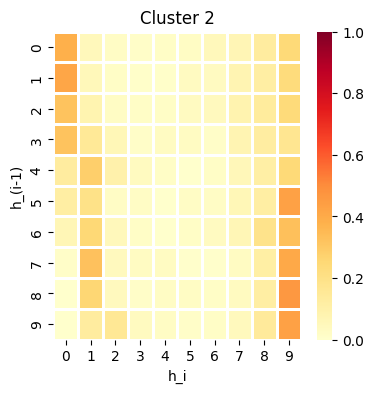

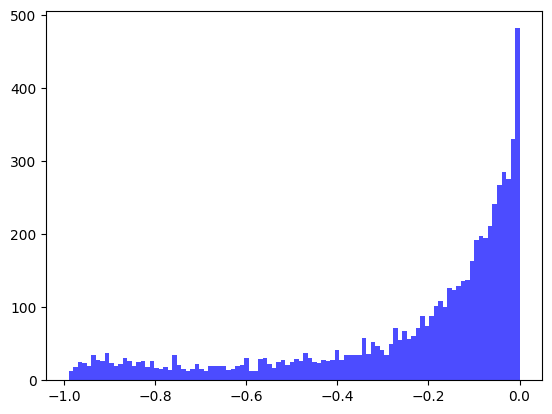

[2024-03-01T10:16:38.383256+00:00] Epochs 73, total loss: 3.07589e+04
[2024-03-01T10:16:38.384476+00:00] Training llk: -7.62220e-01


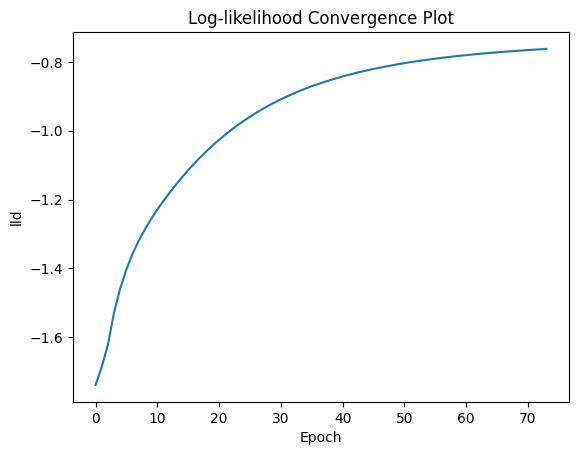

[2024-03-01T10:16:38.955284+00:00] Testing llk: -6.31605e-01
[2024-03-01T10:16:38.955446+00:00] MAE:1.06232, MRE:0.48429
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


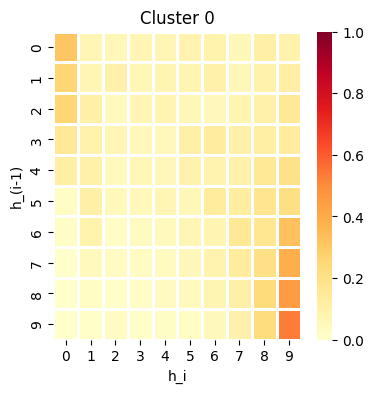

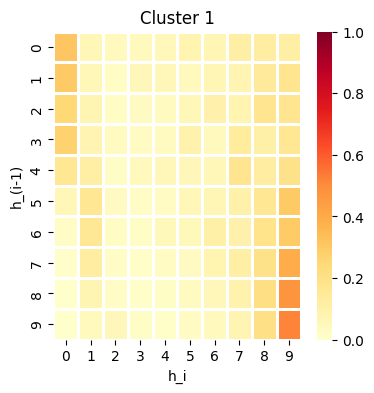

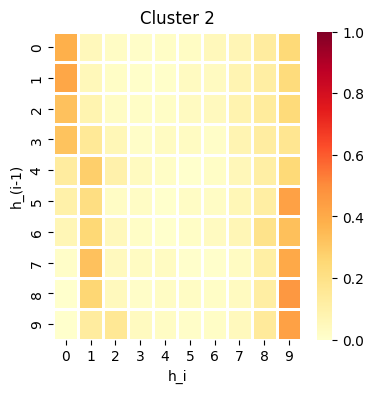

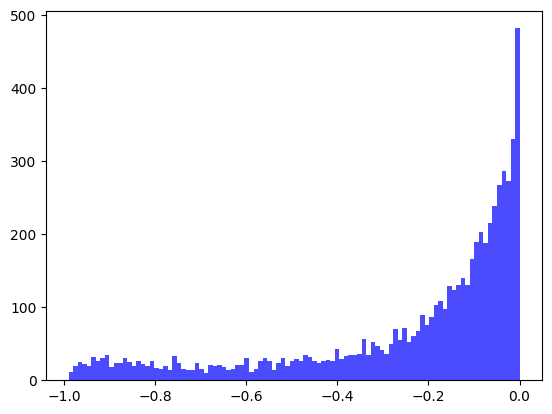

[2024-03-01T10:16:44.747032+00:00] Epochs 74, total loss: 3.07269e+04
[2024-03-01T10:16:44.747318+00:00] Training llk: -7.61205e-01


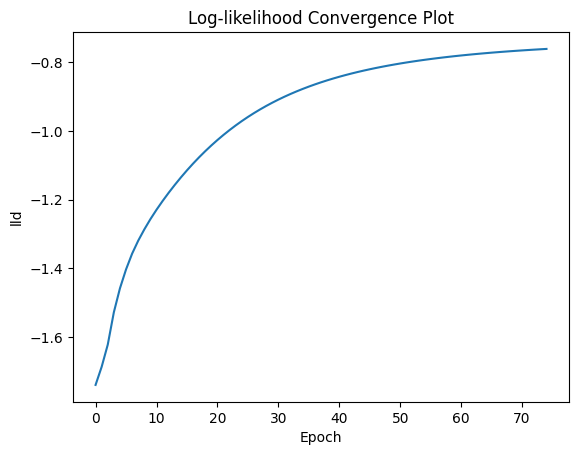

[2024-03-01T10:16:45.013235+00:00] Testing llk: -6.30728e-01
[2024-03-01T10:16:45.014099+00:00] MAE:1.06079, MRE:0.48316
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


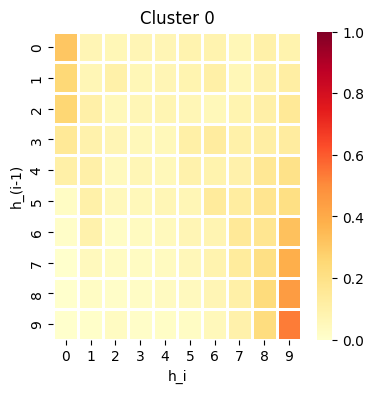

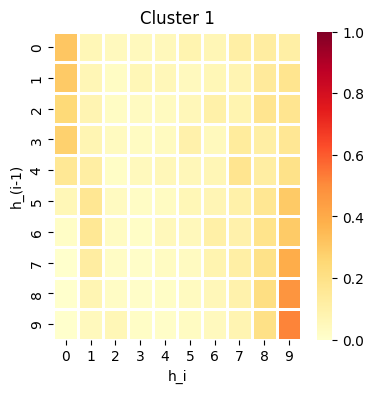

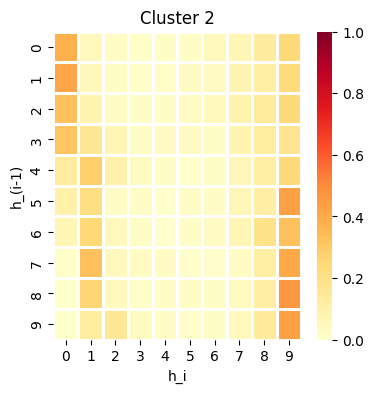

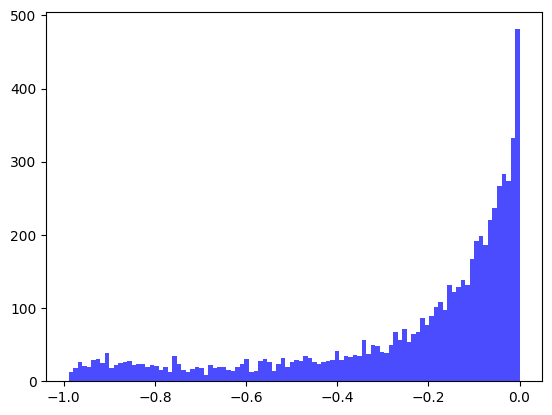

[2024-03-01T10:16:51.857718+00:00] Epochs 75, total loss: 3.06961e+04
[2024-03-01T10:16:51.858926+00:00] Training llk: -7.60230e-01


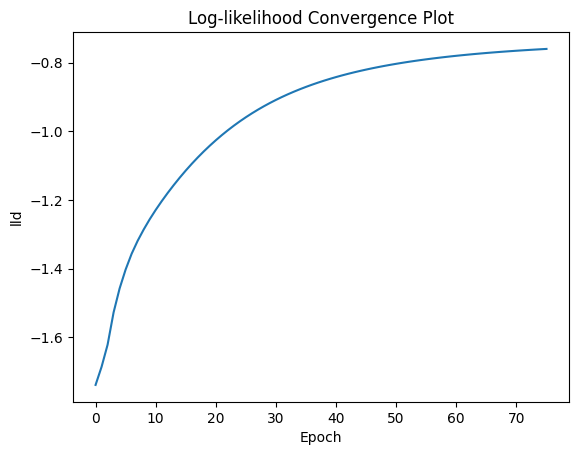

[2024-03-01T10:16:52.141157+00:00] Testing llk: -6.29893e-01
[2024-03-01T10:16:52.145073+00:00] MAE:1.05930, MRE:0.48208
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


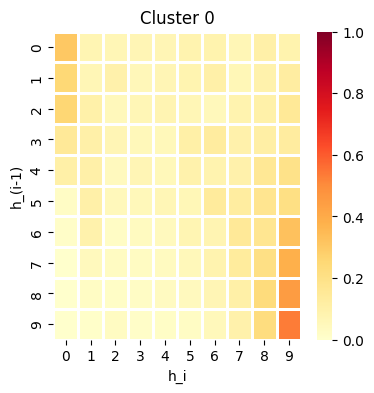

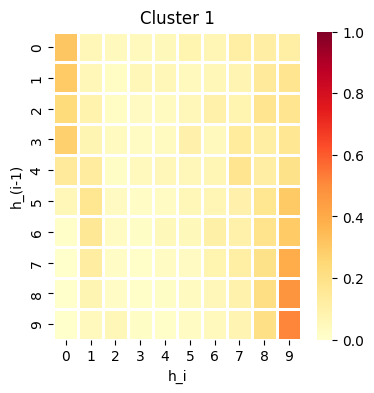

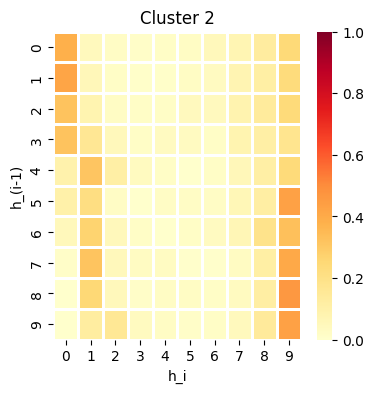

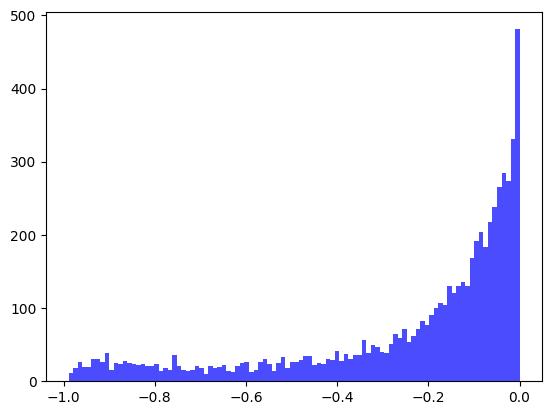

[2024-03-01T10:16:58.222453+00:00] Epochs 76, total loss: 3.06664e+04
[2024-03-01T10:16:58.223702+00:00] Training llk: -7.59294e-01


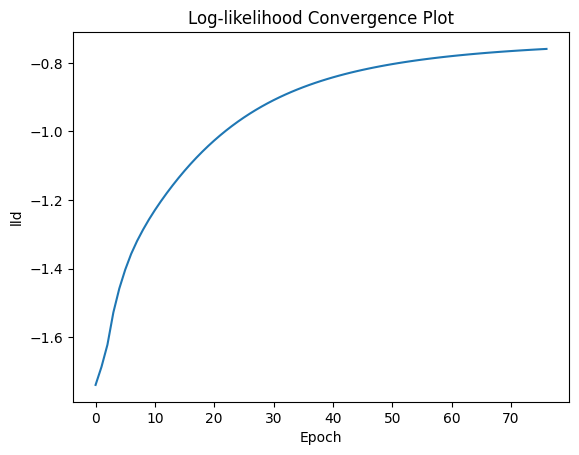

[2024-03-01T10:16:58.466139+00:00] Testing llk: -6.29099e-01
[2024-03-01T10:16:58.467103+00:00] MAE:1.05784, MRE:0.48103
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


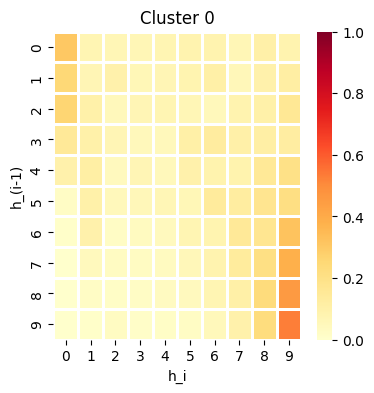

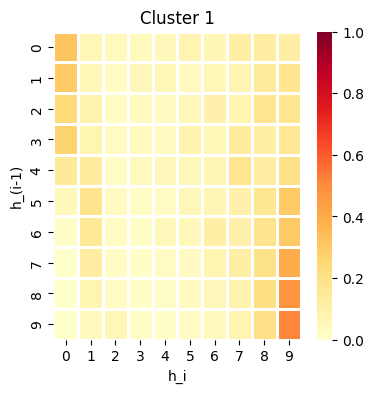

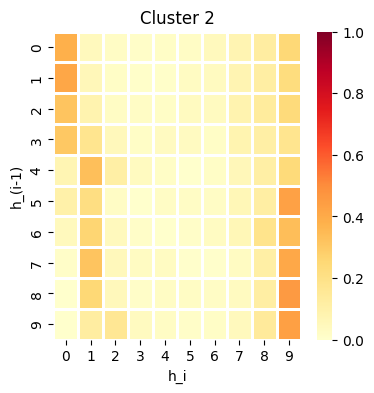

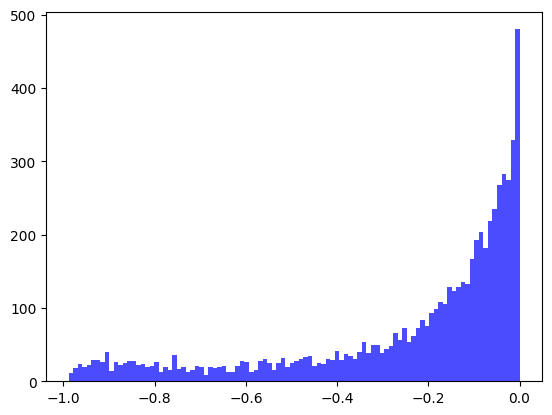

[2024-03-01T10:17:05.385009+00:00] Epochs 77, total loss: 3.06377e+04
[2024-03-01T10:17:05.386185+00:00] Training llk: -7.58395e-01


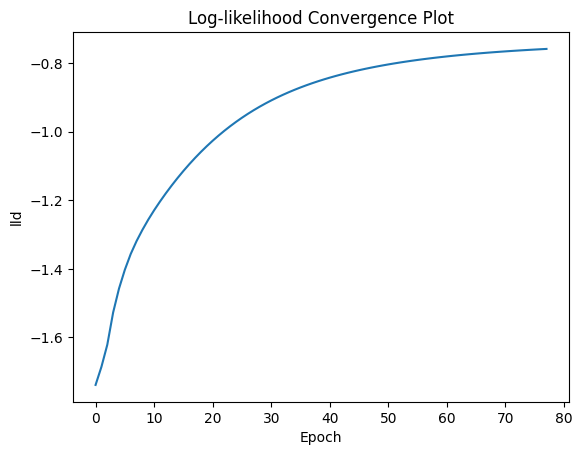

[2024-03-01T10:17:05.631950+00:00] Testing llk: -6.28343e-01
[2024-03-01T10:17:05.635565+00:00] MAE:1.05642, MRE:0.48002
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


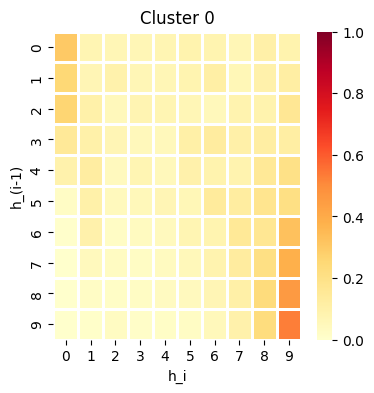

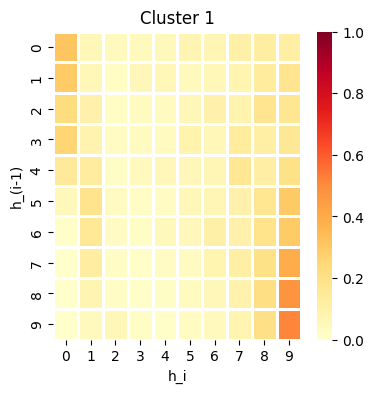

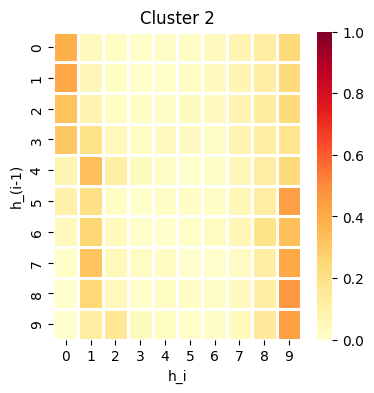

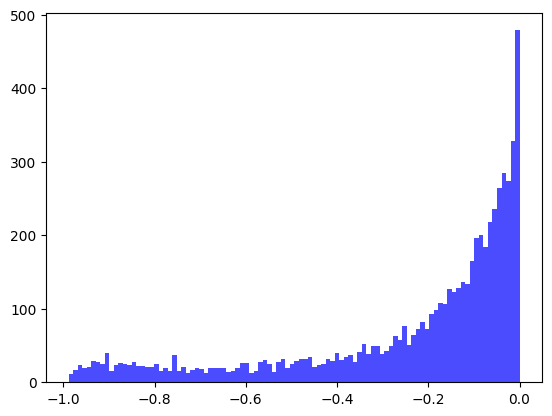

[2024-03-01T10:17:11.984196+00:00] Epochs 78, total loss: 3.06101e+04
[2024-03-01T10:17:11.985328+00:00] Training llk: -7.57532e-01


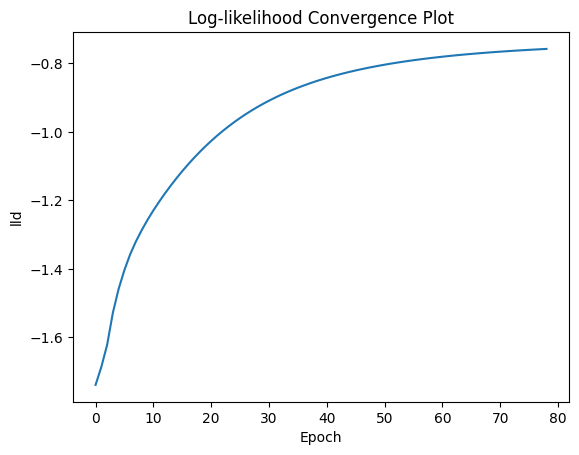

[2024-03-01T10:17:12.275428+00:00] Testing llk: -6.27624e-01
[2024-03-01T10:17:12.276529+00:00] MAE:1.05503, MRE:0.47905
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


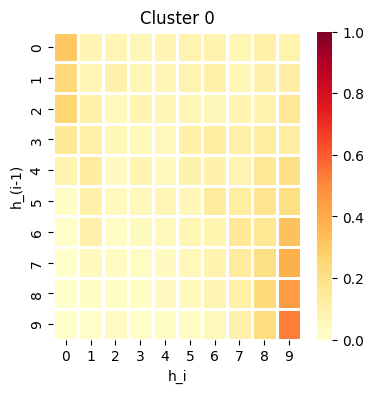

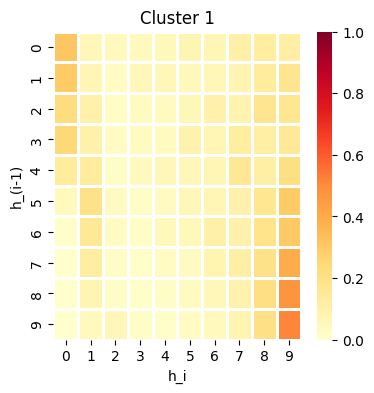

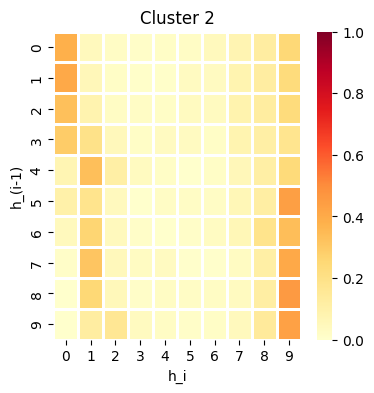

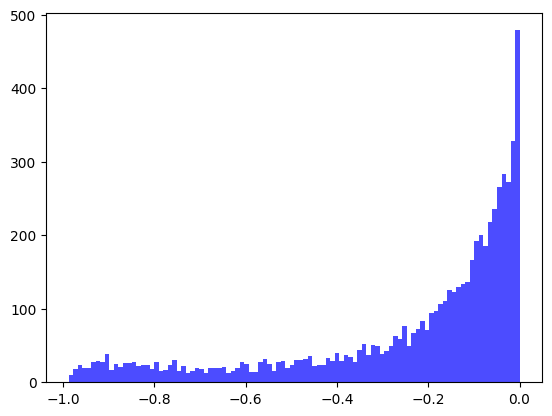

[2024-03-01T10:17:19.553434+00:00] Epochs 79, total loss: 3.05834e+04
[2024-03-01T10:17:19.553723+00:00] Training llk: -7.56701e-01


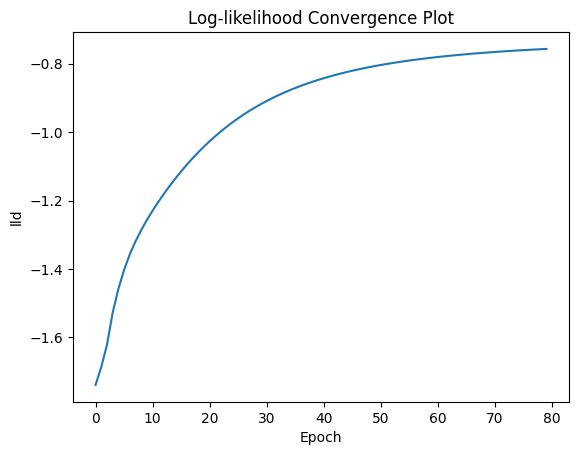

[2024-03-01T10:17:19.855144+00:00] Testing llk: -6.26938e-01
[2024-03-01T10:17:19.856049+00:00] MAE:1.05368, MRE:0.47810
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


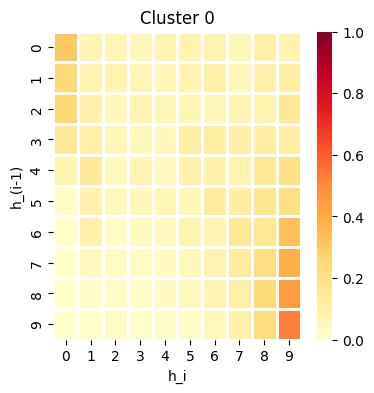

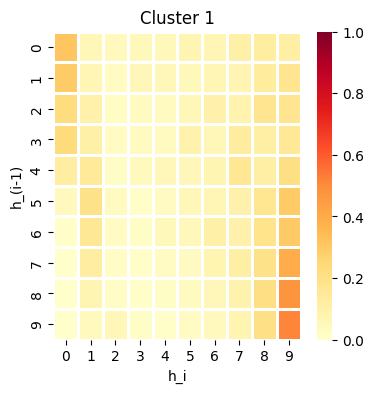

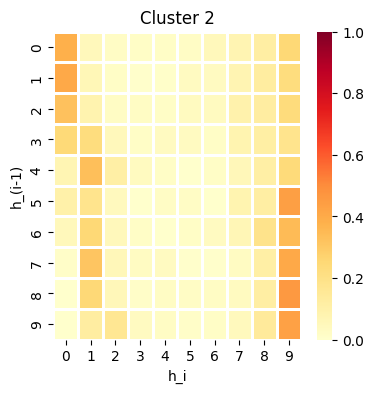

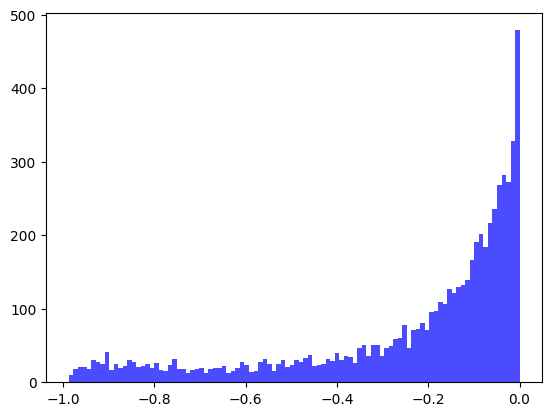

[2024-03-01T10:17:25.739520+00:00] Epochs 80, total loss: 3.05577e+04
[2024-03-01T10:17:25.740684+00:00] Training llk: -7.55903e-01


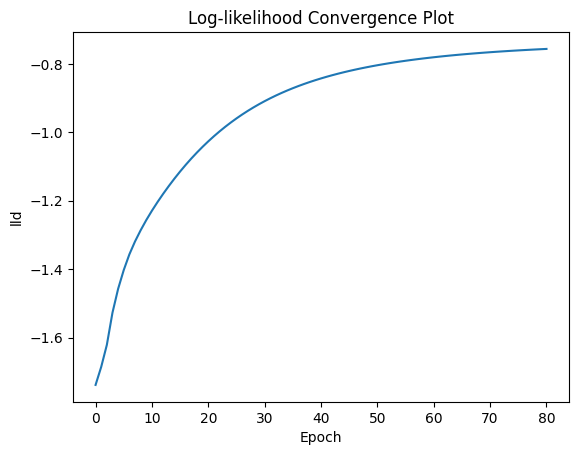

[2024-03-01T10:17:26.035373+00:00] Testing llk: -6.26286e-01
[2024-03-01T10:17:26.036273+00:00] MAE:1.05236, MRE:0.47719
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


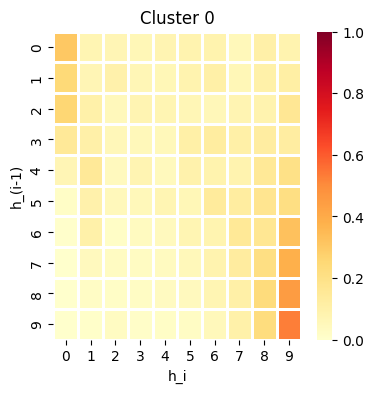

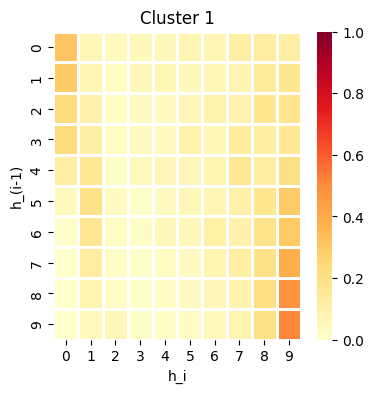

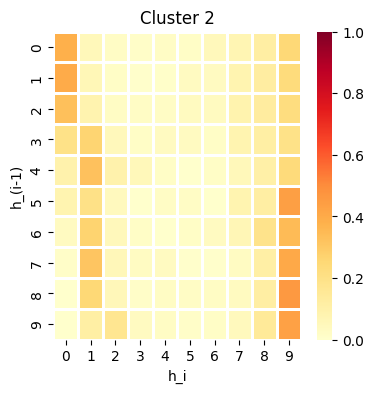

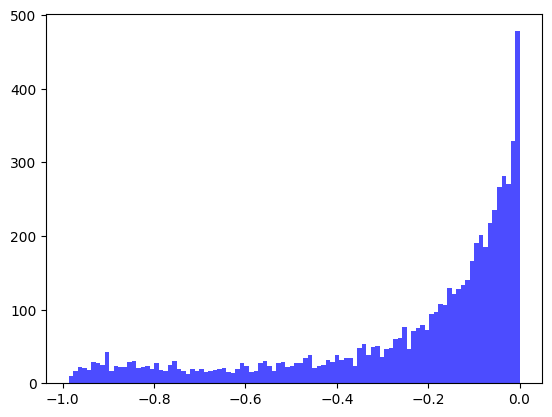

[2024-03-01T10:17:33.003089+00:00] Epochs 81, total loss: 3.05329e+04
[2024-03-01T10:17:33.004363+00:00] Training llk: -7.55135e-01


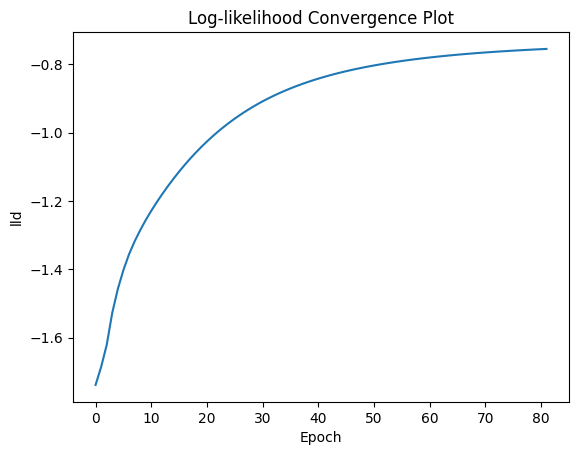

[2024-03-01T10:17:33.306037+00:00] Testing llk: -6.25664e-01
[2024-03-01T10:17:33.306207+00:00] MAE:1.05107, MRE:0.47630
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


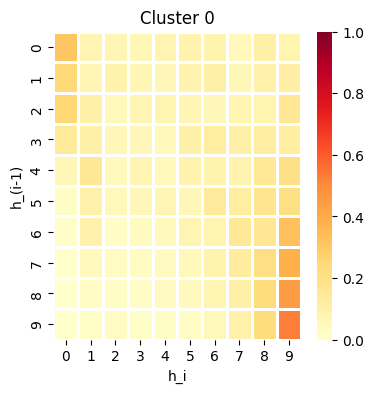

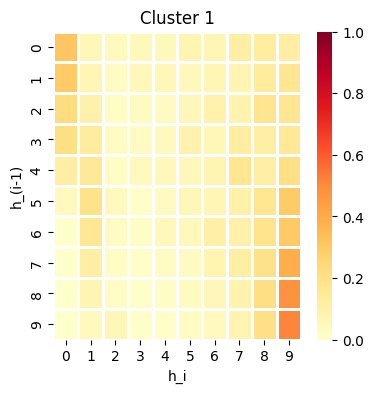

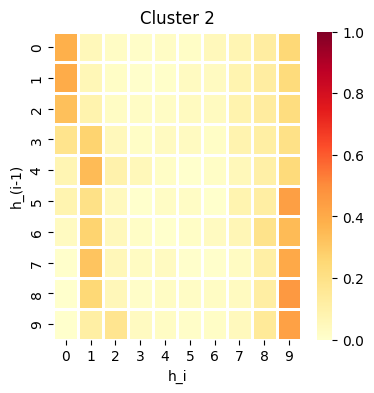

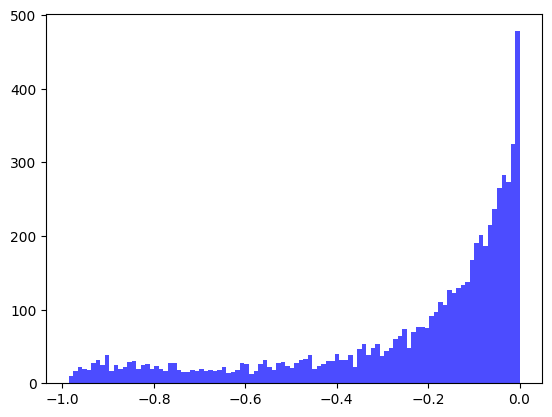

[2024-03-01T10:17:39.440942+00:00] Epochs 82, total loss: 3.05089e+04
[2024-03-01T10:17:39.441226+00:00] Training llk: -7.54396e-01


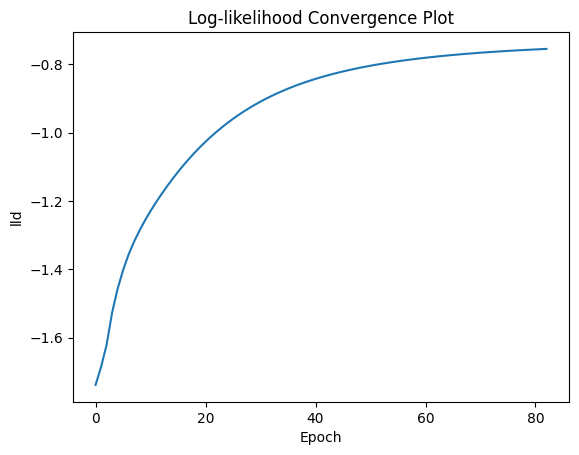

[2024-03-01T10:17:39.721990+00:00] Testing llk: -6.25071e-01
[2024-03-01T10:17:39.723086+00:00] MAE:1.04981, MRE:0.47544
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


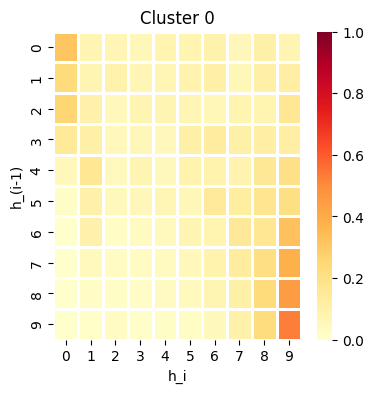

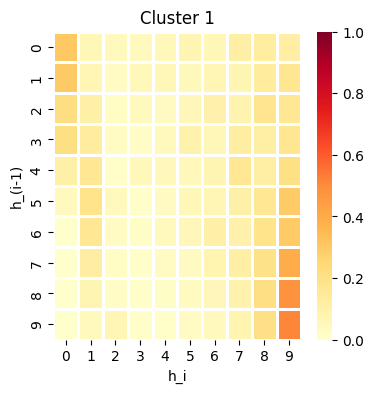

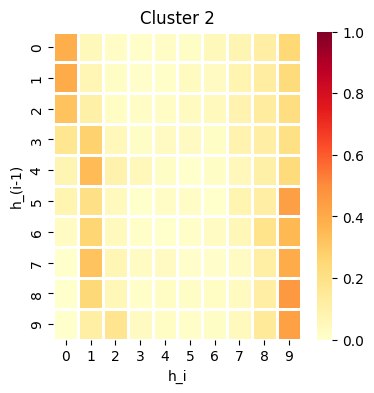

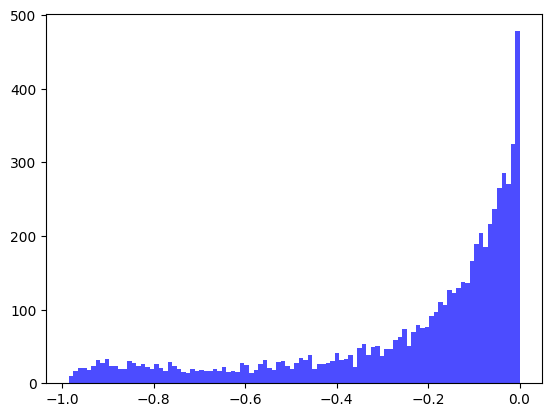

[2024-03-01T10:17:46.793432+00:00] Epochs 83, total loss: 3.04858e+04
[2024-03-01T10:17:46.794677+00:00] Training llk: -7.53685e-01


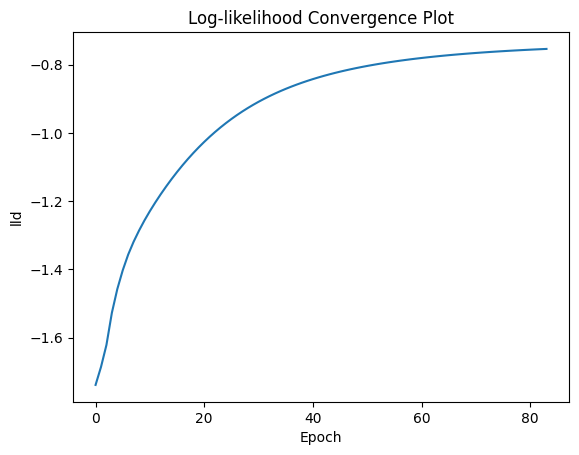

[2024-03-01T10:17:47.089187+00:00] Testing llk: -6.24507e-01
[2024-03-01T10:17:47.090585+00:00] MAE:1.04858, MRE:0.47461
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


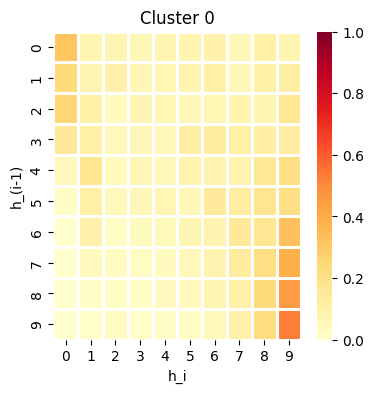

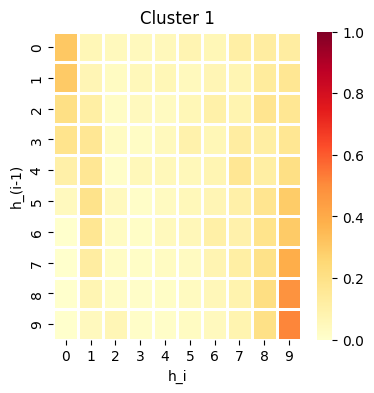

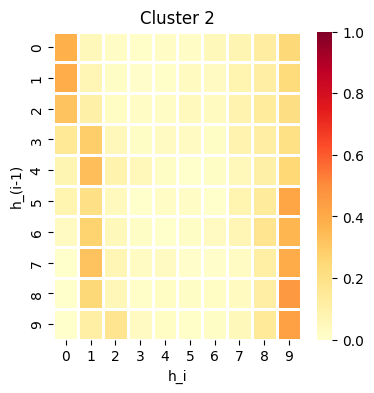

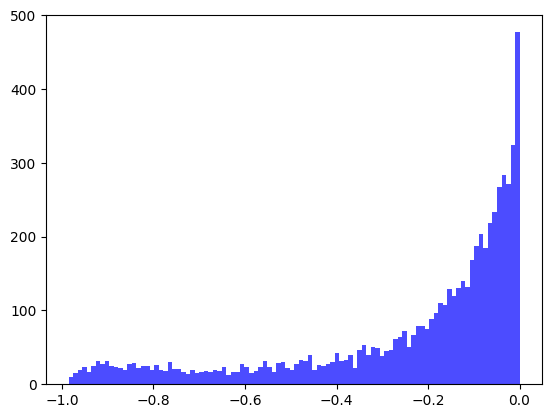

[2024-03-01T10:17:53.074631+00:00] Epochs 84, total loss: 3.04634e+04
[2024-03-01T10:17:53.075867+00:00] Training llk: -7.53000e-01


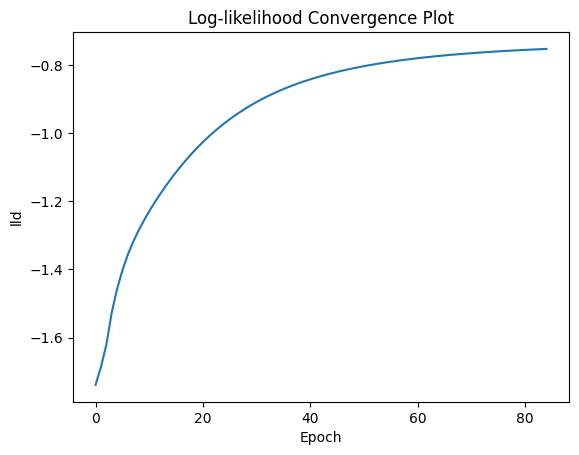

[2024-03-01T10:17:53.332378+00:00] Testing llk: -6.23968e-01
[2024-03-01T10:17:53.333430+00:00] MAE:1.04739, MRE:0.47380
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


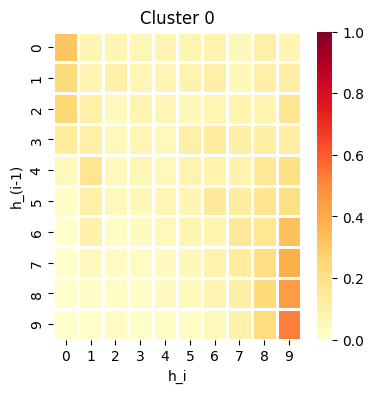

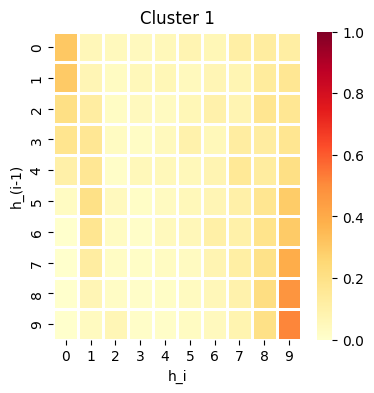

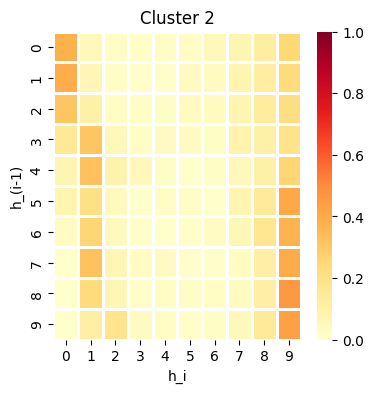

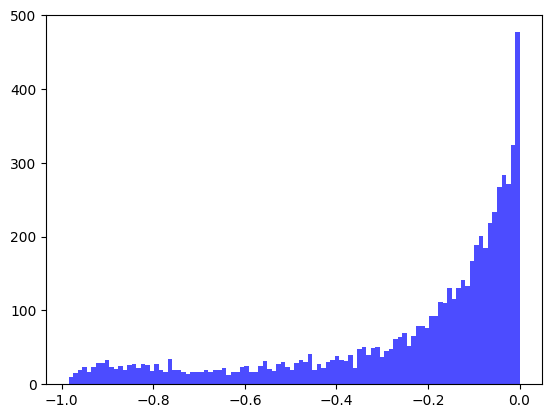

[2024-03-01T10:18:00.628622+00:00] Epochs 85, total loss: 3.04418e+04
[2024-03-01T10:18:00.630048+00:00] Training llk: -7.52340e-01


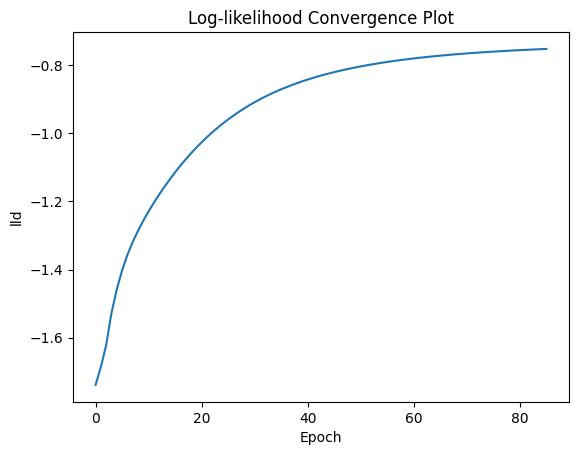

[2024-03-01T10:18:00.896686+00:00] Testing llk: -6.23455e-01
[2024-03-01T10:18:00.897652+00:00] MAE:1.04622, MRE:0.47301
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


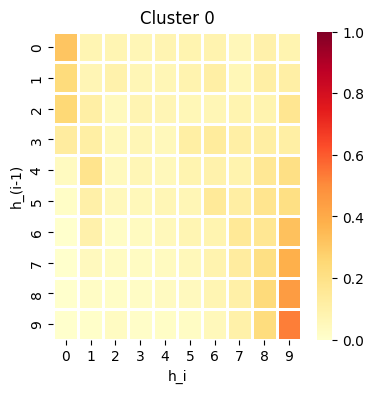

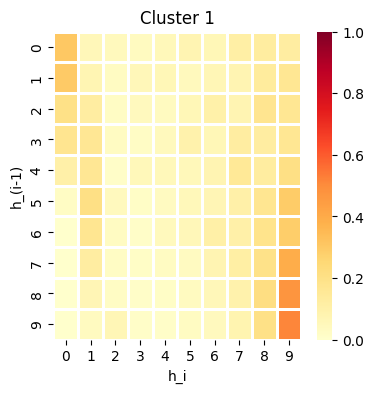

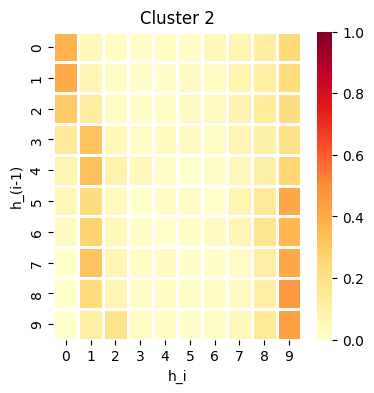

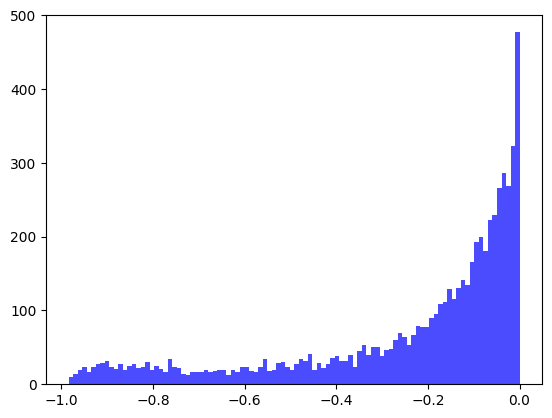

[2024-03-01T10:18:06.748758+00:00] Epochs 86, total loss: 3.04209e+04
[2024-03-01T10:18:06.750227+00:00] Training llk: -7.51705e-01


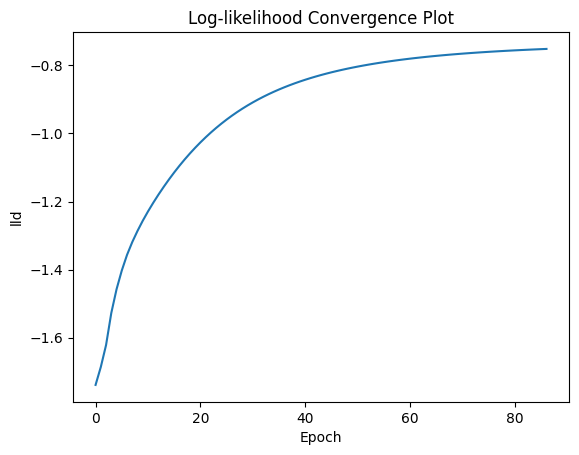

[2024-03-01T10:18:07.040450+00:00] Testing llk: -6.22966e-01
[2024-03-01T10:18:07.041323+00:00] MAE:1.04508, MRE:0.47225
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


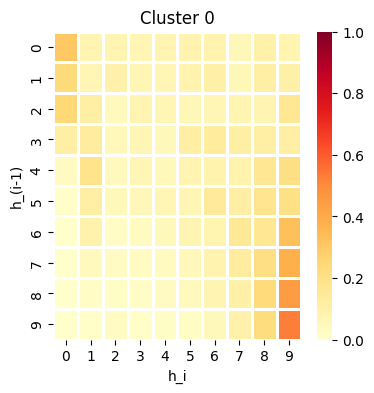

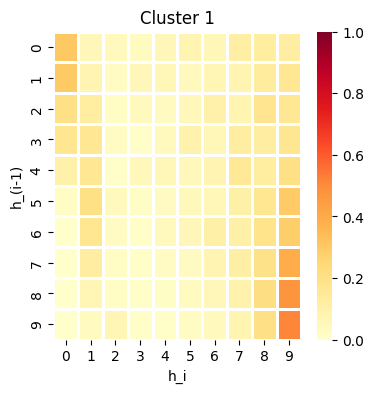

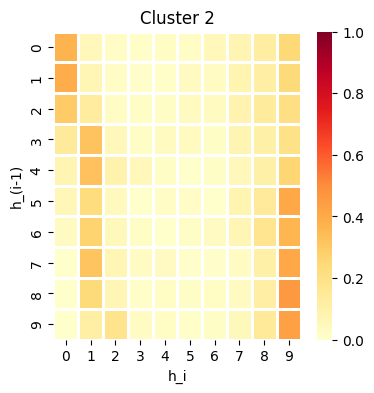

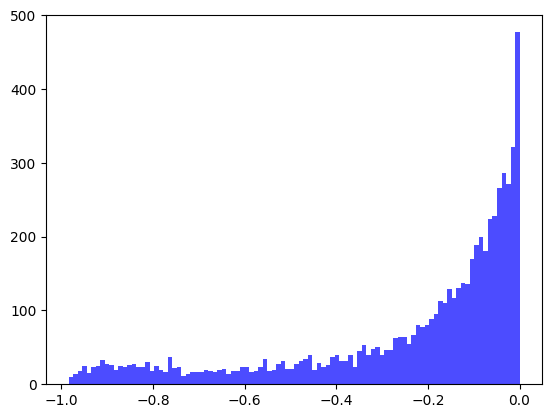

[2024-03-01T10:18:14.113562+00:00] Epochs 87, total loss: 3.04008e+04
[2024-03-01T10:18:14.114807+00:00] Training llk: -7.51092e-01


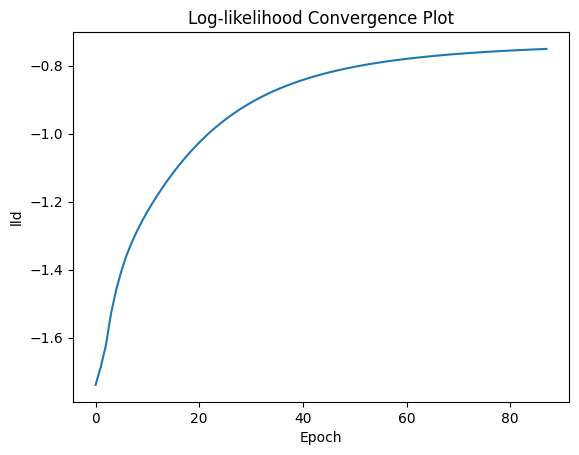

[2024-03-01T10:18:14.393983+00:00] Testing llk: -6.22498e-01
[2024-03-01T10:18:14.396515+00:00] MAE:1.04396, MRE:0.47151
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


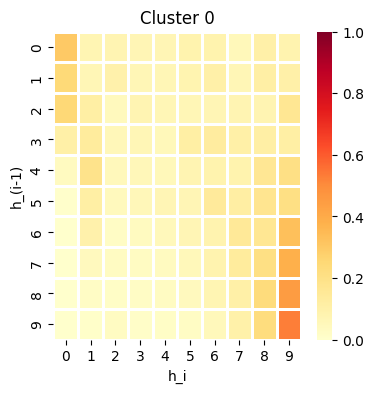

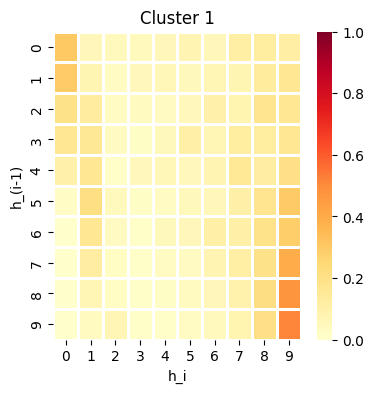

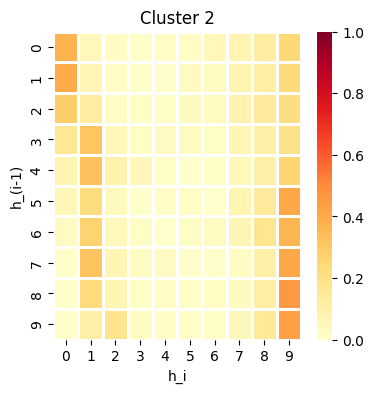

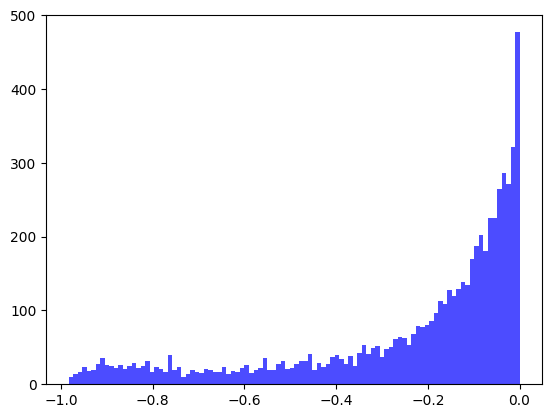

[2024-03-01T10:18:20.588190+00:00] Epochs 88, total loss: 3.03812e+04
[2024-03-01T10:18:20.589414+00:00] Training llk: -7.50501e-01


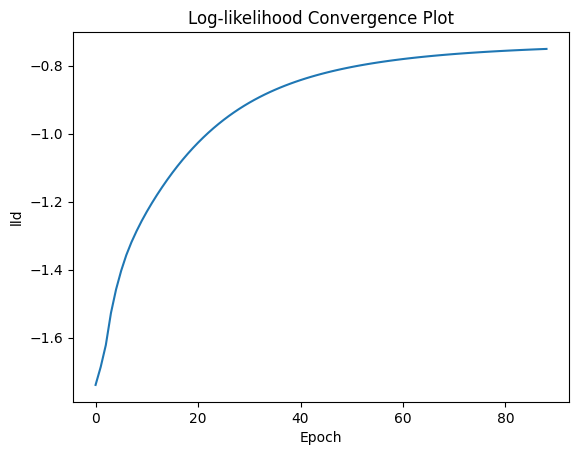

[2024-03-01T10:18:20.836999+00:00] Testing llk: -6.22053e-01
[2024-03-01T10:18:20.837943+00:00] MAE:1.04287, MRE:0.47080
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


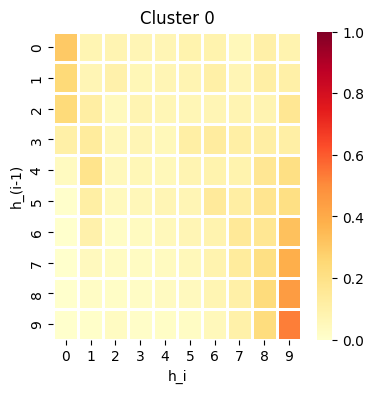

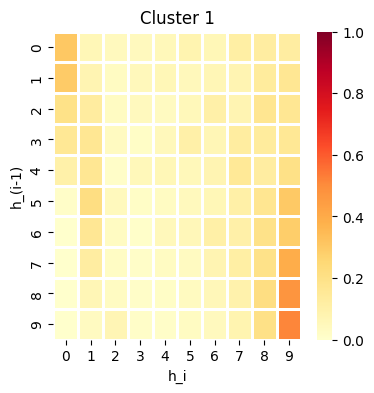

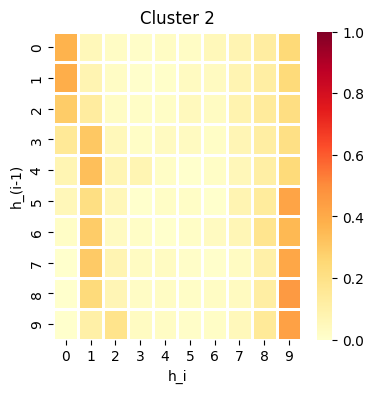

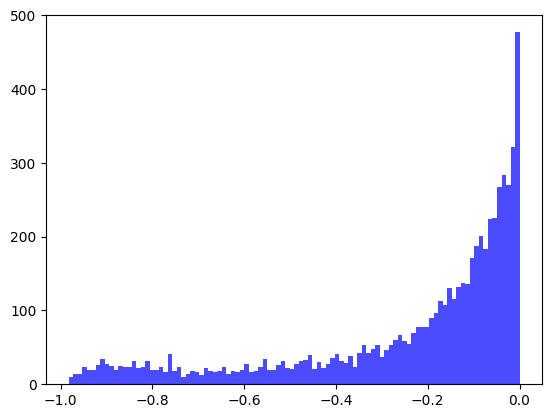

[2024-03-01T10:18:27.908322+00:00] Epochs 89, total loss: 3.03624e+04
[2024-03-01T10:18:27.909621+00:00] Training llk: -7.49932e-01


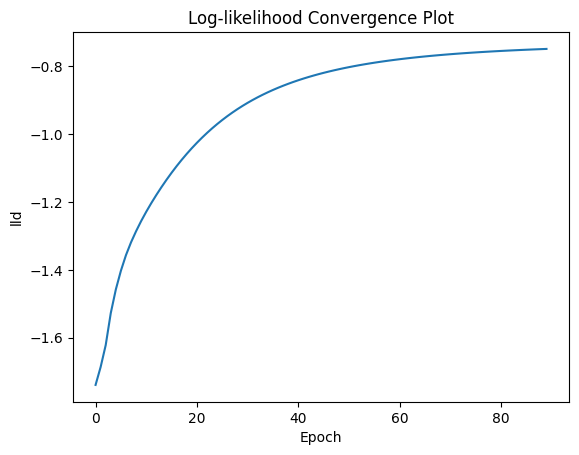

[2024-03-01T10:18:28.303580+00:00] Testing llk: -6.21627e-01
[2024-03-01T10:18:28.304695+00:00] MAE:1.04181, MRE:0.47010
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


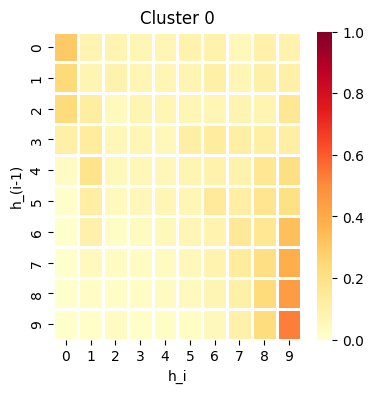

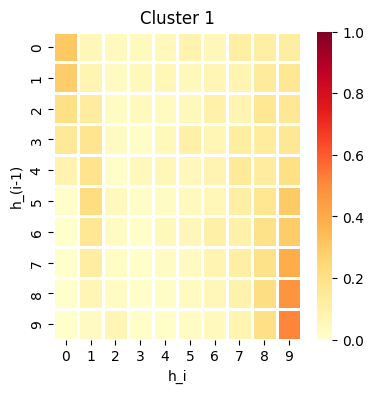

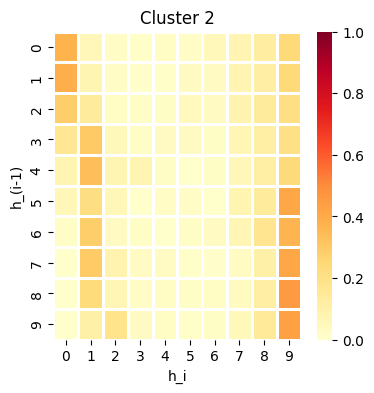

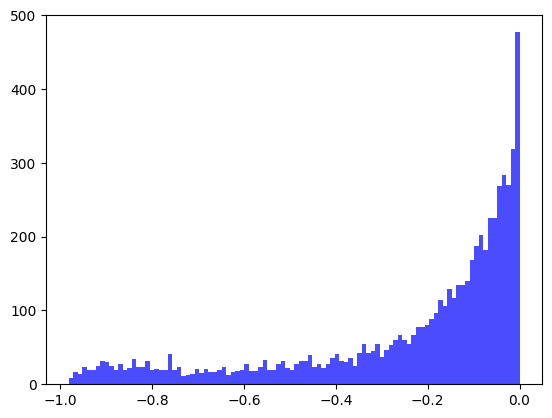

[2024-03-01T10:18:35.255923+00:00] Epochs 90, total loss: 3.03441e+04
[2024-03-01T10:18:35.257642+00:00] Training llk: -7.49382e-01


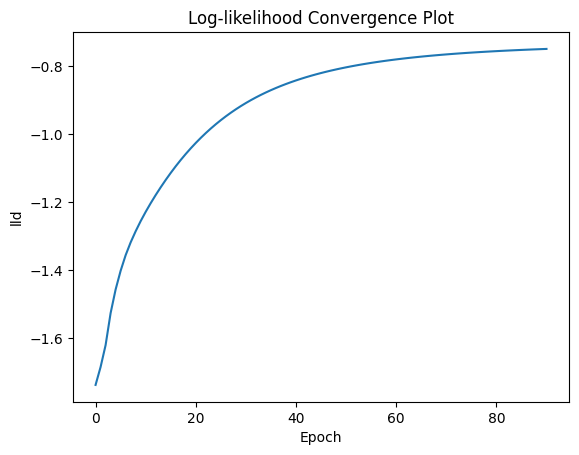

[2024-03-01T10:18:35.648000+00:00] Testing llk: -6.21221e-01
[2024-03-01T10:18:35.648866+00:00] MAE:1.04078, MRE:0.46943
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


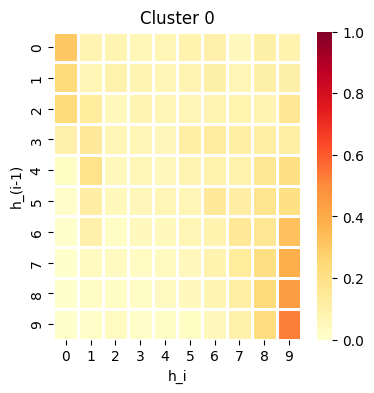

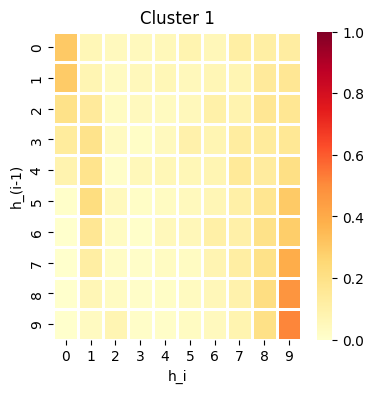

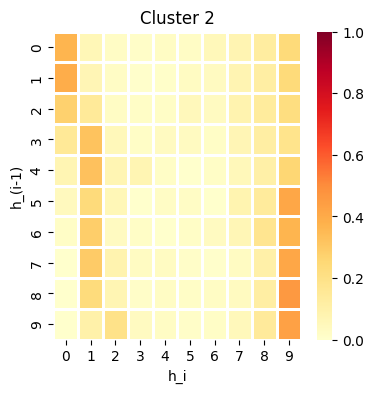

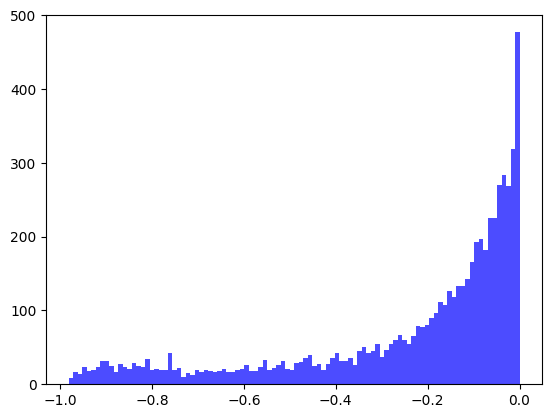

[2024-03-01T10:18:42.940833+00:00] Epochs 91, total loss: 3.03264e+04
[2024-03-01T10:18:42.942062+00:00] Training llk: -7.48851e-01


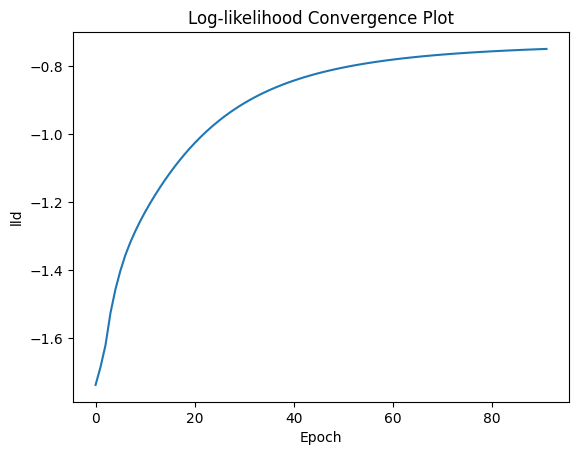

[2024-03-01T10:18:43.209268+00:00] Testing llk: -6.20833e-01
[2024-03-01T10:18:43.210239+00:00] MAE:1.03978, MRE:0.46878
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


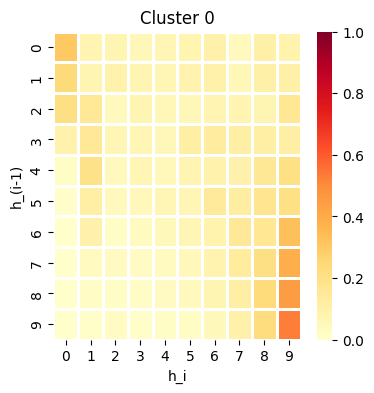

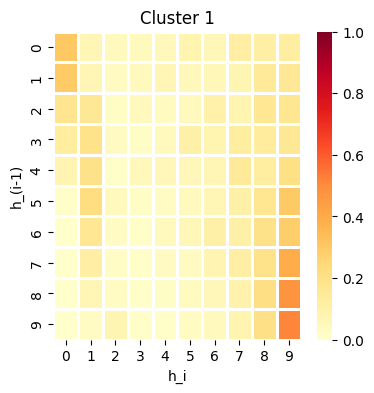

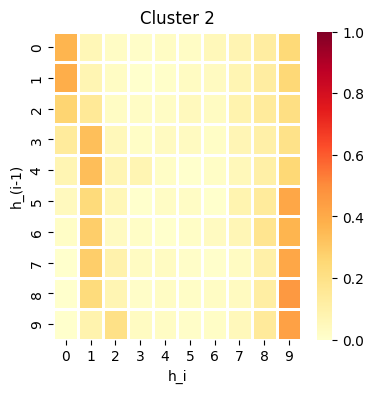

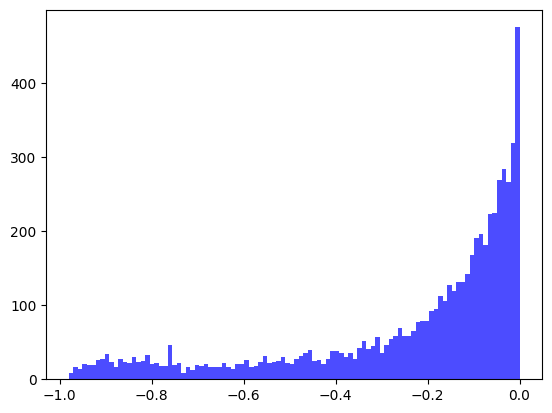

[2024-03-01T10:18:49.397794+00:00] Epochs 92, total loss: 3.03093e+04
[2024-03-01T10:18:49.399102+00:00] Training llk: -7.48339e-01


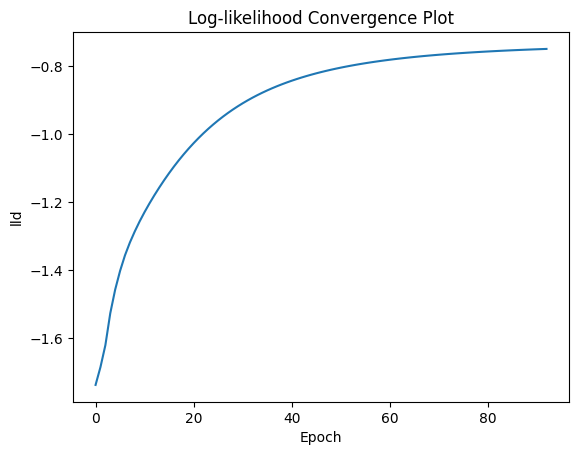

[2024-03-01T10:18:49.714440+00:00] Testing llk: -6.20463e-01
[2024-03-01T10:18:49.715619+00:00] MAE:1.03880, MRE:0.46815
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


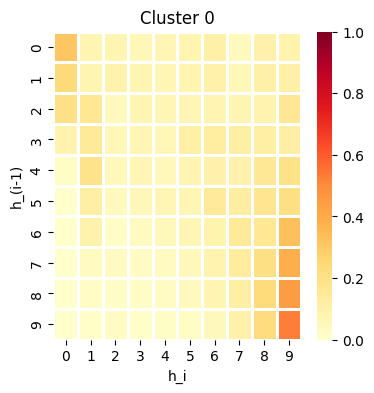

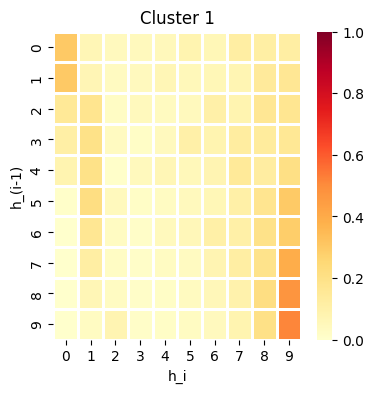

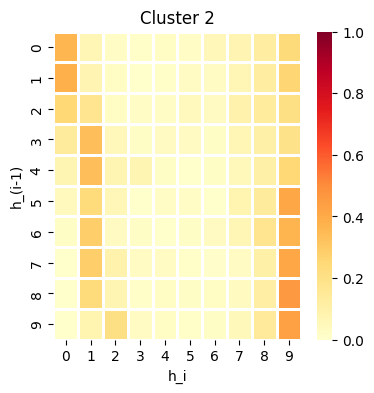

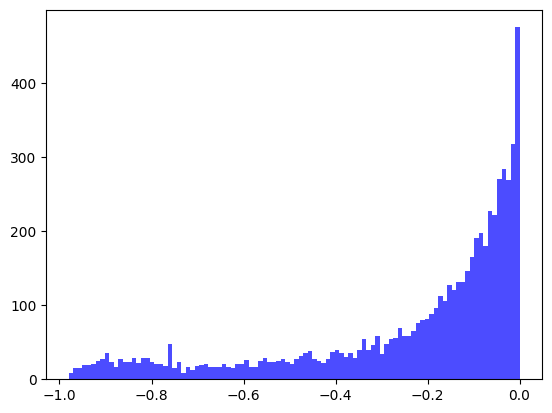

[2024-03-01T10:18:56.541011+00:00] Epochs 93, total loss: 3.02928e+04
[2024-03-01T10:18:56.542186+00:00] Training llk: -7.47844e-01


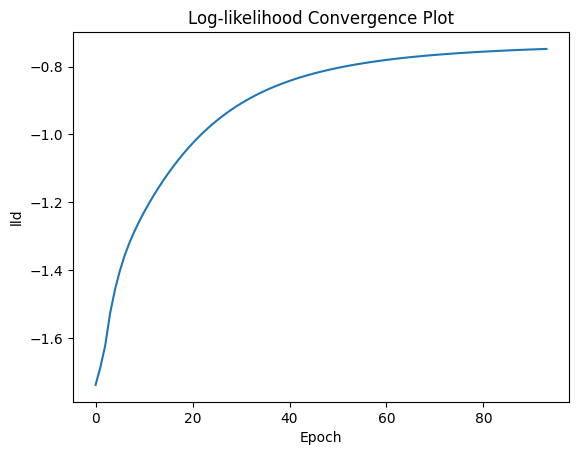

[2024-03-01T10:18:56.822910+00:00] Testing llk: -6.20109e-01
[2024-03-01T10:18:56.823926+00:00] MAE:1.03785, MRE:0.46754
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


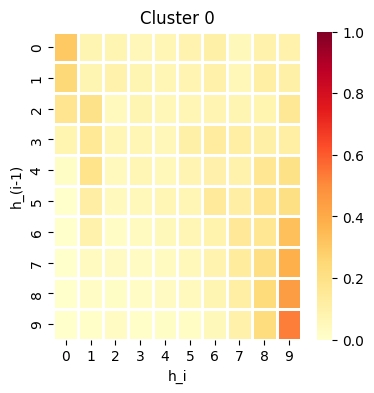

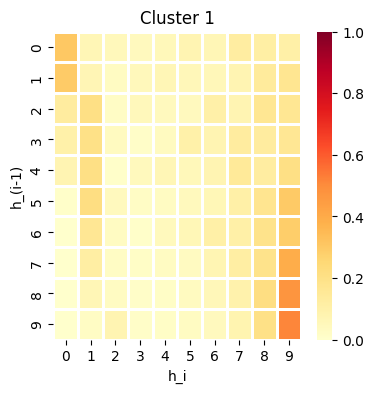

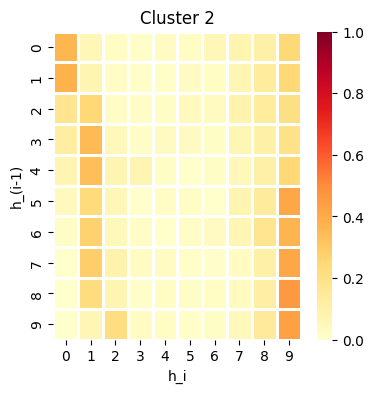

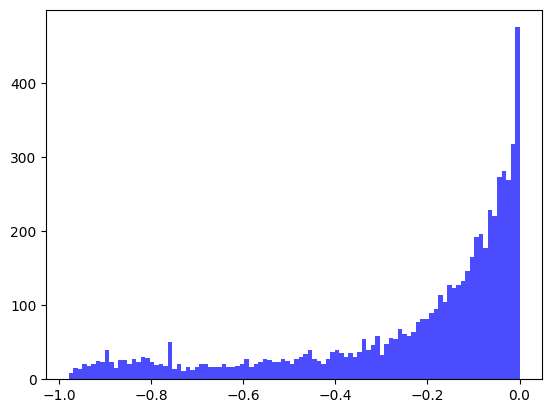

[2024-03-01T10:19:03.029107+00:00] Epochs 94, total loss: 3.02768e+04
[2024-03-01T10:19:03.030461+00:00] Training llk: -7.47366e-01


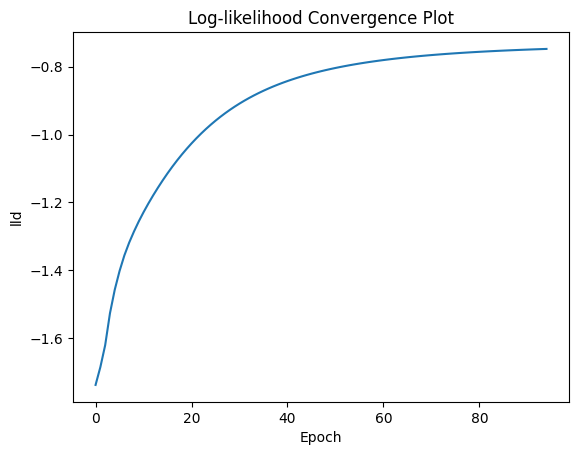

[2024-03-01T10:19:03.767669+00:00] Testing llk: -6.19770e-01
[2024-03-01T10:19:03.768562+00:00] MAE:1.03692, MRE:0.46695
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


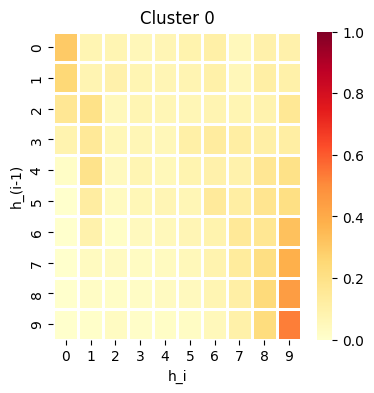

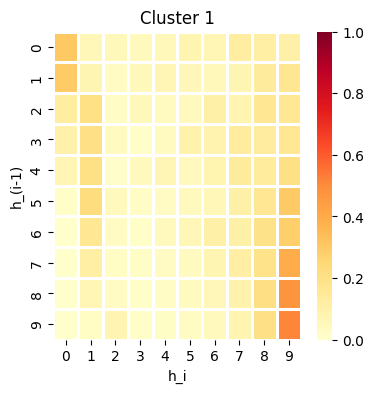

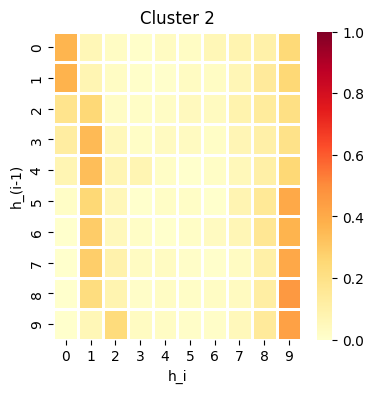

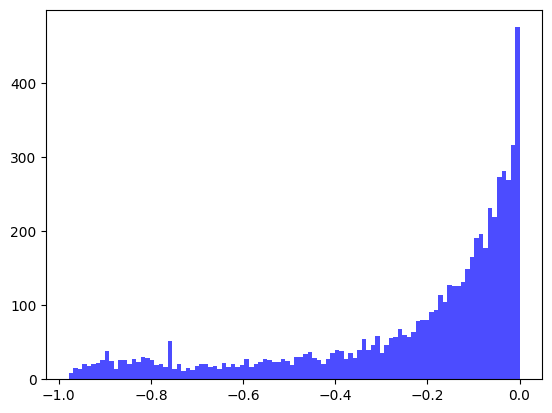

[2024-03-01T10:19:10.423209+00:00] Epochs 95, total loss: 3.02612e+04
[2024-03-01T10:19:10.424599+00:00] Training llk: -7.46903e-01


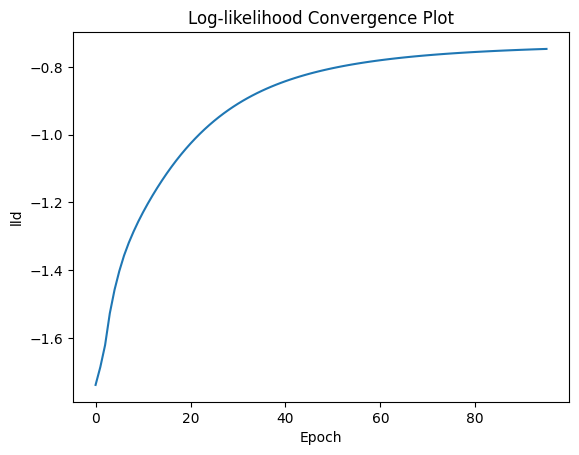

[2024-03-01T10:19:10.671642+00:00] Testing llk: -6.19447e-01
[2024-03-01T10:19:10.672583+00:00] MAE:1.03601, MRE:0.46637
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


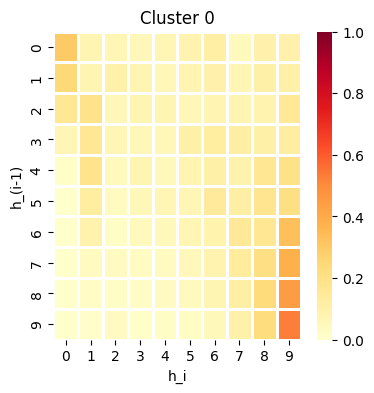

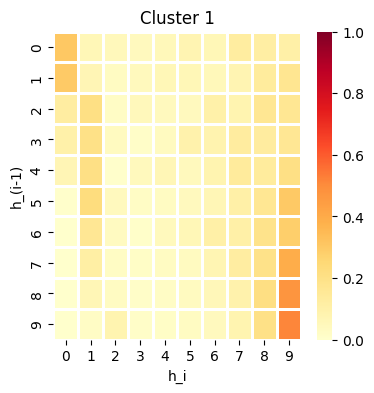

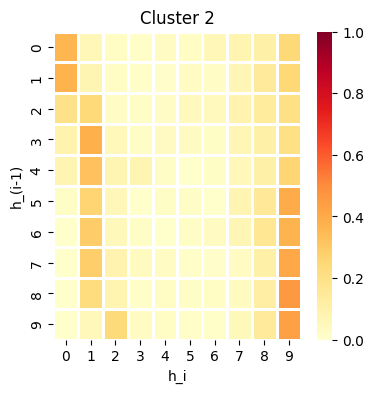

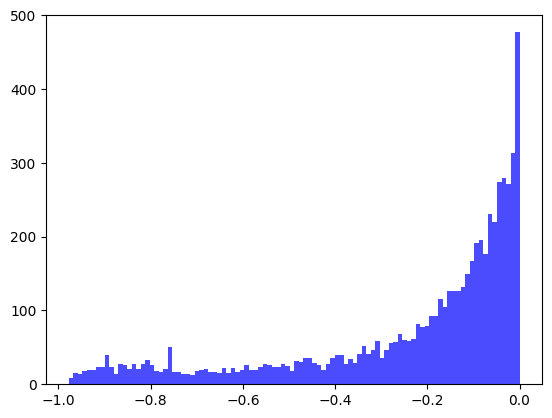

[2024-03-01T10:19:16.809951+00:00] Epochs 96, total loss: 3.02462e+04
[2024-03-01T10:19:16.814972+00:00] Training llk: -7.46456e-01


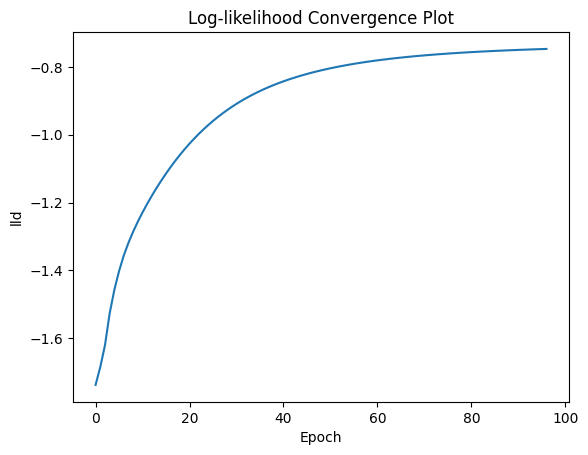

[2024-03-01T10:19:17.167670+00:00] Testing llk: -6.19137e-01
[2024-03-01T10:19:17.168653+00:00] MAE:1.03512, MRE:0.46581
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


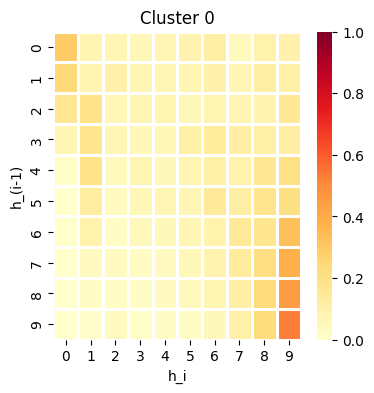

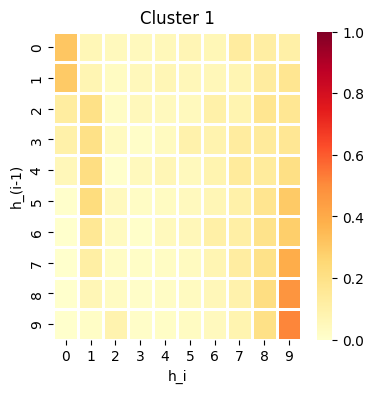

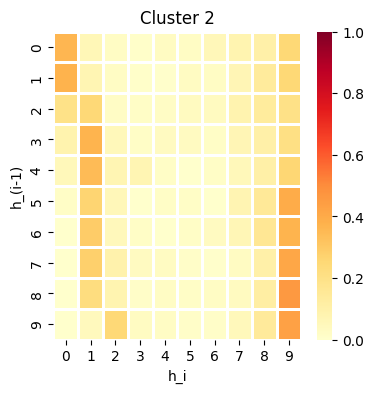

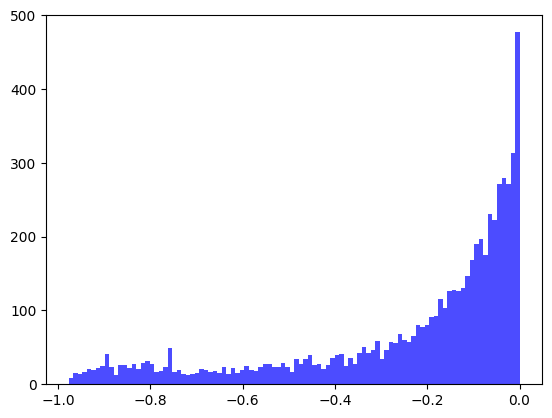

[2024-03-01T10:19:24.464317+00:00] Epochs 97, total loss: 3.02316e+04
[2024-03-01T10:19:24.465752+00:00] Training llk: -7.46024e-01


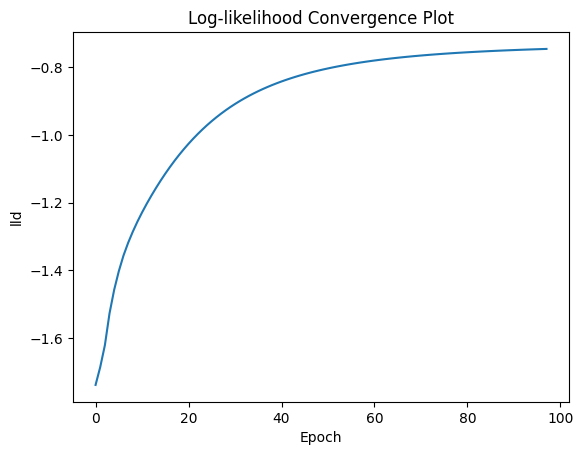

[2024-03-01T10:19:24.726585+00:00] Testing llk: -6.18841e-01
[2024-03-01T10:19:24.727486+00:00] MAE:1.03425, MRE:0.46527
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


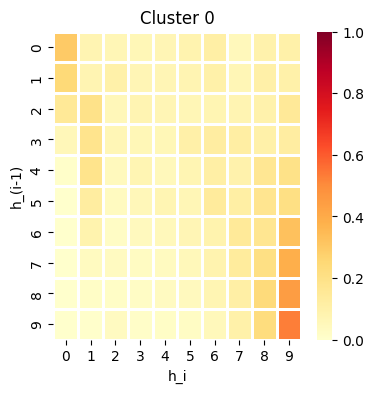

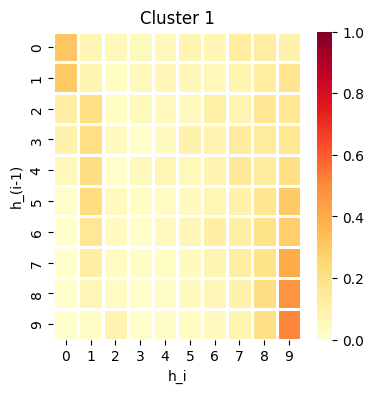

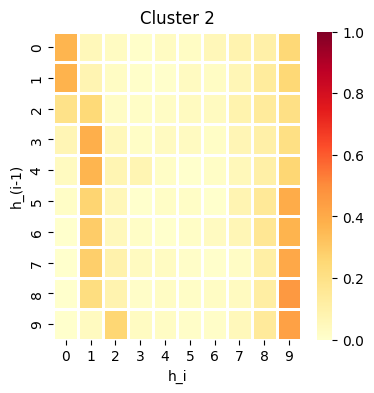

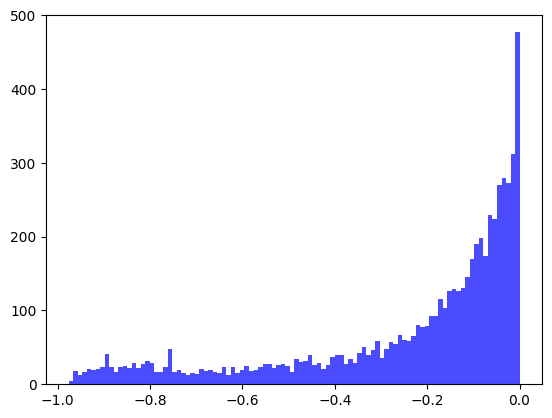

[2024-03-01T10:19:30.878100+00:00] Epochs 98, total loss: 3.02175e+04
[2024-03-01T10:19:30.879238+00:00] Training llk: -7.45606e-01


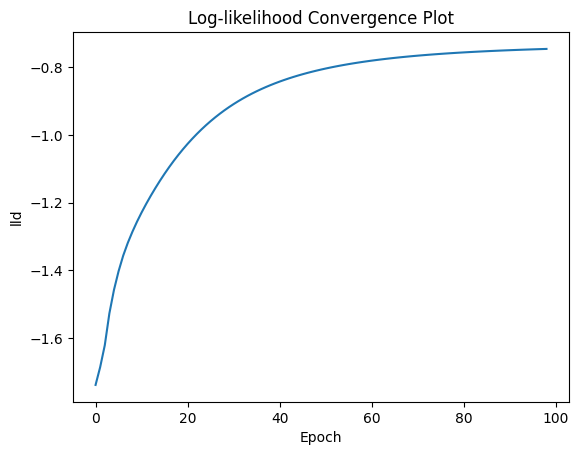

[2024-03-01T10:19:31.204999+00:00] Testing llk: -6.18557e-01
[2024-03-01T10:19:31.205167+00:00] MAE:1.03340, MRE:0.46474
saving model
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
weights calculated
(600, 245, 1)
(600, 245)
histogram trained and saved


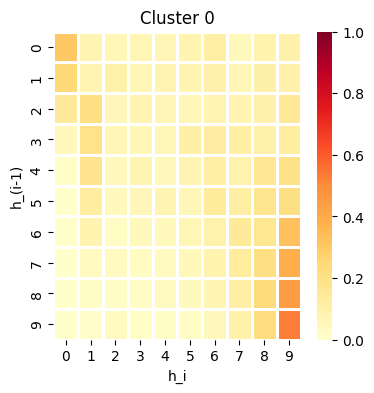

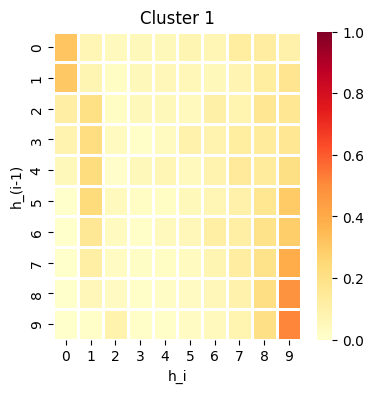

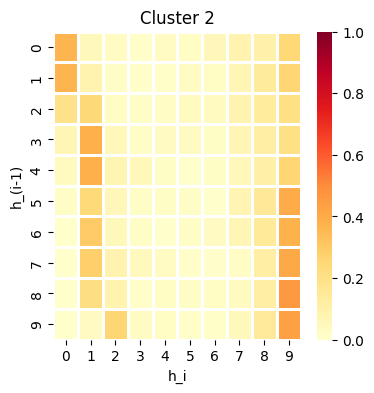

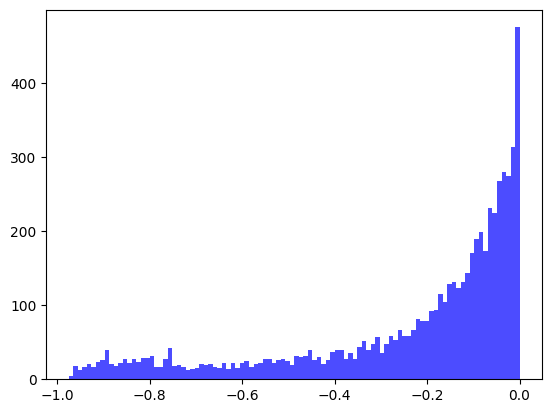

[2024-03-01T10:19:37.987969+00:00] Epochs 99, total loss: 3.02038e+04
[2024-03-01T10:19:37.989122+00:00] Training llk: -7.45201e-01


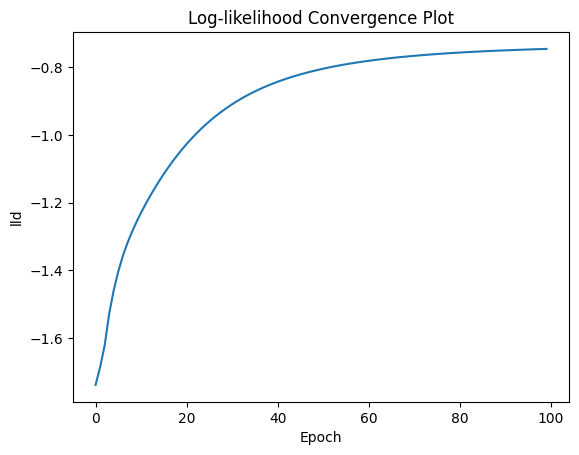

[2024-03-01T10:19:38.250906+00:00] Testing llk: -6.18286e-01
[2024-03-01T10:19:38.251851+00:00] MAE:1.03257, MRE:0.46422
saving model
training done!


In [ ]:

buffer_start_time = 15
buffer_end_time = 30
end_time = raw_test_data.max()

buffer_train_time = [buffer_start_time, buffer_end_time]
buffer_test_time = [buffer_start_time, buffer_end_time]
test_time = [buffer_end_time, end_time]

btrain_lens = ((raw_train_data <= buffer_train_time[1]) * (raw_train_data > buffer_train_time[0])).sum(1)
btest_lens = ((raw_test_data <= buffer_test_time[1]) * (raw_test_data > buffer_train_time[0])).sum(1)
test_lens = ((raw_test_data <= test_time[1]) * (raw_test_data > test_time[0])).sum(1)

buffer_train_data = np.zeros((raw_train_data.shape[0], btrain_lens.max()))
buffer_test_data = np.zeros((raw_test_data.shape[0], btest_lens.max()))
test_data = np.zeros((raw_test_data.shape[0], test_lens.max()))

for i in range(raw_train_data.shape[0]):
    seq = raw_train_data[i]
    buffer_train_data[i, :btrain_lens[i]] = seq[(seq <= buffer_train_time[1]) * (seq > buffer_train_time[0])]

for i in range(raw_test_data.shape[0]):
    seq = raw_test_data[i]
    test_data[i, :test_lens[i]] = seq[(seq <= test_time[1]) * (seq > test_time[0])]
    buffer_test_data[i, :btest_lens[i]] = seq[(seq <= buffer_test_time[1]) * (seq > buffer_train_time[0])]

buffer_train_data = np.concatenate((np.ones_like(buffer_train_data[:, :1]) * buffer_train_time[0], buffer_train_data), axis=-1)
buffer_test_data = np.concatenate((np.ones_like(buffer_test_data[:, :1]) * buffer_test_time[0], buffer_test_data), axis=-1)

test_data_ = generate_event_mark(test_data)
buffer_train_data_ = generate_event_mark(buffer_train_data)
buffer_test_data_ = generate_event_mark(buffer_test_data)


print(test_data_.shape, buffer_train_data_.shape, buffer_test_data_.shape)
ngrid = 100

ts = np.linspace(test_time[0], test_time[1], ngrid)
true_lams = Exponential_Hawkes(ts, raw_test_data, mu=true_mu, alpha=true_alpha, beta=true_beta)

event_loglams = 0
for i in range(raw_test_data.shape[0]):
    ts = raw_test_data[i, :][(raw_test_data[i, :] <= test_time[1]) * (raw_test_data[i, :] > test_time[0])]
    if len(ts) == 0: continue
    lams = Exponential_Hawkes(ts, raw_test_data[[i], :], mu=true_mu, alpha=true_alpha, beta=true_beta)
    event_loglams += np.log(lams).sum()

(event_loglams - true_lams.sum() * (test_time[1] - test_time[0]) / ngrid) / ((raw_test_data <= test_time[1]) * (raw_test_data > test_time[0])).sum()

for Tm in [100.]:

    if torch.cuda.is_available():
        device = torch.device('cuda')
        print("You are using GPU acceleration.")
        print("Number of CUDAs(cores): ", torch.cuda.device_count())
    else:
        device = torch.device("cpu")
        print("CUDA is not Available. You are using CPU only.")
        print("Number of cores: ", os.cpu_count())

    # device="cpu"

    print(Tm)
    T = [buffer_end_time, Tm]
    tau_max = 10.
    baserate = true_mu
    nsample = 10
    n_class = 1
    n_cluster = 3
    int_res = 200
    hid_dim = 1
    batch_size = 50
    train_size = 1000
    lr = 0.01
    epoch = 100
    config = config_generate(T0=str(T[0]),
                            T1=str(T[1]),
                            tau_max=str(tau_max),
                            nsample=str(nsample),
                            int_res=str(int_res),
                            n_class=str(n_class),
                            n_cluster = str(n_cluster),
                            lr=str(lr),
                            epoch=str(epoch),
                            hid_dim=str(hid_dim),
                            batch_size=str(batch_size))
    config.own_event_embed = False
    config.bptt = 10
    config.alpha = true_alpha

    train_lens = ((raw_train_data <= Tm) * (raw_train_data > T[0])).sum(1)
    train_data = np.zeros((raw_train_data.shape[0], train_lens.max()))
    for i in range(train_data.shape[0]):
        seq = raw_train_data[i]
        train_data[i, :train_lens[i]] = seq[(seq <= Tm) * (seq > T[0])]

    train_data_ = generate_event_mark(train_data)


    # seeds = [300, 816, 2999]
    # seeds = [1000, 2000, 3000]
    seeds = [0]

    for seed in seeds:
        # torch.random.manual_seed(seed)
        random.seed(seed)

        train_idx = np.arange(train_data_.shape[0])
        # random.shuffle(train_idx)
        train_data2 = train_data_[train_idx[:train_size]]
        buffer_train_data2 = buffer_train_data_[train_idx[:train_size]]

        nh_model = NH_new(config, device)
        num_paras = count_parameters(nh_model)
        print("#parameters: %d" % num_paras)

        for name, parameter in nh_model.named_parameters():
            if name == "baserate_mu":
                # parameter.data.fill_(random.uniform(0.4, 0.5))
                parameter.data.fill_(baserate)
            else:
                parameter.data.fill_(random.gauss(0, 0.01))

        ts = np.linspace(test_time[0], test_time[1], ngrid)
        true_lams = Exponential_Hawkes(ts, raw_test_data, mu=true_mu, alpha=true_alpha, beta=true_beta)

        # model = torch.load(save_path + "/model-%d.pt" % 816)

        nh_model, train_llks, test_llks, test_maes, test_mres, wall_time, train_lld_batches = model_train(train_data2,
                                                                                       test_data_,
                                                                                       buffer_train_data2,
                                                                                       buffer_test_data_,
                                                                                       train_cluster_data,
                                                                                       nh_model,
                                                                                       config,
                                                                                       device,
                                                                                       True, ts, true_lams)


100
(12, 100)


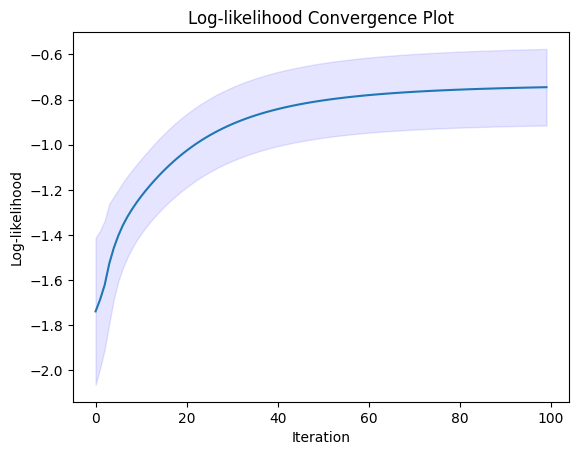

In [ ]:
### This block plots the evolution of log-likelihood during training iterations.
### They will be split off into a separate file for plotting
import scipy.stats as st

# we need to following two variables
print(len(train_llks))
print(train_lld_batches.shape)
#print(train_llks)

n_batches, n_iter = train_lld_batches.shape
lb = np.zeros((n_iter,))
ub = np.zeros((n_iter,))

# plotting codes
plt.figure()
plt.plot(train_llks)
# for i in range(n_batches):
#   temp = -train_lld_batches[i,:]
#   plt.plot(temp, color = 'black', alpha = 0.05)
for j in range(n_iter):
  temp = -train_lld_batches[:,j]
  lb[j] = min(temp)
  ub[j] = max(temp)

plt.fill_between( range(n_iter), train_llks - (ub-lb)/2,train_llks + (ub-lb)/2, color='b', alpha=.1)
plt.title('Log-likelihood Convergence Plot')
plt.xlabel('Iteration')
plt.ylabel('Log-likelihood')
plt.show()



In [ ]:
np.save('lld.npy', train_llks)
np.save('lld-batch.npy', train_lld_batches)

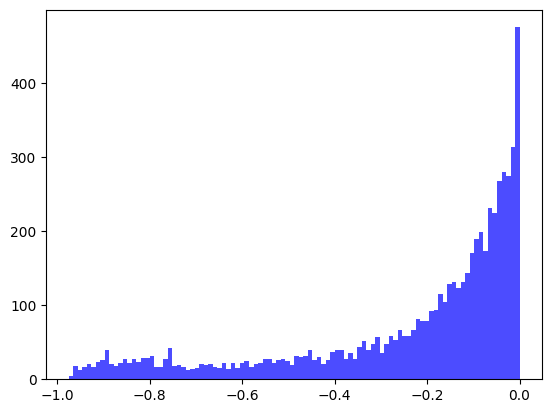

(6292,)


Text(0.5, 1.0, 'Conditional Intensity')

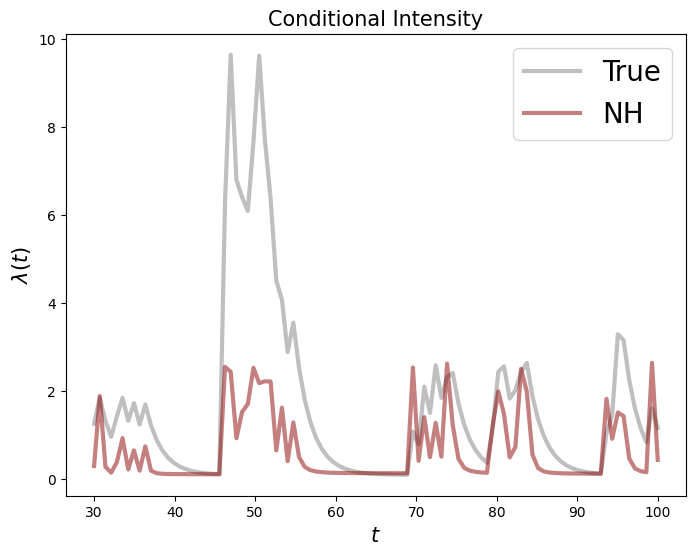

In [ ]:
test_time[1]
ts = np.linspace(test_time[0], test_time[1], ngrid)

nh_lams, h1_plot = nh_model.sample_intensity(ts,
                              torch.tensor(test_data_, dtype=torch.float32),
                              torch.tensor(buffer_test_data_, dtype=torch.float32),
                              device="cpu")
true_lams = Exponential_Hawkes(ts, raw_test_data, mu=true_mu, alpha=true_alpha, beta=true_beta)

print(h1_plot.shape)

# print(np.mean(np.abs(lams - true_lams)))
# print(np.mean(np.abs(lams - true_lams) / true_lams))

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)

plot_idx = 0
ax.plot(ts, true_lams[plot_idx], color="gray", alpha=0.5, linewidth=3, label="True")
ax.plot(ts, nh_lams[plot_idx], color="darkred", alpha=0.5, linewidth=3, label="NH")
# ax.set_ylim(0, 10)
ax.legend(fontsize=20)
ax.set_xlabel(r"$t$", fontsize=15)
ax.set_ylabel(r"$\lambda(t)$", fontsize=15)
ax.set_title("Conditional Intensity", fontsize = 15)
# ax.set_xlim(150, 170)

Text(0.5, 1.0, 'Conditional Intensity')

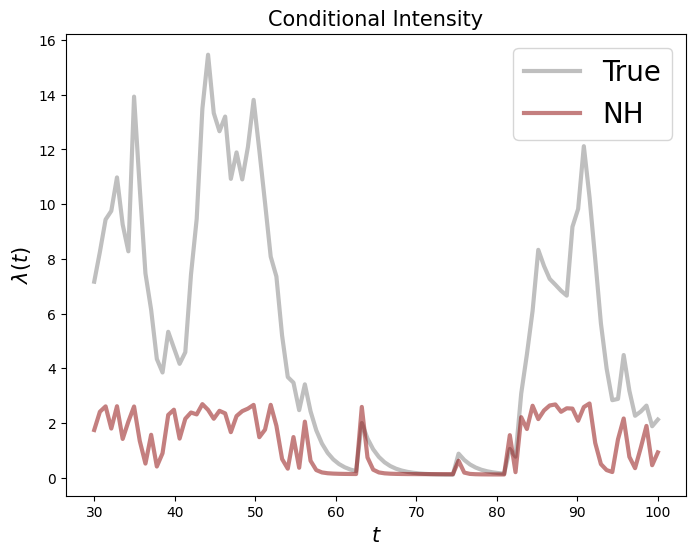

In [ ]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)

plot_idx = 5
ax.plot(ts, true_lams[plot_idx], color="gray", alpha=0.5, linewidth=3, label="True")
ax.plot(ts, nh_lams[plot_idx], color="darkred", alpha=0.5, linewidth=3, label="NH")
# ax.set_ylim(0, 10)
ax.legend(fontsize=20)
ax.set_xlabel(r"$t$", fontsize=15)
ax.set_ylabel(r"$\lambda(t)$", fontsize=15)
ax.set_title("Conditional Intensity", fontsize = 15)
# ax.set_xlim(150, 170)

In [ ]:
mae = []

for plot_idx in range(50):
  mae.append(np.mean(np.abs(nh_lams[plot_idx] - true_lams[plot_idx])))

print("MAE (first cluster): ", np.mean(np.array(mae)))


MAE (first cluster):  0.9846328195637719


(50, 171, 2)
(50, 38, 2)


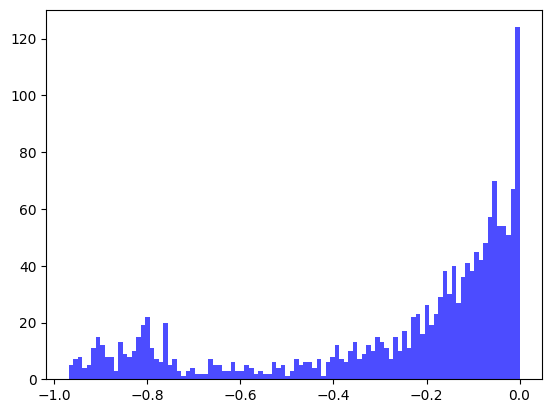

Text(0.5, 1.0, 'Conditional Intensity')

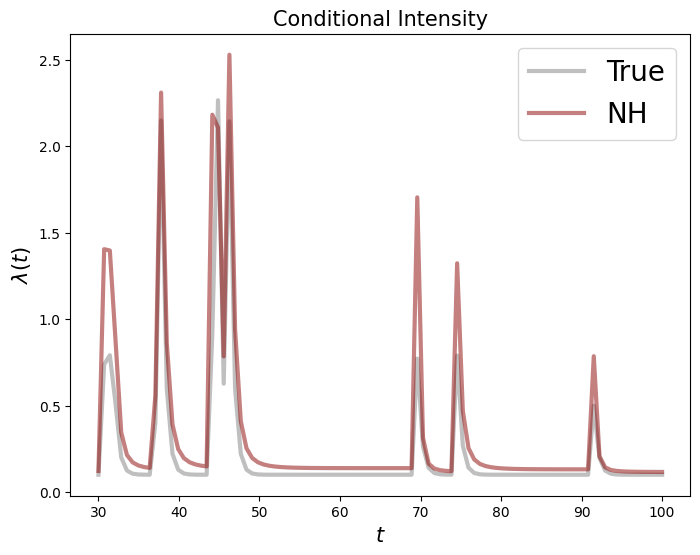

In [ ]:
test_data_2 = np.zeros((raw_test_data_2.shape[0], test_lens.max()))

btest_lens = ((raw_test_data_2 <= buffer_test_time[1]) * (raw_test_data_2 > buffer_train_time[0])).sum(1)
test_lens = ((raw_test_data_2 <= test_time[1]) * (raw_test_data_2 > test_time[0])).sum(1)

buffer_test_data2 = np.zeros((raw_test_data_2.shape[0], btest_lens.max()))

for i in range(raw_test_data_2.shape[0]):
    seq = raw_test_data_2[i]
    test_data_2[i, :test_lens[i]] = seq[(seq <= test_time[1]) * (seq > test_time[0])]
    buffer_test_data2[i, :btest_lens[i]] = seq[(seq <= buffer_test_time[1]) * (seq > buffer_train_time[0])]

buffer_test_data_2 = np.concatenate((np.ones_like(buffer_test_data2[:, :1]) * buffer_test_time[0], buffer_test_data2), axis=-1)

test_data_2_ = generate_event_mark(test_data_2)
buffer_test_data_2_ = generate_event_mark(buffer_test_data_2)

test_time[1]
ts = np.linspace(test_time[0], test_time[1], ngrid)
true_beta = 2.0

nh_lams, h2_plot = nh_model.sample_intensity(ts,
                              torch.tensor(test_data_2_, dtype=torch.float32),
                              torch.tensor(buffer_test_data_2_, dtype=torch.float32),
                              device="cpu")
true_lams = Exponential_Hawkes(ts, raw_test_data_2, mu=true_mu, alpha=true_alpha, beta=true_beta)

# print(np.mean(np.abs(lams - true_lams)))
# print(np.mean(np.abs(lams - true_lams) / true_lams))

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)

plot_idx = 0
ax.plot(ts, true_lams[plot_idx], color="gray", alpha=0.5, linewidth=3, label="True")
ax.plot(ts, nh_lams[plot_idx], color="darkred", alpha=0.5, linewidth=3, label="NH")
# ax.set_ylim(0, 10)
ax.legend(fontsize=20)
ax.set_xlabel(r"$t$", fontsize=15)
ax.set_ylabel(r"$\lambda(t)$", fontsize=15)
ax.set_title("Conditional Intensity", fontsize = 15)
# ax.set_xlim(150, 170)

In [ ]:
mae = []

for plot_idx in range(50):
  mae.append(np.mean(np.abs(nh_lams[plot_idx] - true_lams[plot_idx])))

print("MAE (second cluster): ", np.mean(np.array(mae)))


MAE (second cluster):  0.11194941736109072


(50, 78, 2)
(50, 23, 2)


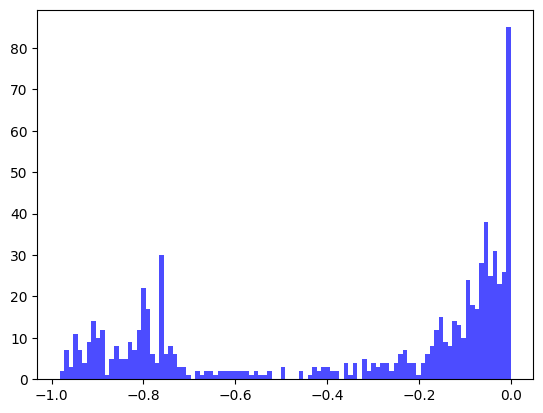

Text(0.5, 1.0, 'Conditional Intensity')

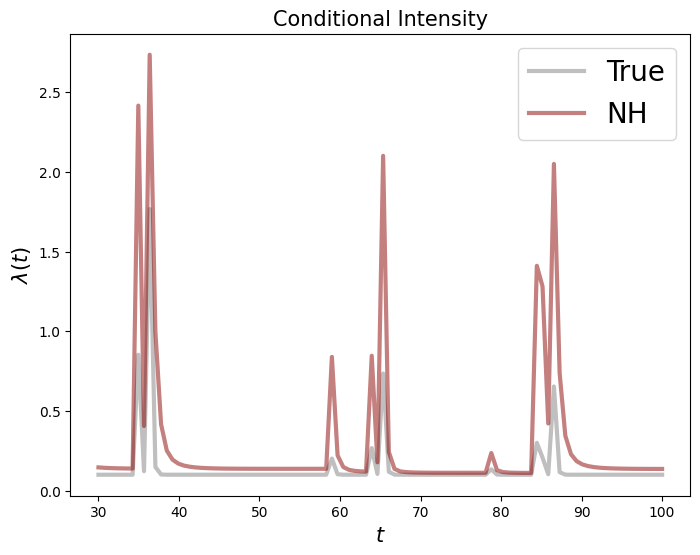

In [ ]:
test_data_3 = np.zeros((raw_test_data_3.shape[0], test_lens.max()))

btest_lens = ((raw_test_data_3 <= buffer_test_time[1]) * (raw_test_data_3 > buffer_train_time[0])).sum(1)
test_lens = ((raw_test_data_3 <= test_time[1]) * (raw_test_data_3 > test_time[0])).sum(1)

buffer_test_data3 = np.zeros((raw_test_data_3.shape[0], btest_lens.max()))

for i in range(raw_test_data_3.shape[0]):
    seq = raw_test_data_3[i]
    test_data_3[i, :test_lens[i]] = seq[(seq <= test_time[1]) * (seq > test_time[0])]
    buffer_test_data3[i, :btest_lens[i]] = seq[(seq <= buffer_test_time[1]) * (seq > buffer_train_time[0])]

buffer_test_data_3 = np.concatenate((np.ones_like(buffer_test_data3[:, :1]) * buffer_test_time[0], buffer_test_data3), axis=-1)

test_data_3_ = generate_event_mark(test_data_3)
buffer_test_data_3_ = generate_event_mark(buffer_test_data_3)

test_time[1]
ts = np.linspace(test_time[0], test_time[1], ngrid)
true_beta = 5.0

nh_lams, h3_plot = nh_model.sample_intensity(ts,
                              torch.tensor(test_data_3_, dtype=torch.float32),
                              torch.tensor(buffer_test_data_3_, dtype=torch.float32),
                              device="cpu")
true_lams = Exponential_Hawkes(ts, raw_test_data_3, mu=true_mu, alpha=true_alpha, beta=true_beta)

# print(np.mean(np.abs(lams - true_lams)))
# print(np.mean(np.abs(lams - true_lams) / true_lams))

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)

plot_idx = 0
ax.plot(ts, true_lams[plot_idx], color="gray", alpha=0.5, linewidth=3, label="True")
ax.plot(ts, nh_lams[plot_idx], color="darkred", alpha=0.5, linewidth=3, label="NH")
# ax.set_ylim(0, 10)
ax.legend(fontsize=20)
ax.set_xlabel(r"$t$", fontsize=15)
ax.set_ylabel(r"$\lambda(t)$", fontsize=15)
ax.set_title("Conditional Intensity", fontsize = 15)
# ax.set_xlim(150, 170)

In [ ]:
mae = []

for plot_idx in range(50):
  mae.append(np.mean(np.abs(nh_lams[plot_idx] - true_lams[plot_idx])))

print("MAE (third cluster): ", np.mean(np.array(mae)))


MAE (third cluster):  0.1169851116800032


In [ ]:
print(h1_plot.shape)
print(h2_plot.shape)
print(h3_plot.shape)
H_map_final = np.load('H_map.npy')
print(H_map_final.shape)
np.save('h1_smp.npy', h1_plot)
np.save('h2_smp.npy', h2_plot)
np.save('h3_smp.npy', h3_plot)

(6292,)
(1582,)
(760,)
(10, 10, 3)
